In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from math import ceil
import shelve
from tqdm import tqdm

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, make_scorer
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.base import BaseEstimator, ClassifierMixin
from itertools import combinations

from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.svm import SVC

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.callbacks import EarlyStopping


SEED = 25

In [2]:
df = pd.read_csv(r'D:\hse_iot\VKR\my_inspector\data\classification_dataset.csv')
df['class'] = round(df['class'] / 10).astype(int)
df = df[df['class'] != 1]
_type = df['type'].to_list()
df = df.drop(['name', 'side_mistake',
              'vs', 'squared_vs', 'ttr', 'root_ttr',
              'log_ttr', 'uber_ttr', 'd', 'vvi',
              'squared_vv', 'punct_mistakes_pp',
              'punct_mistakes_because',
              'punct_mistakes_but', 'punct_mistakes_compare'], axis=1)

df.head(2)

,av_depth,max_depth,min_depth,num_acl,num_rel_cl,num_advcl,num_sent,num_tok,av_tok_before_root,av_len_sent,...,num_linkings,num_4grams,num_func_ngrams,num_shell_noun,num_misspelled_tokens,million_mistake,text,class,type,sum_punct
0,3.56,6,2,2,0,1,18,244,4.39,13.56,...,5,1,0,0,2,0,This two line graphs illustrates monthly avera...,6,1,0
1,5.43,10,4,1,3,1,7,175,6.29,25.00,...,6,1,0,0,3,0,"﻿We have two graphics, which show us the popul...",6,1,0


In [3]:
df['class'].value_counts()

6    2680
7     308
5     215
4     122
8      77
2      24
3      14
Name: class, dtype: int64

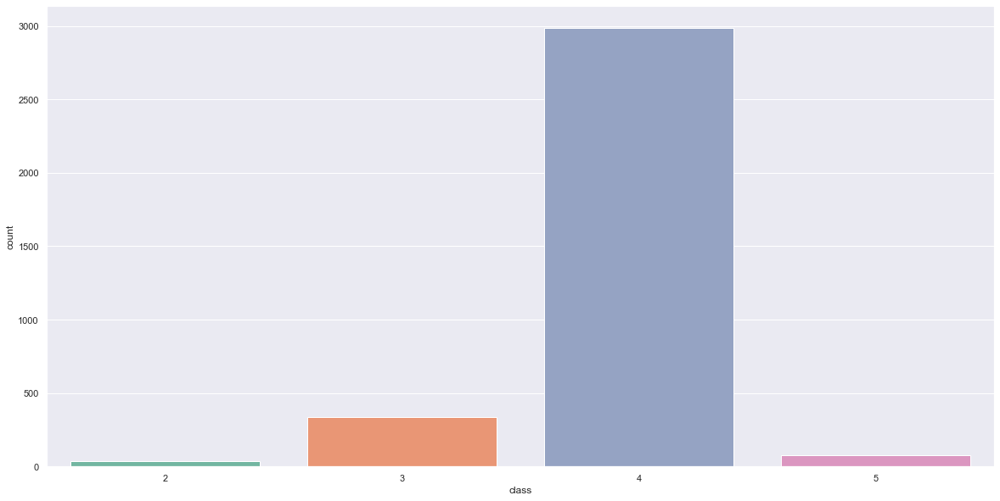

In [4]:
df.loc[df['class'] == 1, 'class'] = 2
df.loc[df['class'] == 3, 'class'] = 2
df.loc[df['class'] == 4, 'class'] = 3
df.loc[df['class'] == 5, 'class'] = 3
df.loc[df['class'] == 6, 'class'] = 4
df.loc[df['class'] == 7, 'class'] = 4
df.loc[df['class'] == 8, 'class'] = 5

sns.set(rc={'figure.figsize':(20,10)})
sns_plt = sns.countplot(x='class', data=df, palette="Set2")

Т.к. имеем очень малое количество текстов во всех классах кроме 4, то сгенерируем тексты скомпоновав их половины

In [73]:
df_gen = pd.read_csv(r'D:\hse_iot\VKR\my_inspector\data\generated_data.csv', index_col='idx')
df_gen.drop(['squared_vs', 'root_ttr', 'uber_ttr', 'ttr', 'd', 'vvi', 'squared_vv', 'vs', 'log_ttr'],  inplace=True, axis=1)
df_gen.head(2)

,av_depth,max_depth,min_depth,num_acl,num_rel_cl,num_advcl,num_sent,num_tok,av_tok_before_root,av_len_sent,...,num_pres_plur,num_past_part,num_past_simple,num_linkings,num_4grams,num_func_ngrams,million_mistake,text,sum_punct,cls
idx,,,,,,,,,,,,,,,,,,,,,
0,3.69,7,2,2,2,0,13,189,4.23,14.54,...,0,2,4,6,3,1,0,The graph illustrates the market situation abo...,0,4
1,3.93,7,2,1,3,1,15,244,4.80,16.27,...,0,3,0,13,2,0,0,There is a linegraph and piechart. The linegra...,0,4


In [74]:
df_gen['cls'].value_counts()

5    2441
4    2386
3    2257
2    2016
Name: cls, dtype: int64

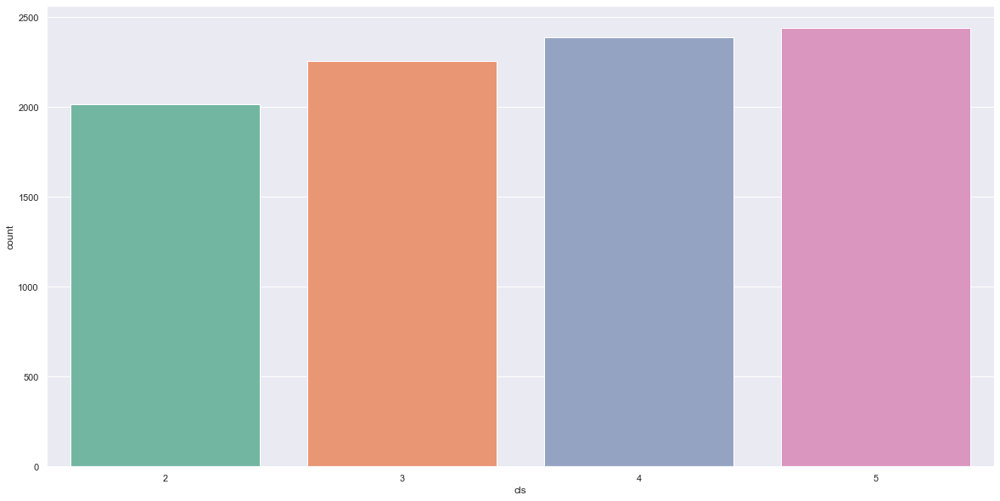

In [75]:
sns.set(rc={'figure.figsize':(20,10)})
sns_plt = sns.countplot(x='cls', data=df_gen, palette="Set2")

Данные тексты сгенерированы только из тренировочных данных, тестовые оставим неизменными в качестве выборки валидации

In [119]:
class Results:
    def __init__(self, train_data, test_x, test_y):
        self.texts = train_data['text'].copy()
        self.train_y = train_data['cls'].copy()
        self.feature_columns = [col for col in train_data.columns if col not in ['cls', 'text']]
        self.train_x = train_data[self.feature_columns].copy()
        self.test_x = test_x[self.feature_columns].copy()
        self.test_y = test_y
        
        # классы для нейронных сетей
        #self.train_y_nn = self.ohe(self.train_y)
        #self.test_y_nn = self.ohe(self.test_y)
        
        #self.nn_scorer = make_scorer(self.custom_scorer, greater_is_better=True)
        
        # Изменение размерности входных данных для сверточных нейросетей
        #train_x2 = np.array(self.train_x)
        #test_x2 = np.array(self.test_x)
        #self.train_x_cnv = train_x2.reshape(-1, 57, 1)
        #self.test_x_cnv = test_x2.reshape(-1, 57, 1)
    
    def ohe(self, y):
        y_nn = []
        for y in y:
            dummy = np.zeros(4)
            y = y - 2
            dummy[y] = 1
            y_nn.append(dummy)
        return np.array(y_nn)
    
    def re_ohe(self, y):
        dummy = np.array([np.argmax(i) for i in y])
        return dummy + 2
    
    def custom_scorer(self, y_true_nn, y_pred):
        y_true = self.re_ohe(y_true_nn)
        y_pred += 2
        return accuracy_score(y_true, y_pred)
    
    def show_train_data(self):
        fig, ax = plt.subplots(1, 1)
        fig.set_size_inches(10,8)
        plt.tick_params(labelsize=15)
        
        ax = sns.countplot(x='cls', data=pd.DataFrame(self.train_y), palette="Set2")
        ax.set_xlabel('Классы', {'fontsize': 15})
        ax.set_ylabel('Кол-во текстов', {'fontsize': 15})
        ax.grid(True)
        ax.set_title('Распределение классов', {'fontsize': 20})
        
        plt.show()
    
    # Добавить модель к классу
    # (модель, сетка для 1 раунда, сетка для 2 раунда)
    def add_est(self,
                name,
                est):
        setattr(self, 'est_{}'.format(name), {'est': est})
        
    # Установить параметр модели
    def set_est_param(self, est_name, param_name, param_value):
        dummy = getattr(self, 'est_{}'.format(est_name))
        dummy[param_name] = param_value
        setattr(self, 'est_{}'.format(est_name), dummy)
    
    def set_est_param_grid_1(self, est_name, param_grid_1):
        self.set_est_param(est_name, 'param_grid_1', param_grid_1)
        
    def set_est_param_grid_2(self, est_name, param_grid_2):
        self.set_est_param(est_name, 'param_grid_2', param_grid_2)
    
    def get_est_info(self, est_name):
        dummy = getattr(self, 'est_{}'.format(est_name))
        for key in dummy:
            print('{0}: {1}'.format(key, dummy.get(key)))
    
    # Получить список имен моделей
    def get_est_list(self):
        res = []
        for key in self.__dict__.keys():
            if key.startswith('est_'):
                res.append(key.replace('est_', ''))
        return res
    
    # Сохранить модели в файл
    def load_estimators(self, file_name):
        with shelve.open('data\\{}'.format(file_name), flag='r') as df:
            for est_name in df:
                setattr(self, 'est_{}'.format(est_name), df[est_name])
    
    # Загрузить модели из файла
    def save_estimators(self, file_name):
        with shelve.open('data\\{}'.format(file_name), flag='n') as df:
            for est_name in self.get_est_list():
                df[est_name] = getattr(self, 'est_{}'.format(est_name))
        
    # Первый раунд обучения модели
    def first_round_search(self, est_name, num_iter=100, cv=3, train_x = None, plot=True):
        est = getattr(self, 'est_{}'.format(est_name)).get('est')
        param_grid = getattr(self, 'est_{}'.format(est_name)).get('param_grid_1')
        if not train_x:
            train_x = self.train_x
        grid = RandomizedSearchCV(estimator=est,
                          param_distributions=param_grid,
                          n_iter = num_iter,
                          scoring='accuracy',
                          n_jobs=-1,
                          verbose=1,
                          cv=cv,
                          random_state=SEED)
        grid_result = grid.fit(train_x, self.train_y)
        if plot:
            rs_df = pd.DataFrame(grid_result.cv_results_).sort_values('rank_test_score').reset_index(drop=True)
            rs_df = rs_df.drop([
                'mean_fit_time', 
                'std_fit_time', 
                'mean_score_time',
                'std_score_time', 
                'params',
                'std_test_score'],
                axis=1)
            params_labels = [param for param in rs_df.columns if 'param' in param]
    
            cols = ceil(np.sqrt(len(params_labels)))
            lines = ceil(len(params_labels)/cols)
            fig, axs = plt.subplots(ncols=cols, nrows=lines)
            sns.set(style="whitegrid", color_codes=True, font_scale = 2)
            fig.set_size_inches(30,30)
    
            col = 0
            line = 0
            for param in params_labels:
                sns.barplot(x=param, y='mean_test_score', data=rs_df, ax=axs[line, col])
                axs[line, col].set_ylim([rs_df.groupby(param).mean()['mean_test_score'].min()*0.95,
                                 rs_df.groupby(param).mean()['mean_test_score'].max()*1.05])
                axs[line, col].set_title(label = param.replace('param_', ''), size=25, weight='bold')
            
                axs[line, col].tick_params(labelsize=20)
            
                if col < cols - 1:
                    col += 1
                else:
                    line += 1
                    col = 0
        return grid_result.best_estimator_
    
    def first_round_search_nn(self, est_name, train_x, num_iter=100, cv=3):
        est = getattr(self, 'est_{}'.format(est_name)).get('est')
        param_grid = getattr(self, 'est_{}'.format(est_name)).get('param_grid_1')
        
        early_stopping_cac = EarlyStopping(monitor='categorical_accuracy', patience=5)
        grid = RandomizedSearchCV(estimator=est,
                               param_distributions=param_grid,
                               n_iter = num_iter,
                               scoring=self.nn_scorer,
                               verbose=1,
                               cv=cv,
                               n_jobs=-1)
        grid_result = grid.fit(train_x, self.train_y_nn, callbacks=early_stopping_cac)
        rs_df = pd.DataFrame(grid_result.cv_results_).sort_values('rank_test_score').reset_index(drop=True)
        rs_df = rs_df.drop([
            'mean_fit_time', 
            'std_fit_time', 
            'mean_score_time',
            'std_score_time', 
            'params',
            'std_test_score'],
            axis=1)
        params_labels = [param for param in rs_df.columns if 'param' in param]
    
        cols = ceil(np.sqrt(len(params_labels)))
        lines = ceil(len(params_labels)/cols)
        fig, axs = plt.subplots(ncols=cols, nrows=lines)
        sns.set(style="whitegrid", color_codes=True, font_scale = 2)
        fig.set_size_inches(30,30)
    
        col = 0
        line = 0
        for param in params_labels:
            sns.barplot(x=param, y='mean_test_score', data=rs_df, ax=axs[line, col])
            axs[line, col].set_ylim([rs_df.groupby(param).mean()['mean_test_score'].min()*0.95,
                                 rs_df.groupby(param).mean()['mean_test_score'].max()*1.05])
            axs[line, col].set_title(label = param.replace('param_', ''), size=25, weight='bold')
        
            axs[line, col].tick_params(labelsize=20)
            
            if col < cols - 1:
                col += 1
            else:
                line += 1
                col = 0
        
    # Второй раунд обучения
    def second_round_search(self, est_name, cv=3):
        est = getattr(self, 'est_{}'.format(est_name)).get('est')
        param_grid = getattr(self, 'est_{}'.format(est_name)).get('param_grid_2')
        
        grid = GridSearchCV(estimator=est,
                            param_grid=param_grid,
                            scoring='accuracy',
                            n_jobs=-1,
                            verbose=1,
                            cv=cv)
        grid_result = grid.fit(self.train_x, self.train_y)
        
        self.set_est_param(est_name, 'train_acc', grid_result.best_score_)
        self.set_est_param(est_name, 'best_params', grid_result.best_params_)
        self.set_est_param(est_name, 'best_est', grid_result.best_estimator_)
        
        (test_acc, cm, pred_y) = self.est_res(est_name)
        self.set_est_param(est_name, 'test_acc', test_acc)
        self.set_est_param(est_name, 'confusion_matrix', cm)
        self.set_est_param(est_name, '{}_pred_y'.format(est_name), pred_y)
        
    def second_round_search_nn(self, est_name, train_x, cv=3):
        est = getattr(self, 'est_{}'.format(est_name)).get('est')
        param_grid = getattr(self, 'est_{}'.format(est_name)).get('param_grid_2')
        
        early_stopping_ac = EarlyStopping(monitor='accuracy', patience=5)
        early_stopping_cac = EarlyStopping(monitor='categorical_accuracy', patience=5)
        
        grid = GridSearchCV(estimator=est,
                            param_grid=param_grid,
                            scoring=self.nn_scorer,
                            n_jobs=-1,
                            verbose=1,
                            cv=cv)
        grid_result = grid.fit(train_x, self.train_y_nn, callbacks=[early_stopping_ac, early_stopping_cac])
        
        self.set_est_param(est_name, 'train_acc', grid_result.best_score_)
        self.set_est_param(est_name, 'best_params', grid_result.best_params_)
        self.set_est_param(est_name, 'best_est', grid_result.best_estimator_)
        
        if est_name.startswith('cnv'):
            (test_acc, cm, pred_y) = self.est_res_nn(est_name, self.test_x_cnv)
        else:
            (test_acc, cm, pred_y) = self.est_res_nn(est_name, self.test_x)
        self.set_est_param(est_name, 'test_acc', test_acc)
        self.set_est_param(est_name, 'confusion_matrix', cm)
        self.set_est_param(est_name, '{}_pred_y'.format(est_name), pred_y)
    
    def est_res(self, est_name):
        est = getattr(self, 'est_{}'.format(est_name)).get('best_est')
        
        pred_y = est.predict(self.test_x)
        cm = confusion_matrix(self.test_y, pred_y)
        acc = accuracy_score(self.test_y, pred_y)
        
        print('Accuracy: ', acc, '\n')
        print('Confusion matrix: \n\n', cm)
        
        return acc, cm, pred_y
    
    def est_res_nn(self, est_name, test_x):
        est = getattr(self, 'est_{}'.format(est_name)).get('best_est')
        
        pred_y = est.predict(test_x)
        pred_y += 2
        cm = confusion_matrix(self.test_y, pred_y)
        acc = accuracy_score(self.test_y, pred_y)
        
        print('Accuracy: ', acc, '\n')
        print('Confusion matrix: \n', cm)
        
        return acc, cm, pred_y
    
   
    def get_result_df(self):
        res = pd.DataFrame(self.test_y)
        res.rename(columns={'cls': 'real_y'}, inplace=True)
        
        for est_name in self.get_est_list():
            res['{}_y'.format(est_name)] = getattr(self, 'est_{}'.format(est_name)).get('{}_pred_y'.format(est_name))
        return res
    
    def umap_res(self, est, test_x, test_y):
        pred_y = est.predict(test_x)
        cm = confusion_matrix(test_y, pred_y)
        acc = accuracy_score(test_y, pred_y)
        
        class_list = test_y.value_counts().sort_index().index.to_list()
        real_cls_length = test_y.value_counts().sort_index().to_list()
        proc_acc = []
        for i in range(0, len(class_list)):
            proc_acc.append(round(cm[i,i]/real_cls_length[i], 2))
        
        return acc, proc_acc
    
    def umap(self, n_components, est_name):
        umap_reducer = umap.UMAP(n_components=n_components).fit(self.train_x)
        train_x = umap_reducer.transform(self.train_x)
        test_x = umap_reducer.transform(self.test_x)
        
        best_est = self.first_round_search(est_name, 100, train_x= train_x, plot=False)
        return self.umap_res(best_est, test_x, self.test_y)

In [76]:
df = df.rename(columns = {'class': 'cls'})
feature_columns = [col for col in df.columns if col not in ['cls',]]
X = df[feature_columns]
y = df['cls']
train_x, test_x, train_y, test_y = train_test_split(X, y, test_size=0.2, random_state = SEED)

In [10]:
train_data = train_x.copy()
train_data['cls'] = train_y

In [11]:
raw_data = Results(df_gen,
              test_x,
              test_y)

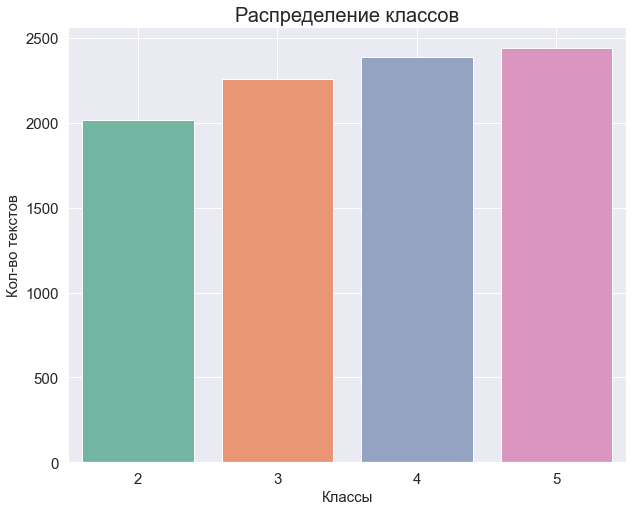

In [12]:
raw_data.show_train_data()

In [13]:
raw_data.load_estimators('estimators')

In [14]:
raw_data.get_est_list()

['knn', 'rf', 'xgb', 'svm']

### knn

C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:   18.4s finished


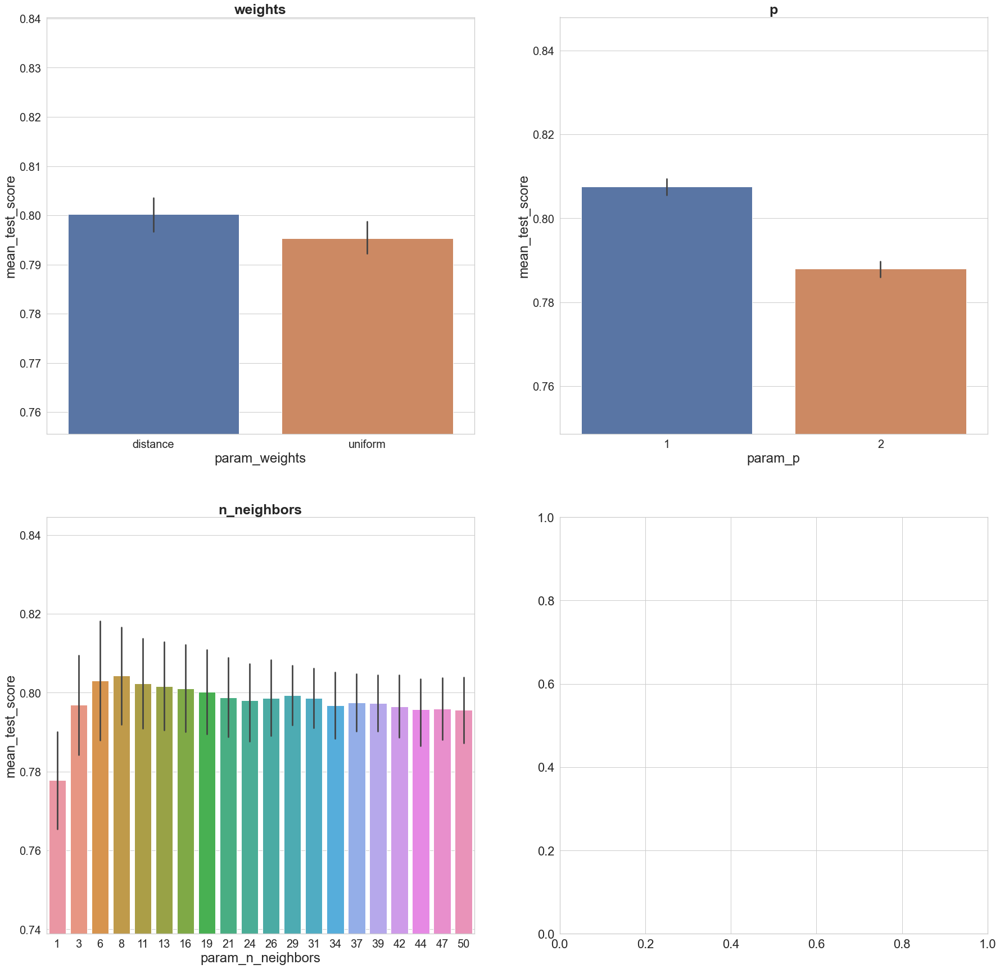

In [298]:
knn_param_grid_1 = {'n_neighbors': [int(x) for x in np.linspace(start = 1, stop = 50, num = 20)],
              'p': [1, 2],
              'weights': ['uniform', 'distance']}

raw_data.add_est('knn', KNeighborsClassifier(metric='minkowski', algorithm='auto'))
raw_data.set_est_param_grid_1('knn', knn_param_grid_1)

raw_data.first_round_search('knn', 100)

In [305]:
knn_param_grid_2 = {'n_neighbors': [7, 8, 9,],
              'p': [1,],
              'weights': ['distance',]}

raw_data.set_est_param_grid_2('knn', knn_param_grid_2)

In [306]:
raw_data.second_round_search('knn')

Fitting 3 folds for each of 3 candidates, totalling 9 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of   9 | elapsed:    2.4s remaining:    1.2s
[Parallel(n_jobs=-1)]: Done   9 out of   9 | elapsed:    2.6s finished


Accuracy:  0.9113372093023255 

Confusion matrix: 
 [[  2   2   4   0]
 [  4  38  34   0]
 [  0   4 582   1]
 [  0   0  12   5]]


In [307]:
raw_data.get_est_info('knn')

est: KNeighborsClassifier()
param_grid_1: {'n_neighbors': [1, 3, 6, 8, 11, 13, 16, 19, 21, 24, 26, 29, 31, 34, 37, 39, 42, 44, 47, 50], 'p': [1, 2], 'weights': ['uniform', 'distance']}
param_grid_2: {'n_neighbors': [7, 8, 9], 'p': [1], 'weights': ['distance']}
train_acc: 0.8190185553578475
best_params: {'n_neighbors': 7, 'p': 1, 'weights': 'distance'}
best_est: KNeighborsClassifier(n_neighbors=7, p=1, weights='distance')
test_acc: 0.9113372093023255
confusion_matrix: [[  2   2   4   0]
 [  4  38  34   0]
 [  0   4 582   1]
 [  0   0  12   5]]
knn_pred_y: [4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 4 4 4 3 4 3 4 4 4 4 4 3 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 3 4 4 4 4 4 4 4 4 4 4 3 4 4 4 4 4 4 3 4 4 4 4 4 4
 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 3 4 4 4 4 4 4 4 4 4 2 4 4 4 4 4 4 5 4 4 4 4 4 4 4 4 4 4 4 3
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 3 4 4 4 4 4 4 4 4 4 4 4 4 4 5 4 4 4 2

### RandomForest

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   21.5s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.2min finished


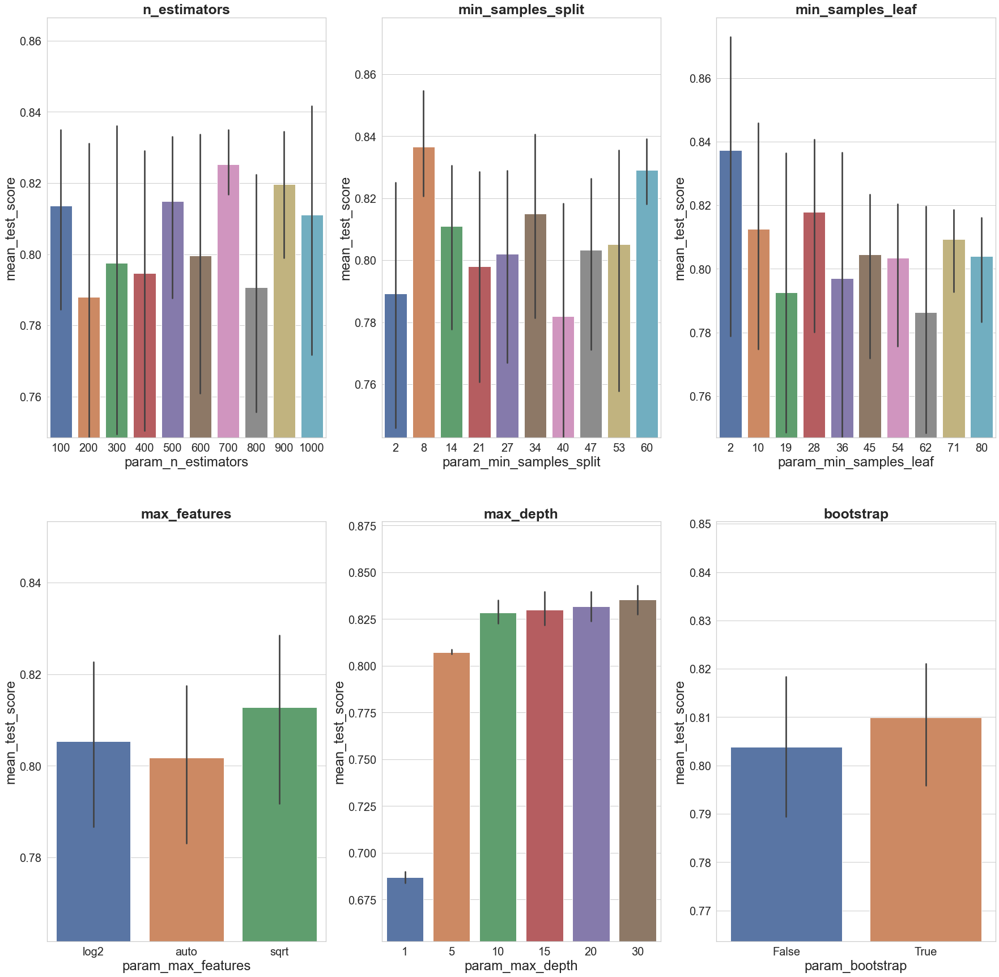

In [299]:
rf_param_grid_1 = {'n_estimators': [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)],
              'max_features': ['auto', 'log2', 'sqrt'],
              'max_depth': [1, 5, 10, 15, 20, 30],
              'min_samples_split': [int(x) for x in np.linspace(start = 2, stop = 60, num = 10)],
              'min_samples_leaf': [int(x) for x in np.linspace(start = 2, stop = 80, num = 10)],
              'bootstrap': [True, False]}

raw_data.add_est('rf', RandomForestClassifier())
raw_data.set_est_param_grid_1('rf', rf_param_grid_1)

raw_data.first_round_search('rf', 100)

In [311]:
rf_param_grid_2 = {'n_estimators': [int(x) for x in np.linspace(start = 680, stop = 780, num = 10)],
              'max_features': ['sqrt',],
              'max_depth': [29, 30, 31, 32, 33],
              'min_samples_split': [6, 7, 8],
              'min_samples_leaf': [1, 2, 3, 4],
              'bootstrap': [True,]}

raw_data.set_est_param_grid_2('rf', rf_param_grid_2)
raw_data.second_round_search('rf')

Fitting 3 folds for each of 600 candidates, totalling 1800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   47.1s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed: 24.8min
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed: 35.9min
[Parallel(n_jobs=-1)]: Done 1800 out of 1800 | elapsed: 36.3min finished


Accuracy:  0.8982558139534884 

Confusion matrix: 
 [[  2   2   4   0]
 [  3  35  38   0]
 [  0   4 581   2]
 [  0   0  17   0]]


In [312]:
raw_data.get_est_info('rf')

est: RandomForestClassifier()
param_grid_1: {'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], 'max_features': ['auto', 'log2', 'sqrt'], 'max_depth': [1, 5, 10, 15, 20, 30], 'min_samples_split': [2, 8, 14, 21, 27, 34, 40, 47, 53, 60], 'min_samples_leaf': [2, 10, 19, 28, 36, 45, 54, 62, 71, 80], 'bootstrap': [True, False]}
param_grid_2: {'n_estimators': [680, 691, 702, 713, 724, 735, 746, 757, 768, 780], 'max_features': ['sqrt'], 'max_depth': [29, 30, 31, 32, 33], 'min_samples_split': [6, 7, 8], 'min_samples_leaf': [1, 2, 3, 4], 'bootstrap': [True]}
train_acc: 0.881768067553694
best_params: {'bootstrap': True, 'max_depth': 33, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 7, 'n_estimators': 702}
best_est: RandomForestClassifier(max_depth=33, max_features='sqrt', min_samples_split=7,
                       n_estimators=702)
test_acc: 0.8982558139534884
confusion_matrix: [[  2   2   4   0]
 [  3  35  38   0]
 [  0   4 581   2]
 [  0   0  17   0]]
r

### XGBoost

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 17.0min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:56:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


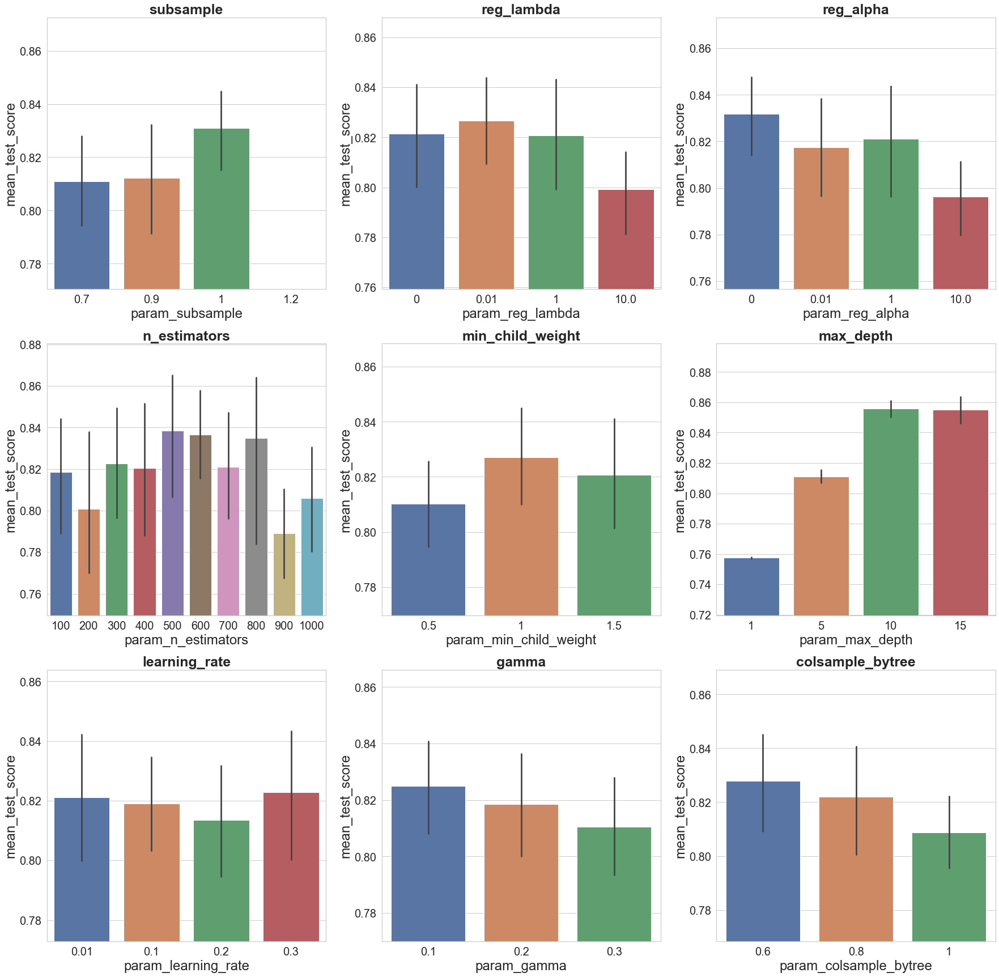

In [300]:
xgb_param_grid_1 = {'n_estimators': [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)],
              'learning_rate': [0.01, 0.1, 0.2, 0.3],
              'max_depth': [1, 5, 10, 15],
              'gamma': [0.1, 0.2, 0.3],
              'min_child_weight': [0.5, 1, 1.5],
              'subsample': [0.7, 0.9, 1, 1.2],
              'colsample_bytree': [0.6, 0.8, 1],
              'reg_alpha': [0, 1e-2, 1, 1e1],
              'reg_lambda': [0, 1e-2, 1, 1e1]}

raw_data.add_est('xgb', xgb.XGBRFClassifier())
raw_data.set_est_param_grid_1('xgb', xgb_param_grid_1)

raw_data.first_round_search('xgb', 100)

In [325]:
xgb_param_grid_2 = {'n_estimators': [int(x) for x in np.linspace(start = 550, stop = 650, num = 10)],
              'learning_rate': [0.3,],
              'max_depth': [9, 10, 11, 12],
              'gamma': [0.1,],
              'min_child_weight': [0.7, 1],
              'subsample': [1,],
              'colsample_bytree': [0.5, 0.6, 0.4],
              'reg_alpha': [0,],
              'reg_lambda': [0.01, 0.05]}

raw_data.set_est_param_grid_2('xgb', xgb_param_grid_2)
raw_data.second_round_search('xgb')

Fitting 3 folds for each of 480 candidates, totalling 1440 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed: 53.3min
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed: 99.4min
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed: 153.9min
[Parallel(n_jobs=-1)]: Done 1440 out of 1440 | elapsed: 180.2min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:39:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy:  0.8968023255813954 

Confusion matrix: 
 [[  2   2   4   0]
 [  2  33  41   0]
 [  0   3 582   2]
 [  0   0  17   0]]


In [326]:
raw_data.get_est_info('xgb')

est: XGBRFClassifier(base_score=None, booster=None, colsample_bylevel=None,
                colsample_bytree=None, gamma=None, gpu_id=None,
                importance_type='gain', interaction_constraints=None,
                max_delta_step=None, max_depth=None, min_child_weight=None,
                missing=nan, monotone_constraints=None, n_estimators=100,
                n_jobs=None, num_parallel_tree=None,
                objective='binary:logistic', random_state=None, reg_alpha=None,
                scale_pos_weight=None, tree_method=None,
                validate_parameters=None, verbosity=None)
param_grid_1: {'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], 'learning_rate': [0.01, 0.1, 0.2, 0.3], 'max_depth': [1, 5, 10, 15], 'gamma': [0.1, 0.2, 0.3], 'min_child_weight': [0.5, 1, 1.5], 'subsample': [0.7, 0.9, 1, 1.2], 'colsample_bytree': [0.6, 0.8, 1], 'reg_alpha': [0, 0.01, 1, 10.0], 'reg_lambda': [0, 0.01, 1, 10.0]}
param_grid_2: {'n_estimators': [550, 561, 5

### SVM

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   34.1s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  4.0min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'


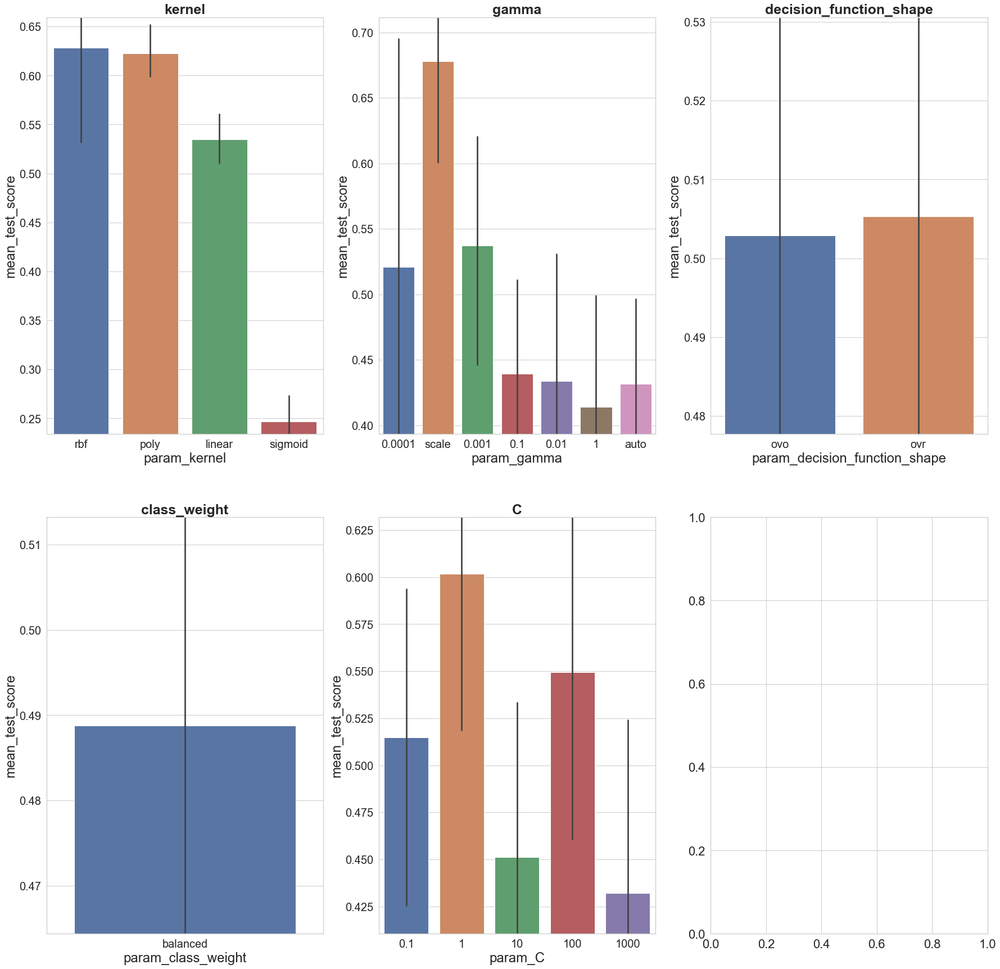

In [301]:
svm_param_grid_1 = {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
              'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001, 'scale', 'auto'],
              'class_weight': [None, 'balanced'],
              'decision_function_shape': ['ovr', 'ovo']}

raw_data.add_est('svm', SVC(max_iter=10000))
raw_data.set_est_param_grid_1('svm', svm_param_grid_1)

raw_data.first_round_search('svm', 100)

In [317]:
svm_param_grid_2 = {'kernel': ['poly', 'rbf'],
              'C': [0.9, 1, 2, 5],
              'gamma': ['scale', ],
              'class_weight': ['balanced',],
              'decision_function_shape': ['ovr', 'ovo']}

raw_data.set_est_param_grid_2('svm', svm_param_grid_2)
raw_data.second_round_search('svm')

Fitting 3 folds for each of 16 candidates, totalling 48 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 out of  48 | elapsed:   22.9s finished


Accuracy:  0.8648255813953488 

Confusion matrix: 
 [[  3   1   4   0]
 [  4   7  65   0]
 [  0   2 585   0]
 [  0   0  17   0]]


In [318]:
raw_data.get_est_info('svm')

est: SVC(max_iter=10000)
param_grid_1: {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'], 'C': [0.1, 1, 10, 100, 1000], 'gamma': [1, 0.1, 0.01, 0.001, 0.0001, 'scale', 'auto'], 'class_weight': [None, 'balanced'], 'decision_function_shape': ['ovr', 'ovo']}
param_grid_2: {'kernel': ['poly', 'rbf'], 'C': [0.9, 1, 2, 5], 'gamma': ['scale'], 'class_weight': ['balanced'], 'decision_function_shape': ['ovr', 'ovo']}
train_acc: 0.8164901892556231
best_params: {'C': 5, 'class_weight': 'balanced', 'decision_function_shape': 'ovr', 'gamma': 'scale', 'kernel': 'rbf'}
best_est: SVC(C=5, class_weight='balanced', max_iter=10000)
test_acc: 0.8648255813953488
confusion_matrix: [[  3   1   4   0]
 [  4   7  65   0]
 [  0   2 585   0]
 [  0   0  17   0]]
svm_pred_y: [4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 4 4 4 4 4 3 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4

### нейросети прямого прохождения

In [29]:
def create_model_pcp(neurons1=None, neurons2=None, neurons3=None, activation="relu", optimizer='Adam', loss=keras.losses.MeanSquaredError(), metrics='categorical_accuracy'):
    model = keras.Sequential()
    if neurons1:
        model.add(Dense(neurons1, activation=activation, kernel_regularizer=keras.regularizers.l2(0.001)))
    if neurons2:
        model.add(Dense(neurons2, activation=activation, kernel_regularizer=keras.regularizers.l2(0.001)))
    if neurons3:
        model.add(Dense(neurons3, activation=activation, kernel_regularizer=keras.regularizers.l2(0.001)))
    model.add(Dense(4, activation="softmax"))
    model.compile(optimizer=optimizer, 
                  loss=loss,
                  metrics=metrics
         )
    return model

In [30]:
pcp_param_grid_1 = {'neurons1': [2**i for i in range(4, 9)],
                  'neurons2': [2**i for i in range(4, 9)],
                  'neurons3': [2**i for i in range(4, 9)],
                  'activation': ["relu", "tanh"],
                  'optimizer': ['Adam', 'SGD'],
                  'loss': ['mse', 'mae'],
                  'epochs': [20, 50, 100],
                  'batch_size': [5, 10, 15, 20]}

raw_data.add_est('pcp', KerasClassifier(build_fn=create_model_pcp))
raw_data.set_est_param_grid_1('pcp', pcp_param_grid_1)

raw_data.first_round_search_nn('pcp', raw_data.train_x, 100, 3)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\joblib\externals\loky\process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


BrokenProcessPool: A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.

In [ ]:
pcp_param_grid_2 = {'neurons1': [int(x) for x in np.linspace(start = 40, stop = 100, num = 10)],
                  'neurons2': [14, 16, 18],
                  'neurons3': [int(x) for x in np.linspace(start = 180, stop = 260, num = 10)],
                  'activation': ["relu", ],
                  'optimizer': ['Adam',],
                  'loss': ['mse',],
                  'epochs': [100],
                  'batch_size': [15,],
                  'metrics': ['categorical_accuracy',]}

raw_data.set_est_param_grid_2('pcp', pcp_param_grid_2)
raw_data.second_round_search_nn('pcp', raw_data.train_x)

### Сверточные нейросети¶

In [ ]:
def create_model_conv(neurons1=None, neurons2=None, neurons3=None, core=3, activation="relu", optimizer='Adam', loss=keras.losses.MeanSquaredError(), metrics='accuracy'):
    model = keras.Sequential()
    if neurons1:
        model.add(layers.Conv1D(neurons1, core, activation=activation))
    if neurons2:
        model.add(layers.Conv1D(neurons2, core, activation=activation))
    if neurons3:
        model.add(layers.Conv1D(neurons3, core, activation=activation))
    model.add(layers.Flatten())
    model.add(Dense(4, activation="softmax"))
    model.compile(optimizer=optimizer, 
                  loss=loss,
                  metrics=metrics
         )
    return model

In [ ]:
cnv_param_grid_1 = {'neurons1': [2**i for i in range(6, 9)],
                    'neurons2': [i for i in range(2, 12)],
                    'neurons3': [2**i for i in range(6, 9)],
                    'core': [3, 4, 5, 10],
                    'activation': ["relu", "tanh"],
                    'optimizer': ['Adam', 'SGD'],
                    'loss': ['mse', 'mae'],
                    'batch_size': [5, 10, 15, 20],
                    'metrics': ['categorical_accuracy', 'accuracy']}

raw_data.add_est('cnv', KerasClassifier(build_fn=create_model_conv))
raw_data.set_est_param_grid_1('cnv', cnv_param_grid_1)

raw_data.first_round_search_nn('cnv', raw_data.train_x_cnv, 100, 3)

In [ ]:
cnv_param_grid_2 = {'neurons1': [int(x) for x in np.linspace(start = 100, stop = 160, num = 10)],
                    'neurons2': [3,],
                    'neurons3': [int(x) for x in np.linspace(start = 40, stop = 80, num = 10)],
                    'core': [4, ],
                    'activation': ["tanh",],
                    'optimizer': ['Adam',],
                    'loss': ['mse'],
                    'batch_size': [3, 5, 7],
                    'metrics': ['categorical_accuracy',]}

raw_data.set_est_param_grid_2('cnv', cnv_param_grid_2)
raw_data.second_round_search_nn('cnv', raw_data.train_x_cnv)

In [159]:
res_df = raw_data.get_result_df()
pd.options.display.max_rows = res_df.shape[0]
res_df

,real_y,knn_y,rf_y,xgb_y,svm_y
265,4,4,4,4,4
1009,3,4,4,4,4
1130,4,4,4,4,4
579,4,4,4,4,4
1665,4,4,4,4,4
636,3,4,3,3,4
2651,4,4,4,4,4
1001,4,4,4,4,4
2618,4,4,4,4,4
340,4,4,4,4,4


In [134]:
def get_res_y(res_df):
    res_df = res_df.copy()
    real_y = res_df['real_y'].copy()
    res_df.drop(['real_y',], inplace=True, axis=1)
    cols = res_df.columns.to_list()
    sum = res_df[cols[0]]
    for col in range(1, len(cols)):
        sum += res_df[cols[col]]
    res_y = (sum/len(cols)).apply(int)
    res_y.name = 'res_y'
    return pd.DataFrame([real_y, res_y]).transpose()

In [137]:
a = get_res_y(res_df)
print('Accuracy: ', accuracy_score(a.real_y, a.res_y), '\n')
print('Confusion matrix: \n', confusion_matrix(a.real_y, a.res_y))


Accuracy:  0.9026162790697675 

Confusion matrix: 
 [[  3   1   4   0]
 [  7  38  31   0]
 [  0   7 580   0]
 [  0   0  17   0]]


### Попробуем обучить модели на сгенерированных данных (комбинации предложений)¶

In [16]:
df_gen_sent = pd.read_csv(r'D:\hse_iot\VKR\my_inspector\data\generated_data_sent.csv', index_col='idx')
df_gen_sent.drop(['squared_vs', 'root_ttr', 'uber_ttr', 'ttr', 'd', 'vvi', 'squared_vv', 'vs', 'log_ttr'],  inplace=True, axis=1)
df_gen_sent.head(2)

,av_depth,max_depth,min_depth,num_acl,num_rel_cl,num_advcl,num_sent,num_tok,av_tok_before_root,av_len_sent,...,num_pres_plur,num_past_part,num_past_simple,num_linkings,num_4grams,num_func_ngrams,sum_punct,million_mistake,text,cls
idx,,,,,,,,,,,,,,,,,,,,,
0,8.5,12,5,3,3,2,2,109,10.0,54.5,...,0,2,2,5,1,0,0,0,"First of all, many contries have only idea of ...",2
1,9.5,11,8,1,4,6,2,105,3.5,52.5,...,0,4,3,5,3,0,2,0,A lot of common people do not understand their...,2


In [63]:
cols = df_gen_sent.columns.drop(['cls', 'text'])
train_x_sent = df_gen_sent[df_gen_sent.cls != 4][cols]
train_y_sent = df_gen_sent[df_gen_sent.cls != 4]['cls']

In [ ]:
test_y_ = test_y[test_y != 4]
test_x_ = test_x[test_y != 4]

In [149]:
res = pd.DataFrame(test_y_)
res.columns = ['real_y',]
for est in raw_data.get_est_list():
    print(est)
    est_params = getattr(raw_data, 'est_{}'.format(est))
    
    best_est = est_params['est']
    best_est.set_params(**est_params['best_params'])
    best_est.fit(train_x_sent, train_y_sent)
    pred_y = best_est.predict(test_x_[cols])
    cm = confusion_matrix(test_y_, pred_y)
    acc = accuracy_score(test_y_, pred_y)
        
    print('Accuracy: ', acc, '\n')
    print('Confusion matrix: \n', cm)
    res['{}_y'.format(est)] = pred_y

knn
Accuracy:  0.5643564356435643 

Confusion matrix: 
 [[ 3  5  0]
 [ 6 41 29]
 [ 0  4 13]]
rf
Accuracy:  0.5841584158415841 

Confusion matrix: 
 [[ 5  3  0]
 [21 44 11]
 [ 0  7 10]]
xgb


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:17:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy:  0.5346534653465347 

Confusion matrix: 
 [[ 6  2  0]
 [23 37 16]
 [ 0  6 11]]
svm
Accuracy:  0.5346534653465347 

Confusion matrix: 
 [[ 3  5  0]
 [ 9 36 31]
 [ 0  2 15]]


### UMAP

In [16]:
import umap

In [19]:
raw_data.train_x

,av_depth,max_depth,min_depth,num_acl,num_rel_cl,num_advcl,num_sent,num_tok,av_tok_before_root,av_len_sent,...,num_gerunds,num_pres_sing,num_pres_plur,num_past_part,num_past_simple,num_linkings,num_4grams,num_func_ngrams,million_mistake,sum_punct
idx,,,,,,,,,,,,,,,,,,,,,
0,3.69,7,2,2,2,0,13,189,4.23,14.54,...,0,7,0,2,4,6,3,1,0,0
1,3.93,7,2,1,3,1,15,244,4.80,16.27,...,0,14,0,3,0,13,2,0,0,0
2,4.27,8,2,10,0,2,11,187,4.55,17.00,...,0,5,0,12,0,12,2,0,0,0
3,3.65,6,2,3,0,0,17,275,5.29,16.18,...,2,5,0,2,6,8,1,1,0,1
4,4.81,9,0,8,3,10,16,355,6.81,22.19,...,3,13,0,10,4,17,11,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9095,7.25,8,5,5,2,10,4,248,12.25,62.00,...,2,13,0,3,0,9,1,1,0,1
9096,9.33,10,8,6,2,11,3,341,13.00,113.67,...,3,13,0,4,0,21,3,1,0,2
9097,6.33,8,5,6,2,10,3,258,5.33,86.00,...,1,9,0,4,3,13,1,0,0,2


  0%|                                                                                           | 0/55 [00:00<?, ?it/s]C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    4.4s finished
  2%|█▌                                                                                 | 1/55 [00:13<12:24, 13.78s/it]

2: 0.784293521284185


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    2.2s finished
  4%|███                                                                                | 2/55 [00:25<11:35, 13.12s/it]

3: 0.7919850080955966


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    2.2s finished
  5%|████▌                                                                              | 3/55 [00:36<10:57, 12.64s/it]

4: 0.793413410515531


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    2.2s finished
  7%|██████                                                                             | 4/55 [00:48<10:30, 12.36s/it]

5: 0.7925343741367481


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    2.3s finished
  9%|███████▌                                                                           | 5/55 [01:16<14:16, 17.12s/it]

6: 0.7916545770638553


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    2.5s finished
 11%|█████████                                                                          | 6/55 [01:29<12:57, 15.86s/it]

7: 0.7908859862250613


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    2.6s finished
 13%|██████████▌                                                                        | 7/55 [01:41<11:47, 14.73s/it]

8: 0.7906662905215414


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    2.7s finished
 15%|████████████                                                                       | 8/55 [01:54<11:01, 14.07s/it]

9: 0.7939628127802116


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    2.8s finished
 16%|█████████████▌                                                                     | 9/55 [02:06<10:23, 13.56s/it]

10: 0.7924242908320495


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    2.8s finished
 18%|██████████████▉                                                                   | 10/55 [02:19<09:59, 13.31s/it]

11: 0.7940725338496201


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    2.9s finished
 20%|████████████████▍                                                                 | 11/55 [02:32<09:39, 13.18s/it]

12: 0.7908863846838806


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    3.0s finished
 22%|█████████████████▉                                                                | 12/55 [02:45<09:22, 13.09s/it]

13: 0.7894570042286624


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    3.2s finished
 24%|███████████████████▍                                                              | 13/55 [02:58<09:08, 13.06s/it]

14: 0.7918749972379558


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    3.2s finished
 25%|████████████████████▊                                                             | 14/55 [03:11<08:59, 13.17s/it]

15: 0.7926431896179308


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    3.4s finished
 27%|██████████████████████▎                                                           | 15/55 [03:24<08:47, 13.20s/it]

16: 0.7915453269003244


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    3.4s finished
 29%|███████████████████████▊                                                          | 16/55 [03:38<08:41, 13.38s/it]

17: 0.7933033996578905


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    3.7s finished
 31%|█████████████████████████▎                                                        | 17/55 [03:52<08:34, 13.54s/it]

18: 0.7913257036438623


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    3.5s finished
 33%|██████████████████████████▊                                                       | 18/55 [04:06<08:22, 13.57s/it]

19: 0.7934122513626024


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    3.6s finished
 35%|████████████████████████████▎                                                     | 19/55 [04:34<10:42, 17.86s/it]

20: 0.7926435156296922


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    3.7s finished
 36%|█████████████████████████████▊                                                    | 20/55 [04:47<09:41, 16.60s/it]

21: 0.7913256311968043


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    3.8s finished
<ipython-input-58-8451fa942895>:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(ncols=cols, nrows=lines)
 38%|███████████████████████████████▎                                                  | 21/55 [05:02<09:01, 15.93s/it]

22: 0.7940728598613812


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    3.9s finished
 40%|████████████████████████████████▊                                                 | 22/55 [05:16<08:26, 15.35s/it]

23: 0.7914352435956257


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    3.9s finished
 42%|██████████████████████████████████▎                                               | 23/55 [05:30<07:59, 14.98s/it]

24: 0.7935228055731782


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    4.1s finished
 44%|███████████████████████████████████▊                                              | 24/55 [05:44<07:35, 14.68s/it]

25: 0.7946222621260618


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    4.3s finished
 45%|█████████████████████████████████████▎                                            | 25/55 [05:59<07:21, 14.70s/it]

26: 0.7917650950509024


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    4.2s finished
 47%|██████████████████████████████████████▊                                           | 26/55 [06:13<07:03, 14.60s/it]

27: 0.7929730048496785


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    4.2s finished
 49%|████████████████████████████████████████▎                                         | 27/55 [06:28<06:51, 14.69s/it]

28: 0.7951708674731038


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    4.5s finished
 51%|█████████████████████████████████████████▋                                        | 28/55 [06:43<06:37, 14.73s/it]

29: 0.7944022404107806


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    4.4s finished
 53%|███████████████████████████████████████████▏                                      | 29/55 [06:58<06:26, 14.85s/it]

30: 0.7922046313520584


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    4.6s finished
 55%|████████████████████████████████████████████▋                                     | 30/55 [07:13<06:11, 14.88s/it]

31: 0.7929735119790848


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    4.6s finished
 56%|██████████████████████████████████████████████▏                                   | 31/55 [07:28<05:59, 14.96s/it]

32: 0.7937428997355175


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    5.4s finished
 58%|███████████████████████████████████████████████▋                                  | 32/55 [07:44<05:49, 15.18s/it]

33: 0.7939619434155151


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    5.2s finished
 60%|█████████████████████████████████████████████████▏                                | 33/55 [08:00<05:40, 15.49s/it]

34: 0.7955006464813225


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    4.9s finished
 62%|██████████████████████████████████████████████████▋                               | 34/55 [08:15<05:24, 15.45s/it]

35: 0.7931934612473079


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    5.3s finished
 64%|████████████████████████████████████████████████████▏                             | 35/55 [08:31<05:13, 15.69s/it]

36: 0.7928642618155538


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    5.5s finished
 65%|█████████████████████████████████████████████████████▋                            | 36/55 [08:47<04:59, 15.76s/it]

37: 0.7927535627108617


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    5.3s finished
 67%|███████████████████████████████████████████████████████▏                          | 37/55 [09:03<04:46, 15.90s/it]

38: 0.7938528019225709


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    5.4s finished
 69%|████████████████████████████████████████████████████████▋                         | 38/55 [09:19<04:30, 15.93s/it]

39: 0.7922041604461811


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    5.3s finished
 71%|██████████████████████████████████████████████████████████▏                       | 39/55 [09:36<04:15, 15.97s/it]

40: 0.7895676671098254


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    5.7s finished
 73%|███████████████████████████████████████████████████████████▋                      | 40/55 [09:52<04:01, 16.07s/it]

41: 0.7938531279343323


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    5.5s finished
 75%|█████████████████████████████████████████████████████████████▏                    | 41/55 [10:08<03:47, 16.24s/it]

42: 0.7962705413671615


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    5.9s finished
 76%|██████████████████████████████████████████████████████████████▌                   | 42/55 [10:25<03:32, 16.32s/it]

43: 0.7935227693496493


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    6.2s finished
 78%|████████████████████████████████████████████████████████████████                  | 43/55 [10:42<03:18, 16.55s/it]

44: 0.7939629938978569


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    5.9s finished
 80%|█████████████████████████████████████████████████████████████████▌                | 44/55 [10:59<03:04, 16.75s/it]

45: 0.7942923382237271


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    5.9s finished
 82%|███████████████████████████████████████████████████████████████████               | 45/55 [11:16<02:47, 16.71s/it]

46: 0.7936329613249349


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    6.0s finished
 84%|████████████████████████████████████████████████████████████████████▌             | 46/55 [11:33<02:31, 16.88s/it]

47: 0.792314678433228


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    6.2s finished
 85%|██████████████████████████████████████████████████████████████████████            | 47/55 [11:50<02:14, 16.78s/it]

48: 0.7916550841932618


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    6.2s finished
 87%|███████████████████████████████████████████████████████████████████████▌          | 48/55 [12:07<01:57, 16.79s/it]

49: 0.7925334685485225


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    6.3s finished
 89%|█████████████████████████████████████████████████████████████████████████         | 49/55 [12:24<01:42, 17.05s/it]

50: 0.7930835228367253


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    6.4s finished
 91%|██████████████████████████████████████████████████████████████████████████▌       | 50/55 [12:41<01:25, 17.07s/it]

51: 0.794072497626091


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    6.6s finished
 93%|████████████████████████████████████████████████████████████████████████████      | 51/55 [12:59<01:09, 17.31s/it]

52: 0.7957203421848424


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    6.6s finished
 95%|█████████████████████████████████████████████████████████████████████████████▌    | 52/55 [13:17<00:51, 17.33s/it]

53: 0.791544855994447


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    6.8s finished
 96%|███████████████████████████████████████████████████████████████████████████████   | 53/55 [13:34<00:34, 17.46s/it]

54: 0.7945112370096087


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    7.3s finished
 98%|████████████████████████████████████████████████████████████████████████████████▌ | 54/55 [13:53<00:17, 17.94s/it]

55: 0.7922045589050004


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    7.3s finished
100%|██████████████████████████████████████████████████████████████████████████████████| 55/55 [14:12<00:00, 15.49s/it]

56: 0.7887976273298701


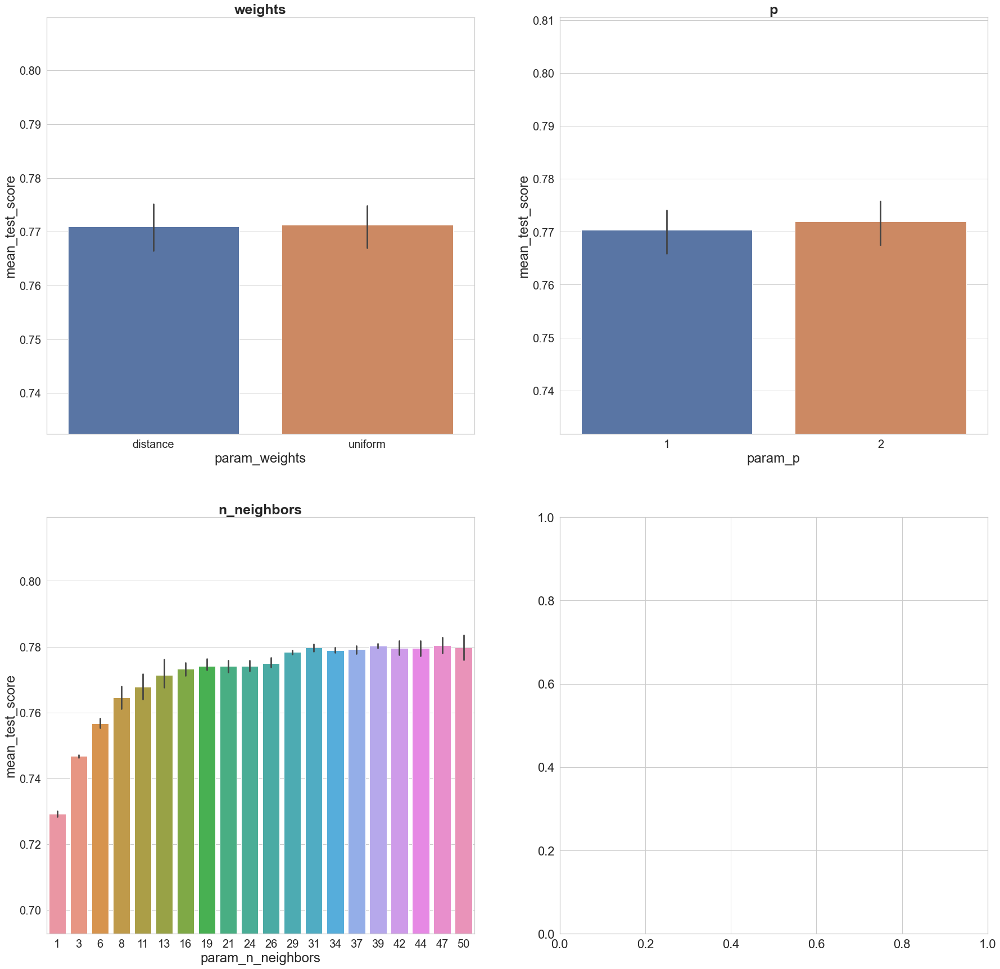

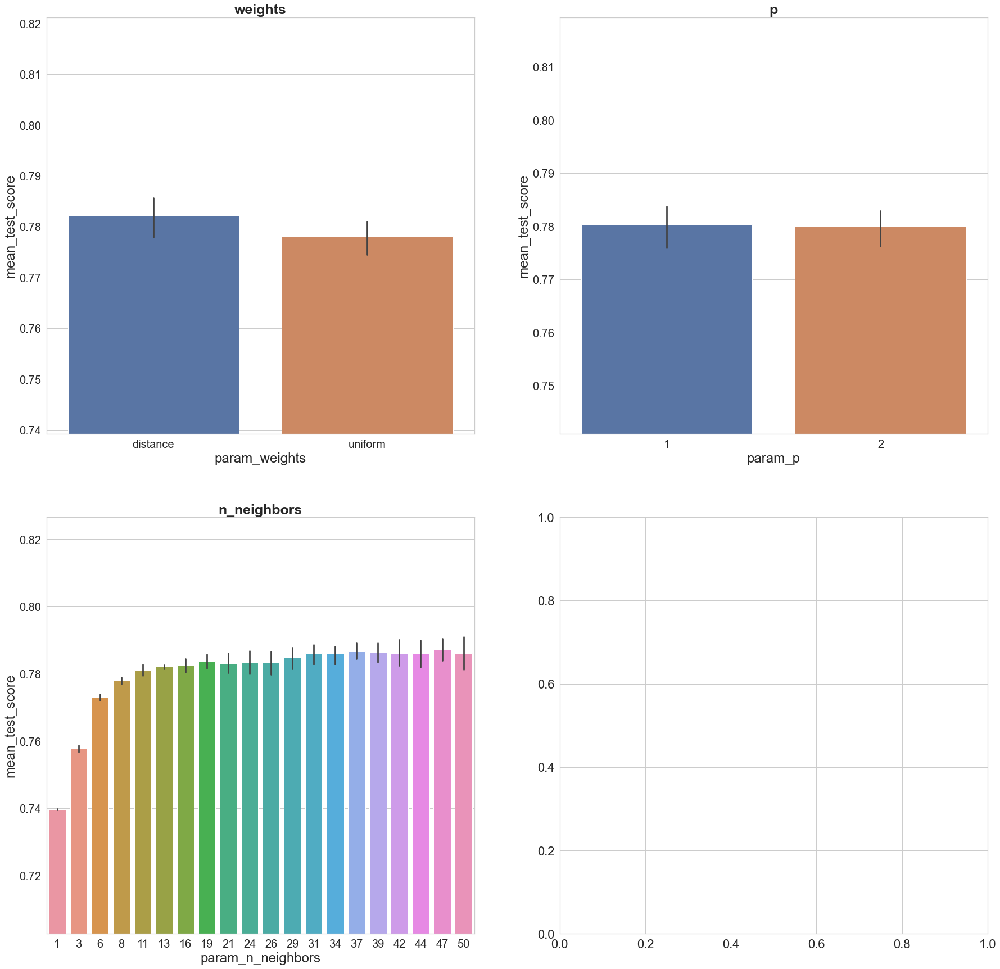

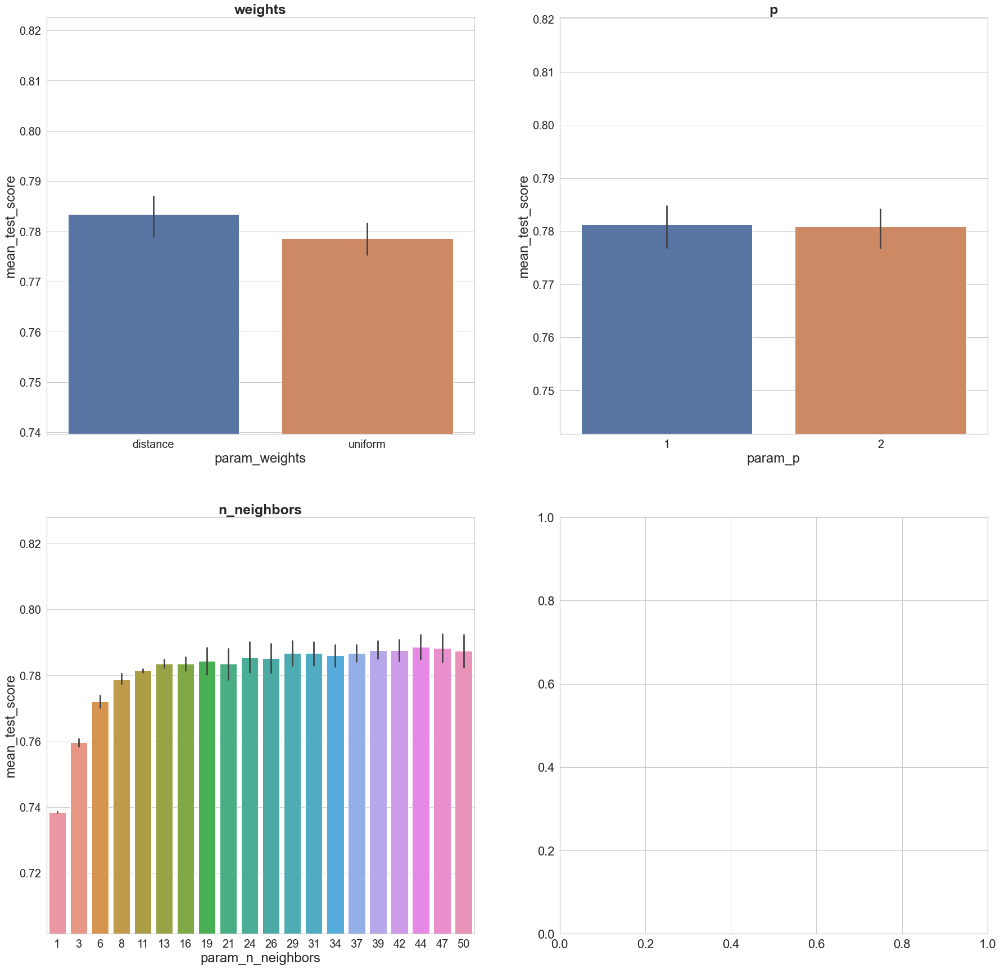

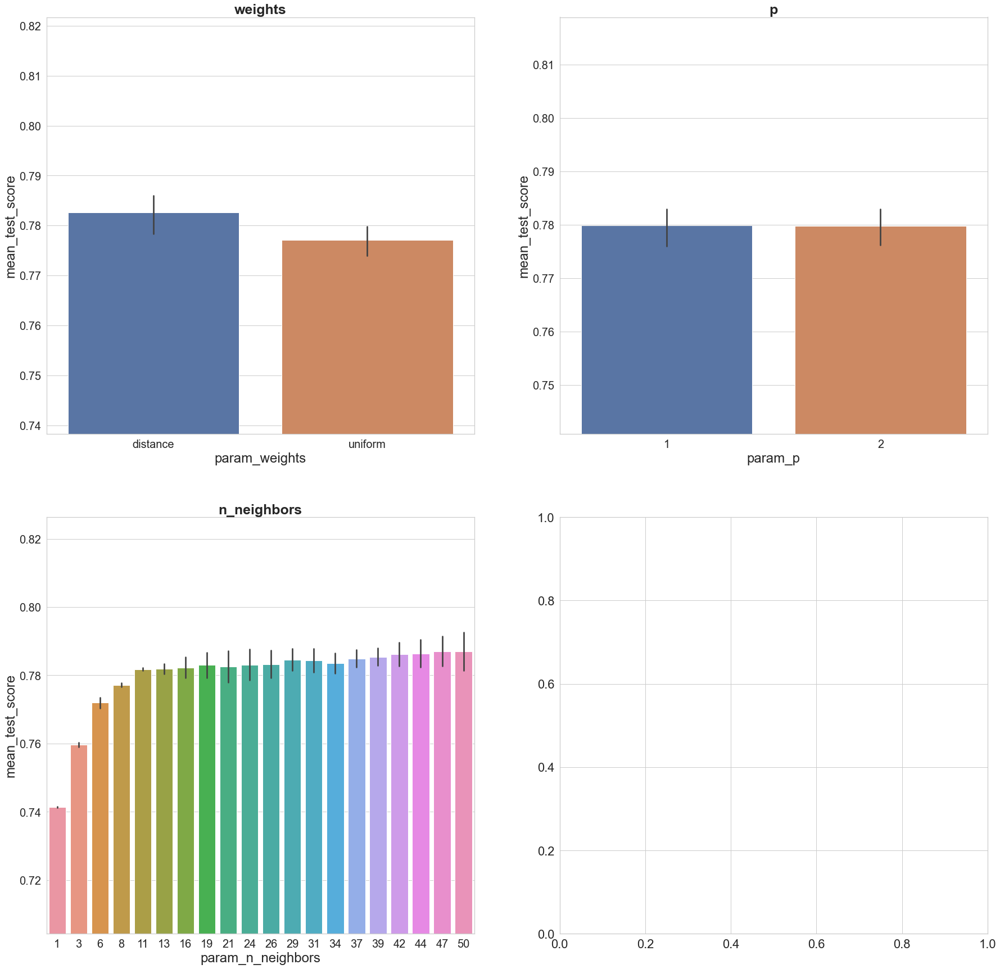

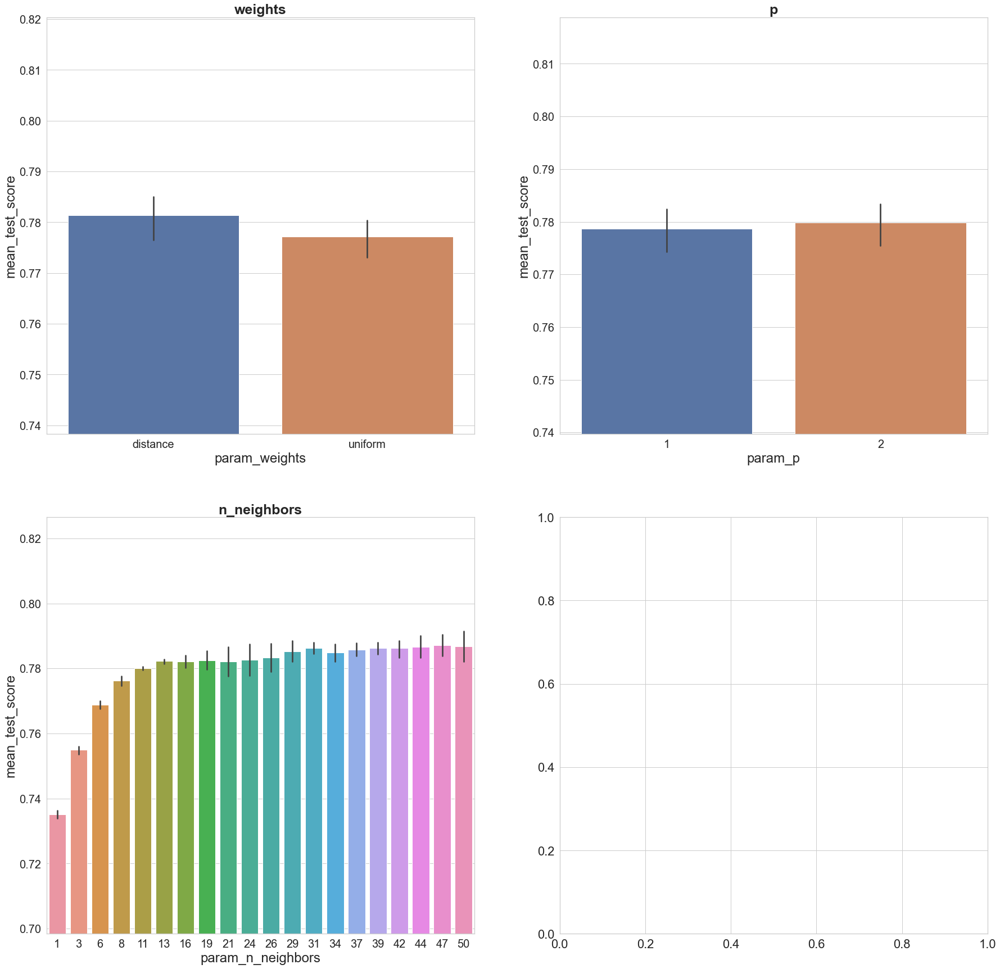

...

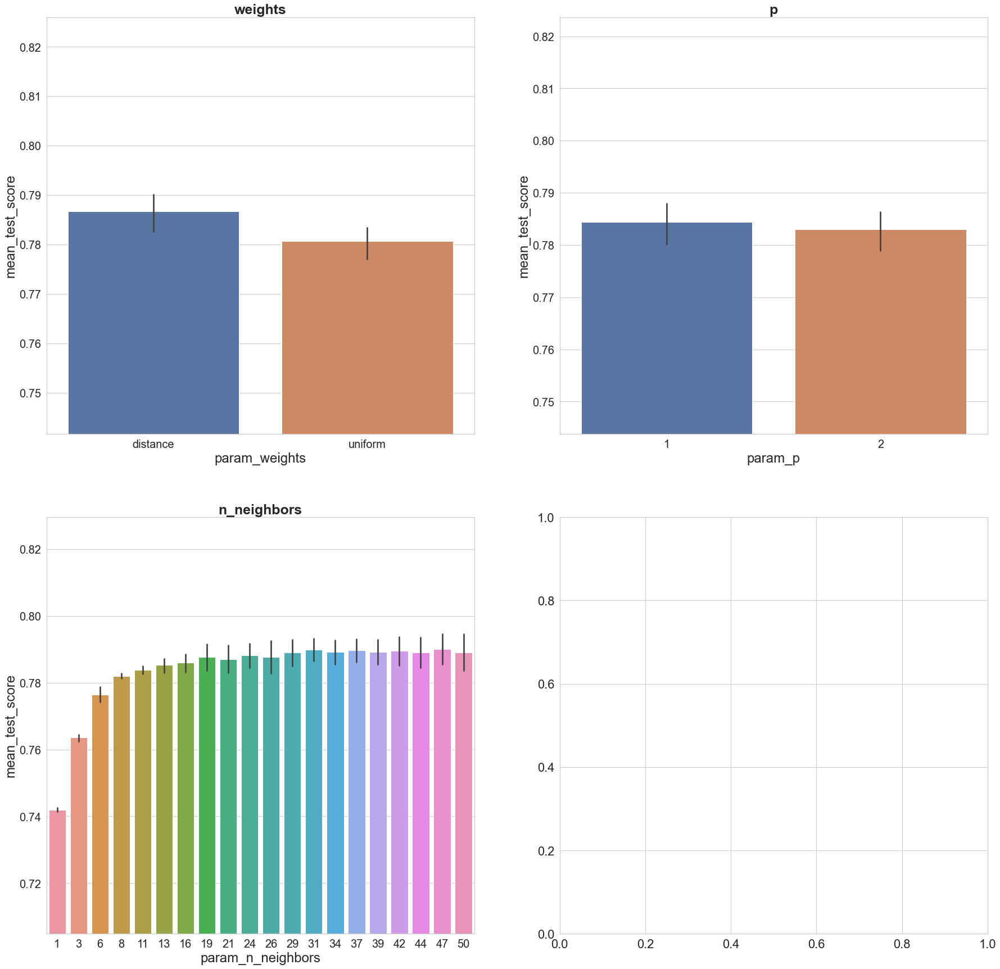

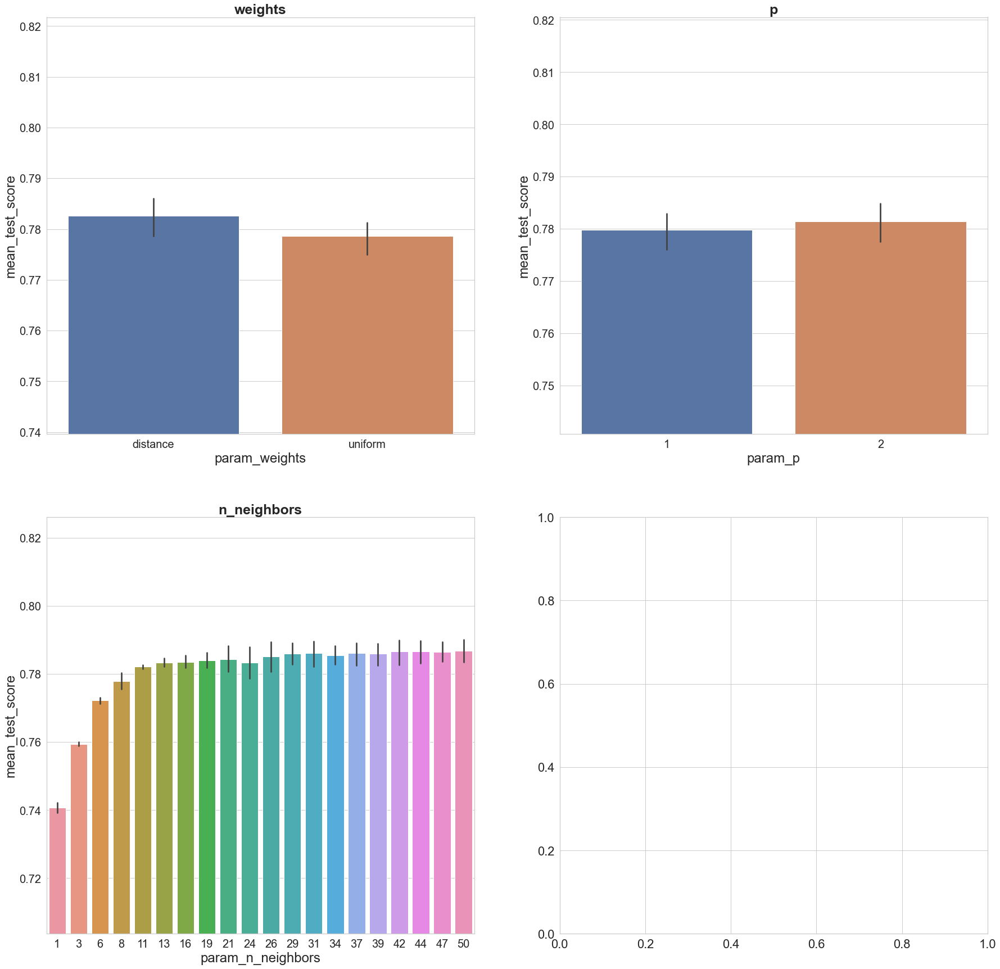

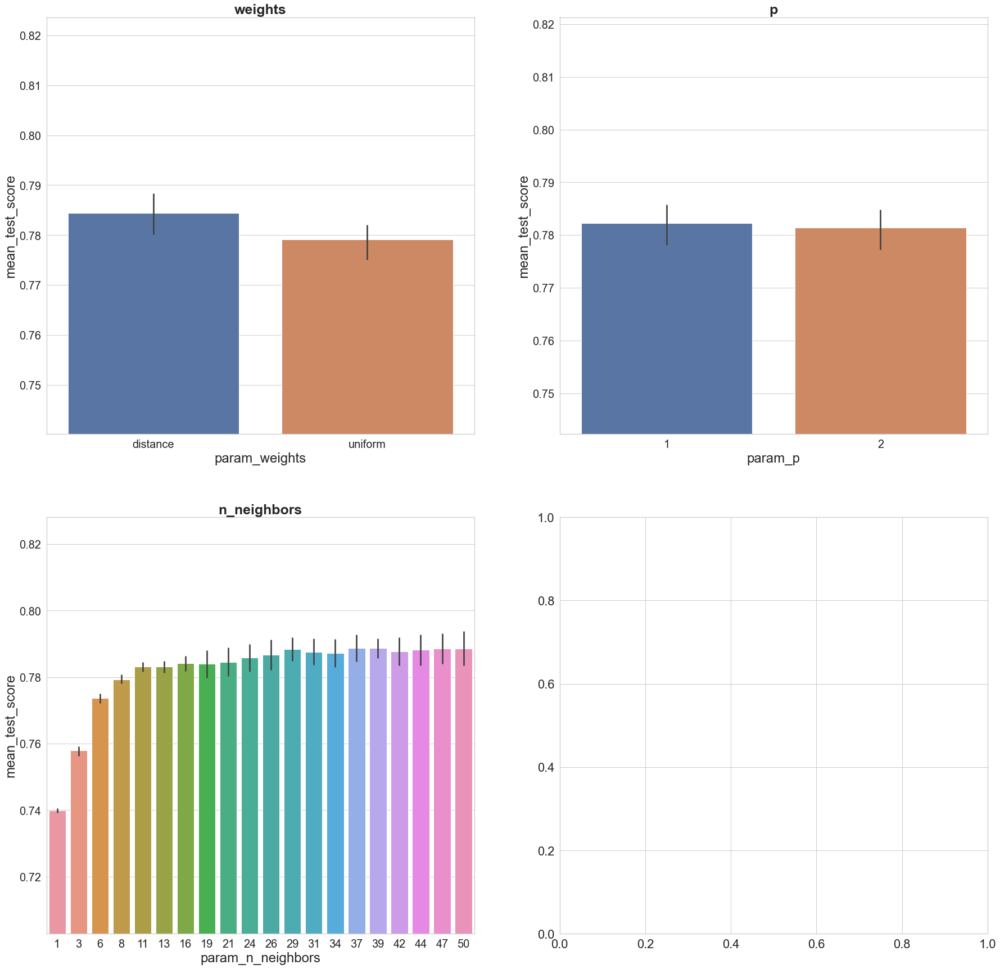

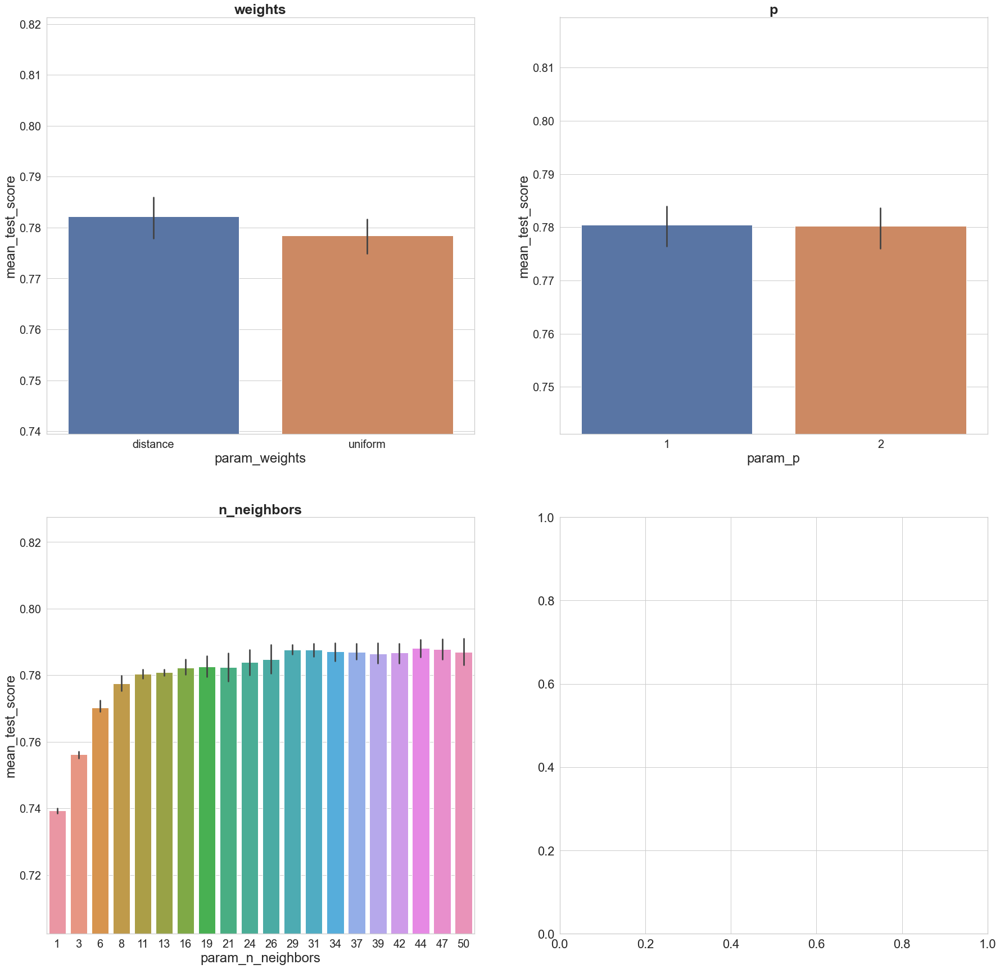

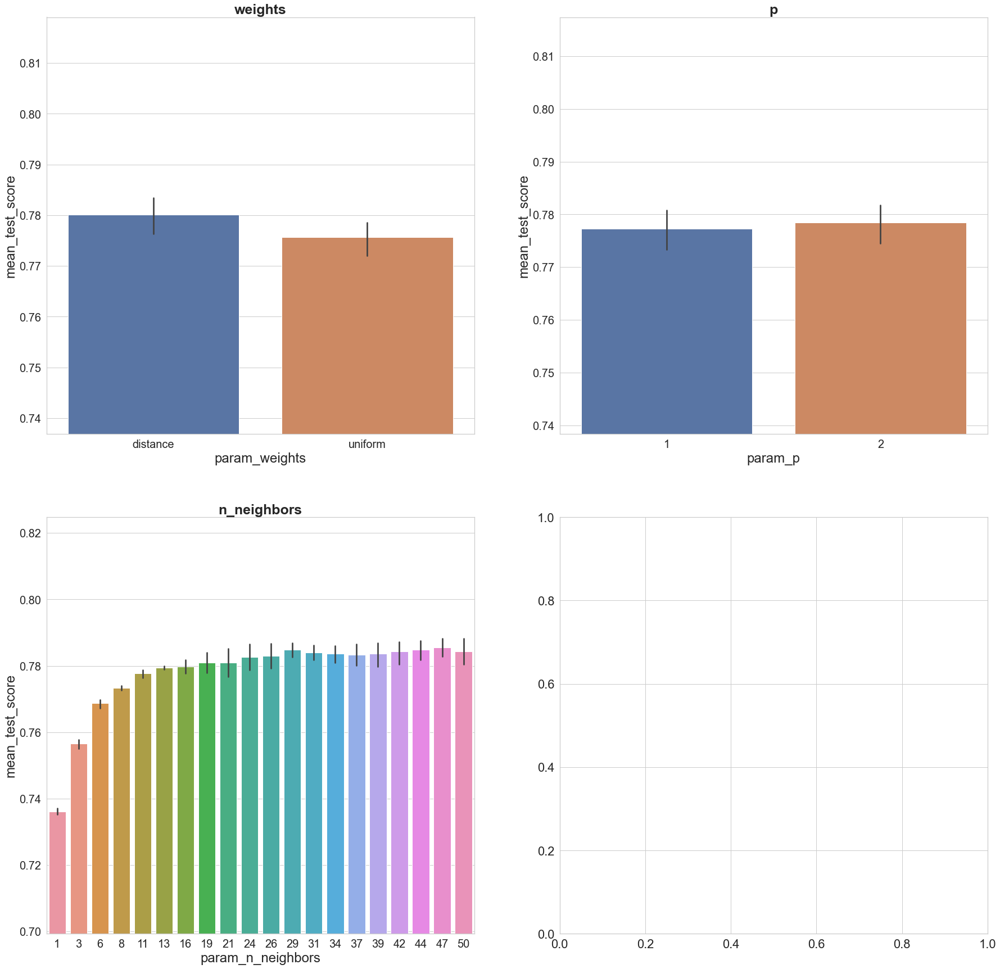

In [63]:
for i in tqdm(range(2, raw_data.train_x.shape[1])):
    print('{}: {}'.format(i, raw_data.umap(i, 'knn')))

In [74]:
for i in tqdm(range(2, raw_data.train_x.shape[1])):
    print('{}: {}'.format(i, raw_data.umap(i, 'rf')))

  0%|                                                                                           | 0/55 [00:00<?, ?it/s]

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.0min finished
  2%|█▍                                                                              | 1/55 [02:14<2:00:43, 134.14s/it]

2: 0.7822070097889741
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   11.8s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.9min finished
  4%|██▉                                                                             | 2/55 [04:22<1:57:01, 132.49s/it]

3: 0.7891285654910175
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.8min finished
  5%|████▎                                                                           | 3/55 [07:21<2:06:55, 146.46s/it]

4: 0.7914362578544383
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   18.4s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.8min finished
  7%|█████▊                                                                          | 4/55 [10:28<2:14:46, 158.55s/it]

5: 0.7914359318426771
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.8min finished
  9%|███████▎                                                                        | 5/55 [13:35<2:19:05, 166.92s/it]

6: 0.7848437929135622
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   17.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.8min finished
 11%|████████▋                                                                       | 6/55 [16:32<2:18:50, 170.00s/it]

7: 0.7948423562884009
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   19.3s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.1min finished
 13%|██████████▏                                                                     | 7/55 [19:55<2:24:03, 180.07s/it]

8: 0.7859424887723362
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   24.6s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.8min finished
 15%|███████████▋                                                                    | 8/55 [23:57<2:35:34, 198.61s/it]

9: 0.7949520411342803
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   24.2s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.7min finished
 16%|█████████████                                                                   | 9/55 [28:00<2:42:31, 211.99s/it]

10: 0.7879206194687124
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   24.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.7min finished
 18%|██████████████▎                                                                | 10/55 [31:57<2:44:26, 219.26s/it]

11: 0.7923148957744021
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   24.9s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.8min finished
 20%|███████████████▊                                                               | 11/55 [36:12<2:48:49, 230.23s/it]

12: 0.7838548181241963
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   24.1s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.8min finished
 22%|█████████████████▏                                                             | 12/55 [40:13<2:47:08, 233.22s/it]

13: 0.7919865657073445
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   24.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.8min finished
 24%|██████████████████▋                                                            | 13/55 [44:16<2:45:22, 236.26s/it]

14: 0.7963795017424604
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   25.1s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.8min finished
 25%|████████████████████                                                           | 14/55 [48:17<2:42:28, 237.77s/it]

15: 0.7926440589826275
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   31.5s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  4.8min finished
 27%|█████████████████████▌                                                         | 15/55 [53:27<2:52:58, 259.47s/it]

16: 0.7917657832979538
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   30.9s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  4.8min finished
 29%|██████████████████████▉                                                        | 16/55 [58:38<2:58:39, 274.85s/it]

17: 0.7966006463871412
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   30.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  4.7min finished
 31%|███████████████████████▊                                                     | 17/55 [1:03:44<3:00:02, 284.26s/it]

18: 0.7918762288379426
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   31.3s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  4.8min finished
 33%|█████████████████████████▏                                                   | 18/55 [1:08:52<2:59:37, 291.29s/it]

19: 0.7913269352438492
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   30.8s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  4.7min finished
 35%|██████████████████████████▌                                                  | 19/55 [1:14:00<2:57:43, 296.22s/it]

20: 0.7955003204695613
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   31.2s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  4.8min finished
 36%|████████████████████████████                                                 | 20/55 [1:19:15<2:56:04, 301.84s/it]

21: 0.7908858775544741
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   31.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  4.7min finished
 38%|█████████████████████████████▍                                               | 21/55 [1:24:10<2:49:58, 299.96s/it]

22: 0.7930839212955446
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   31.4s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  4.8min finished
 40%|██████████████████████████████▊                                              | 22/55 [1:29:20<2:46:40, 303.03s/it]

23: 0.7926443849943886
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   31.4s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  4.8min finished
 42%|████████████████████████████████▏                                            | 23/55 [1:34:19<2:40:53, 301.67s/it]

24: 0.7956114542566016
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   36.3s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  5.5min finished
 44%|█████████████████████████████████▌                                           | 24/55 [1:40:21<2:45:11, 319.74s/it]

25: 0.7942929540237205
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   35.8s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  5.5min finished
 45%|███████████████████████████████████                                          | 25/55 [1:46:12<2:44:32, 329.07s/it]

26: 0.7933037256696517
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   36.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  5.5min finished
 47%|████████████████████████████████████▍                                        | 26/55 [1:52:11<2:43:25, 338.13s/it]

27: 0.7952823272719054
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   35.9s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  5.5min finished
 49%|█████████████████████████████████████▊                                       | 27/55 [1:58:11<2:40:47, 344.55s/it]

28: 0.8002268752069722
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   35.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  5.5min finished
 51%|███████████████████████████████████████▏                                     | 28/55 [2:03:53<2:34:42, 343.81s/it]

29: 0.795062160662508
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   36.4s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  5.5min finished
 53%|████████████████████████████████████████▌                                    | 29/55 [2:09:38<2:29:15, 344.44s/it]

30: 0.7927543234049711
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   37.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  5.5min finished
 55%|██████████████████████████████████████████                                   | 30/55 [2:15:24<2:23:41, 344.85s/it]

31: 0.7914360767367933
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   37.9s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  5.8min finished
 56%|███████████████████████████████████████████▍                                 | 31/55 [2:21:33<2:20:49, 352.08s/it]

32: 0.7969295198071343
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   38.2s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  5.8min finished
 58%|████████████████████████████████████████████▊                                | 32/55 [2:27:48<2:17:31, 358.74s/it]

33: 0.7926448559002659
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   38.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  5.8min finished
 60%|██████████████████████████████████████████████▏                              | 33/55 [2:33:48<2:11:41, 359.15s/it]

34: 0.7937422477119952
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   38.6s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  5.8min finished
 62%|███████████████████████████████████████████████▌                             | 34/55 [2:39:52<2:06:15, 360.75s/it]

35: 0.7907772069674074
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   43.9s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  6.6min finished
 64%|█████████████████████████████████████████████████                            | 35/55 [2:46:44<2:05:20, 376.04s/it]

36: 0.7905569679109522
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   43.2s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  6.5min finished
 65%|██████████████████████████████████████████████████▍                          | 36/55 [2:53:30<2:01:54, 384.95s/it]

37: 0.7945127583978276
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   43.9s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  6.6min finished
 67%|███████████████████████████████████████████████████▊                         | 37/55 [3:00:32<1:58:53, 396.30s/it]

38: 0.7971492517341834
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   42.8s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  6.5min finished
 69%|█████████████████████████████████████████████████████▏                       | 38/55 [3:07:18<1:53:02, 398.97s/it]

39: 0.7945123237154793
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   43.4s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  6.5min finished
 71%|██████████████████████████████████████████████████████▌                      | 39/55 [3:14:20<1:48:17, 406.08s/it]

40: 0.7980278534306181
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   42.8s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  6.6min finished
 73%|████████████████████████████████████████████████████████                     | 40/55 [3:21:08<1:41:39, 406.62s/it]

41: 0.7962709398259807
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   44.1s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  6.6min finished
 75%|█████████████████████████████████████████████████████████▍                   | 41/55 [3:28:11<1:36:02, 411.64s/it]

42: 0.7929745986849555
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   43.4s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  6.6min finished
 76%|██████████████████████████████████████████████████████████▊                  | 42/55 [3:35:00<1:28:58, 410.62s/it]

43: 0.7916556275461971
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   43.5s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  6.6min finished
 78%|████████████████████████████████████████████████████████████▏                | 43/55 [3:41:55<1:22:23, 411.96s/it]

44: 0.7887997645180826
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   43.3s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  6.6min finished
 80%|█████████████████████████████████████████████████████████████▌               | 44/55 [3:49:01<1:16:17, 416.09s/it]

45: 0.7926444936649757
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   43.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  6.6min finished
 82%|███████████████████████████████████████████████████████████████              | 45/55 [3:55:51<1:09:05, 414.53s/it]

46: 0.7875900435428553
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   44.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  6.6min finished
 84%|████████████████████████████████████████████████████████████████▍            | 46/55 [4:02:56<1:02:36, 417.41s/it]

47: 0.7945125410566534
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   43.4s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  6.6min finished
 85%|███████████████████████████████████████████████████████████████████▌           | 47/55 [4:09:46<55:22, 415.35s/it]

48: 0.790996286870934
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   49.5s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  7.3min finished
 87%|████████████████████████████████████████████████████████████████████▉          | 48/55 [4:17:20<49:48, 426.99s/it]

49: 0.7949520411342803
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   49.4s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  7.4min finished
 89%|██████████████████████████████████████████████████████████████████████▍        | 49/55 [4:25:17<44:12, 442.03s/it]

50: 0.7951711210378071
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   50.2s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  7.4min finished
 91%|███████████████████████████████████████████████████████████████████████▊       | 50/55 [4:33:16<37:45, 453.11s/it]

51: 0.7889086524463235
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   50.5s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  7.4min finished
 93%|█████████████████████████████████████████████████████████████████████████▎     | 51/55 [4:41:17<30:45, 461.48s/it]

52: 0.796160747850695
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   49.6s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  7.4min finished
 95%|██████████████████████████████████████████████████████████████████████████▋    | 52/55 [4:49:08<23:12, 464.27s/it]

53: 0.7936336857955154
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   49.9s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  7.4min finished
 96%|████████████████████████████████████████████████████████████████████████████▏  | 53/55 [4:57:07<15:37, 468.54s/it]

54: 0.7969303891718308
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   49.5s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  7.4min finished
 98%|█████████████████████████████████████████████████████████████████████████████▌ | 54/55 [5:04:44<07:45, 465.30s/it]

55: 0.7957210304318938
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   49.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  7.4min finished
100%|███████████████████████████████████████████████████████████████████████████████| 55/55 [5:12:25<00:00, 340.83s/it]

56: 0.7933039792343548


In [19]:
for i in tqdm(range(2, raw_data.train_x.shape[1])):
    print('{}: {}'.format(i, raw_data.umap(i, 'xgb')))

  0%|                                                                                           | 0/55 [00:00<?, ?it/s]

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  7.7min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:11:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


  2%|█▍                                                                              | 1/55 [07:56<7:08:32, 476.15s/it]

2: (0.8633720930232558, [0.25, 0.13, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   53.6s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  8.1min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:20:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


  4%|██▉                                                                             | 2/55 [16:34<7:11:44, 488.76s/it]

3: (0.8648255813953488, [0.25, 0.17, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   52.8s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  8.0min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:28:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


  5%|████▎                                                                           | 3/55 [25:00<7:08:02, 493.89s/it]

4: (0.8619186046511628, [0.25, 0.11, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   57.2s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  8.9min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:37:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


  7%|█████▊                                                                          | 4/55 [34:04<7:12:32, 508.87s/it]

5: (0.8590116279069767, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   54.5s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  8.7min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:46:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


  9%|███████▎                                                                        | 5/55 [42:55<7:09:44, 515.68s/it]

6: (0.8706395348837209, [0.25, 0.18, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  9.6min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:56:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 11%|████████▋                                                                       | 6/55 [52:45<7:19:21, 538.00s/it]

7: (0.8633720930232558, [0.25, 0.13, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 10.0min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:06:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 13%|█████████▉                                                                    | 7/55 [1:02:58<7:28:17, 560.37s/it]

8: (0.8633720930232558, [0.25, 0.13, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 11.0min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:18:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 15%|███████████▎                                                                  | 8/55 [1:14:21<7:47:43, 597.10s/it]

9: (0.8633720930232558, [0.38, 0.11, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 11.8min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:30:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 16%|████████████▊                                                                 | 9/55 [1:26:18<8:05:29, 633.26s/it]

10: (0.8648255813953488, [0.25, 0.13, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 11.6min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:41:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 18%|██████████████                                                               | 10/55 [1:38:12<8:12:59, 657.32s/it]

11: (0.8619186046511628, [0.25, 0.13, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 12.8min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:54:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 20%|███████████████▍                                                             | 11/55 [1:51:15<8:29:41, 695.04s/it]

12: (0.8604651162790697, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 13.4min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:08:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 22%|████████████████▊                                                            | 12/55 [2:04:56<8:45:14, 732.90s/it]

13: (0.8648255813953488, [0.25, 0.13, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 14.2min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:23:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 24%|██████████████████▏                                                          | 13/55 [2:19:33<9:03:15, 776.09s/it]

14: (0.8648255813953488, [0.25, 0.13, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 15.4min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:38:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 25%|███████████████████▌                                                         | 14/55 [2:35:12<9:23:46, 825.04s/it]

15: (0.8619186046511628, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 15.3min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:54:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 27%|█████████████████████                                                        | 15/55 [2:50:59<9:34:25, 861.65s/it]

16: (0.8619186046511628, [0.25, 0.16, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 16.5min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:11:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 29%|██████████████████████▍                                                      | 16/55 [3:07:44<9:47:59, 904.61s/it]

17: (0.8604651162790697, [0.25, 0.16, 0.98, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 17.2min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:28:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 31%|███████████████████████▍                                                    | 17/55 [3:25:16<10:00:58, 948.90s/it]

18: (0.8604651162790697, [0.25, 0.14, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 18.0min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:47:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 33%|████████████████████████▊                                                   | 18/55 [3:43:45<10:14:43, 996.84s/it]

19: (0.8662790697674418, [0.25, 0.14, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 18.8min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:06:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 35%|█████████████████████████▉                                                 | 19/55 [4:03:05<10:27:30, 1045.84s/it]

20: (0.8604651162790697, [0.25, 0.13, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 18.8min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:25:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 36%|███████████████████████████▎                                               | 20/55 [4:22:14<10:28:01, 1076.62s/it]

21: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 20.0min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:46:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 38%|████████████████████████████▋                                              | 21/55 [4:42:31<10:34:03, 1118.92s/it]

22: (0.8604651162790697, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 20.9min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:07:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 40%|██████████████████████████████                                             | 22/55 [5:04:08<10:44:50, 1172.44s/it]

23: (0.8633720930232558, [0.25, 0.14, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 21.9min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:29:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 42%|███████████████████████████████▎                                           | 23/55 [5:26:16<10:50:08, 1219.02s/it]

24: (0.8590116279069767, [0.25, 0.11, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 23.4min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:53:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 44%|████████████████████████████████▋                                          | 24/55 [5:50:00<11:01:34, 1280.48s/it]

25: (0.8706395348837209, [0.25, 0.21, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 23.2min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:17:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 45%|██████████████████████████████████                                         | 25/55 [6:13:43<11:01:39, 1323.33s/it]

26: (0.8648255813953488, [0.25, 0.17, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 23.6min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:41:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 47%|███████████████████████████████████▍                                       | 26/55 [6:37:42<10:56:21, 1357.98s/it]

27: (0.8633720930232558, [0.25, 0.13, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 24.4min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[05:06:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 49%|████████████████████████████████████▊                                      | 27/55 [7:02:48<10:54:24, 1402.31s/it]

28: (0.8633720930232558, [0.25, 0.16, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 25.5min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[05:32:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 51%|██████████████████████████████████████▏                                    | 28/55 [7:28:36<10:50:40, 1445.96s/it]

29: (0.8648255813953488, [0.25, 0.17, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 17.6min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 26.9min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[05:59:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 53%|███████████████████████████████████████▌                                   | 29/55 [7:55:47<10:50:39, 1501.52s/it]

30: (0.8619186046511628, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 26.7min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[06:26:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 55%|████████████████████████████████████████▉                                  | 30/55 [8:23:03<10:42:23, 1541.76s/it]

31: (0.8604651162790697, [0.38, 0.14, 0.98, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 17.4min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 27.9min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[06:55:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 56%|██████████████████████████████████████████▎                                | 31/55 [8:51:22<10:35:39, 1589.17s/it]

32: (0.8633720930232558, [0.25, 0.14, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 18.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 28.7min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[07:24:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 58%|███████████████████████████████████████████▋                               | 32/55 [9:20:40<10:28:31, 1639.62s/it]

33: (0.8648255813953488, [0.5, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 19.5min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 29.8min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
 60%|█████████████████████████████████████████████                              | 33/55 [9:50:40<10:18:51, 1687.79s/it]

[07:54:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
34: (0.8677325581395349, [0.25, 0.18, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 19.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 30.5min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
 62%|█████████████████████████████████████████████▋                            | 34/55 [10:21:26<10:07:19, 1735.21s/it]

[08:25:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
35: (0.8648255813953488, [0.25, 0.16, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 30.1min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[08:55:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 64%|███████████████████████████████████████████████▋                           | 35/55 [10:52:10<9:49:16, 1767.83s/it]

36: (0.8633720930232558, [0.38, 0.14, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 32.0min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[09:28:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 65%|█████████████████████████████████████████████████                          | 36/55 [11:24:53<9:38:22, 1826.46s/it]

37: (0.8633720930232558, [0.38, 0.16, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 20.0min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 32.2min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:01:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 67%|██████████████████████████████████████████████████▍                        | 37/55 [11:57:44<9:20:58, 1869.91s/it]

38: (0.8648255813953488, [0.25, 0.13, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 21.7min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 33.3min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
 69%|███████████████████████████████████████████████████▊                       | 38/55 [12:31:13<9:01:36, 1911.57s/it]

[10:34:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
39: (0.8619186046511628, [0.25, 0.14, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 34.4min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:10:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 71%|█████████████████████████████████████████████████████▏                     | 39/55 [13:06:31<8:46:18, 1973.64s/it]

40: (0.8619186046511628, [0.25, 0.18, 0.98, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 22.7min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 34.7min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:45:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 73%|██████████████████████████████████████████████████████▌                    | 40/55 [13:41:38<8:23:20, 2013.39s/it]

41: (0.8633720930232558, [0.25, 0.16, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 35.3min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:21:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 75%|███████████████████████████████████████████████████████▉                   | 41/55 [14:17:23<7:59:01, 2052.98s/it]

42: (0.8633720930232558, [0.38, 0.13, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 23.7min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 36.1min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:58:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 76%|█████████████████████████████████████████████████████████▎                 | 42/55 [14:54:20<7:35:30, 2102.31s/it]

43: (0.8633720930232558, [0.25, 0.14, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 24.5min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 37.4min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:36:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 78%|██████████████████████████████████████████████████████████▋                | 43/55 [15:32:27<7:11:32, 2157.73s/it]

44: (0.8604651162790697, [0.25, 0.14, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 24.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 38.0min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:14:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 80%|████████████████████████████████████████████████████████████               | 44/55 [16:10:58<6:43:59, 2203.64s/it]

45: (0.8662790697674418, [0.25, 0.16, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 25.0min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 38.1min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:53:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 82%|█████████████████████████████████████████████████████████████▎             | 45/55 [16:49:33<6:12:48, 2236.85s/it]

46: (0.8575581395348837, [0.25, 0.14, 0.98, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 25.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 38.6min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[15:32:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 84%|██████████████████████████████████████████████████████████████▋            | 46/55 [17:28:34<5:40:13, 2268.12s/it]

47: (0.8633720930232558, [0.25, 0.17, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 26.1min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 39.9min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:12:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 85%|████████████████████████████████████████████████████████████████           | 47/55 [18:08:57<5:08:38, 2314.84s/it]

48: (0.8677325581395349, [0.25, 0.17, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 26.6min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 40.8min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:53:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 87%|█████████████████████████████████████████████████████████████████▍         | 48/55 [18:50:09<4:35:32, 2361.78s/it]

49: (0.8648255813953488, [0.25, 0.16, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 27.6min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 42.1min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:36:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 89%|██████████████████████████████████████████████████████████████████▊        | 49/55 [19:32:40<4:01:51, 2418.53s/it]

50: (0.8619186046511628, [0.25, 0.13, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 27.4min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 41.8min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[18:18:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 91%|████████████████████████████████████████████████████████████████████▏      | 50/55 [20:14:53<3:24:24, 2452.94s/it]

51: (0.8633720930232558, [0.25, 0.13, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 28.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 43.1min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[19:02:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 93%|█████████████████████████████████████████████████████████████████████▌     | 51/55 [20:58:23<2:46:40, 2500.06s/it]

52: (0.8633720930232558, [0.25, 0.14, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 28.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 44.0min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[19:46:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 95%|██████████████████████████████████████████████████████████████████████▉    | 52/55 [21:42:41<2:07:22, 2547.59s/it]

53: (0.8619186046511628, [0.25, 0.14, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 29.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 44.4min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:31:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 96%|████████████████████████████████████████████████████████████████████████▎  | 53/55 [22:28:11<1:26:44, 2602.10s/it]

54: (0.8662790697674418, [0.25, 0.18, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 30.0min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 45.8min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[21:17:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 98%|███████████████████████████████████████████████████████████████████████████▌ | 54/55 [23:14:18<44:11, 2651.64s/it]

55: (0.8590116279069767, [0.25, 0.2, 0.98, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed: 30.0min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 45.7min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:04:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


100%|█████████████████████████████████████████████████████████████████████████████| 55/55 [24:00:52<00:00, 1571.86s/it]

56: (0.8619186046511628, [0.25, 0.13, 0.99, 0.0])


In [20]:
for i in tqdm(range(2, raw_data.train_x.shape[1])):
    print('{}: {}'.format(i, raw_data.umap(i, 'svm')))

  0%|                                                                                           | 0/55 [00:00<?, ?it/s]

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   24.1s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   39.4s finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
  2%|█▌                                                                                 | 1/55 [00:52<47:20, 52.60s/it]

2: (0.8590116279069767, [0.38, 0.07, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   25.6s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   41.9s finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
  4%|███                                                                                | 2/55 [01:45<46:27, 52.59s/it]

3: (0.8561046511627907, [0.25, 0.05, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   24.4s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   40.8s finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
  5%|████▌                                                                              | 3/55 [02:36<45:12, 52.16s/it]

4: (0.8575581395348837, [0.38, 0.05, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   25.5s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   42.3s finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
  7%|██████                                                                             | 4/55 [03:29<44:29, 52.34s/it]

5: (0.8590116279069767, [0.38, 0.07, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   25.4s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   41.8s finished
  9%|███████▌                                                                           | 5/55 [04:20<43:22, 52.05s/it]

6: (0.8619186046511628, [0.25, 0.11, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   26.5s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   44.4s finished
 11%|█████████                                                                          | 6/55 [05:14<43:03, 52.73s/it]

7: (0.8604651162790697, [0.25, 0.09, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   25.6s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   42.3s finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
 13%|██████████▌                                                                        | 7/55 [06:07<42:10, 52.73s/it]

8: (0.8590116279069767, [0.38, 0.07, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   25.9s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   42.9s finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
 15%|████████████                                                                       | 8/55 [07:00<41:28, 52.94s/it]

9: (0.8604651162790697, [0.38, 0.08, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   27.1s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   45.8s finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
 16%|█████████████▌                                                                     | 9/55 [07:57<41:18, 53.88s/it]

10: (0.8604651162790697, [0.38, 0.08, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   27.7s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   45.4s finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
 18%|██████████████▉                                                                   | 10/55 [08:52<40:52, 54.51s/it]

11: (0.8590116279069767, [0.38, 0.07, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   29.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   47.3s finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
 20%|████████████████▍                                                                 | 11/55 [09:50<40:44, 55.56s/it]

12: (0.8590116279069767, [0.38, 0.07, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   28.6s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   47.1s finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
 22%|█████████████████▉                                                                | 12/55 [10:48<40:17, 56.22s/it]

13: (0.8604651162790697, [0.38, 0.08, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   30.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   50.4s finished
 24%|███████████████████▍                                                              | 13/55 [11:49<40:23, 57.71s/it]

14: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   30.8s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   51.1s finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
 25%|████████████████████▊                                                             | 14/55 [12:52<40:20, 59.05s/it]

15: (0.8604651162790697, [0.38, 0.08, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   30.4s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   50.3s finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
 27%|██████████████████████▎                                                           | 15/55 [13:53<39:46, 59.67s/it]

16: (0.8604651162790697, [0.38, 0.08, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   32.2s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   52.5s finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
 29%|███████████████████████▊                                                          | 16/55 [14:56<39:29, 60.75s/it]

17: (0.8590116279069767, [0.38, 0.07, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   54.5s finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
 31%|█████████████████████████▎                                                        | 17/55 [16:02<39:26, 62.27s/it]

18: (0.8590116279069767, [0.38, 0.07, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   34.7s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   56.6s finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
 33%|██████████████████████████▊                                                       | 18/55 [17:09<39:22, 63.86s/it]

19: (0.8590116279069767, [0.38, 0.07, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   35.1s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   58.0s finished
 35%|████████████████████████████▎                                                     | 19/55 [18:18<39:11, 65.31s/it]

20: (0.8648255813953488, [0.25, 0.13, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   37.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.0min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
 36%|█████████████████████████████▊                                                    | 20/55 [19:31<39:20, 67.45s/it]

21: (0.8590116279069767, [0.38, 0.07, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   38.2s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.0min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
 38%|███████████████████████████████▎                                                  | 21/55 [20:45<39:22, 69.47s/it]

22: (0.8590116279069767, [0.25, 0.08, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   39.7s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.1min finished
 40%|████████████████████████████████▊                                                 | 22/55 [22:01<39:19, 71.51s/it]

23: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   41.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.1min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
 42%|██████████████████████████████████▎                                               | 23/55 [23:19<39:12, 73.51s/it]

24: (0.8590116279069767, [0.38, 0.07, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   42.2s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.2min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
 44%|███████████████████████████████████▊                                              | 24/55 [24:40<39:08, 75.76s/it]

25: (0.8546511627906976, [0.25, 0.04, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   45.3s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.2min finished
 45%|█████████████████████████████████████▎                                            | 25/55 [26:05<39:10, 78.35s/it]

26: (0.8604651162790697, [0.25, 0.09, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   47.9s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.3min finished
 47%|██████████████████████████████████████▊                                           | 26/55 [27:33<39:21, 81.43s/it]

27: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    9.8s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   50.1s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.3min finished
 49%|████████████████████████████████████████▎                                         | 27/55 [29:04<39:20, 84.29s/it]

28: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   51.9s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.4min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
 51%|█████████████████████████████████████████▋                                        | 28/55 [30:39<39:20, 87.44s/it]

29: (0.8590116279069767, [0.38, 0.07, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   10.2s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   53.8s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.4min finished
 53%|███████████████████████████████████████████▏                                      | 29/55 [32:16<39:10, 90.41s/it]

30: (0.8604651162790697, [0.25, 0.09, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   11.2s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   56.8s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.5min finished
 55%|████████████████████████████████████████████▋                                     | 30/55 [33:59<39:15, 94.23s/it]

31: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   11.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.6min finished
 56%|██████████████████████████████████████████████▏                                   | 31/55 [35:48<39:22, 98.43s/it]

32: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   12.4s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.7min finished
 58%|███████████████████████████████████████████████▏                                 | 32/55 [37:41<39:27, 102.93s/it]

33: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.8min finished
 60%|████████████████████████████████████████████████▌                                | 33/55 [39:38<39:16, 107.12s/it]

34: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.8min finished
 62%|██████████████████████████████████████████████████                               | 34/55 [41:39<38:59, 111.41s/it]

35: (0.8619186046511628, [0.25, 0.11, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.9min finished
 64%|███████████████████████████████████████████████████▌                             | 35/55 [43:44<38:26, 115.31s/it]

36: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   15.3s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.0min finished
 65%|█████████████████████████████████████████████████████                            | 36/55 [45:56<38:08, 120.45s/it]

37: (0.8648255813953488, [0.25, 0.13, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   14.9s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.1min finished
 67%|██████████████████████████████████████████████████████▍                          | 37/55 [48:11<37:25, 124.77s/it]

38: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.1min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
 69%|███████████████████████████████████████████████████████▉                         | 38/55 [50:31<36:36, 129.19s/it]

39: (0.8590116279069767, [0.38, 0.07, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   15.9s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.2min finished
 71%|█████████████████████████████████████████████████████████▍                       | 39/55 [52:53<35:32, 133.28s/it]

40: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   17.2s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.3min finished
 73%|██████████████████████████████████████████████████████████▉                      | 40/55 [55:22<34:28, 137.87s/it]

41: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   17.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.3min finished
 75%|████████████████████████████████████████████████████████████▍                    | 41/55 [57:53<33:06, 141.89s/it]

42: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   16.9s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.4min finished
 76%|████████████████████████████████████████████████████████████▎                  | 42/55 [1:00:29<31:36, 145.90s/it]

43: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   17.5s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.4min finished
 78%|█████████████████████████████████████████████████████████████▊                 | 43/55 [1:03:07<29:55, 149.60s/it]

44: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   18.1s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.5min finished
 80%|███████████████████████████████████████████████████████████████▏               | 44/55 [1:05:51<28:14, 154.00s/it]

45: (0.8604651162790697, [0.25, 0.09, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   18.4s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.6min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
 82%|████████████████████████████████████████████████████████████████▋              | 45/55 [1:08:37<26:16, 157.66s/it]

46: (0.8575581395348837, [0.25, 0.07, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   18.3s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.6min finished
 84%|██████████████████████████████████████████████████████████████████             | 46/55 [1:11:29<24:15, 161.75s/it]

47: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   18.6s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.7min finished
 85%|███████████████████████████████████████████████████████████████████▌           | 47/55 [1:14:21<21:58, 164.86s/it]

48: (0.8604651162790697, [0.25, 0.09, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   19.1s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.8min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
 87%|████████████████████████████████████████████████████████████████████▉          | 48/55 [1:17:19<19:41, 168.83s/it]

49: (0.8590116279069767, [0.38, 0.07, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   19.4s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.8min finished
 89%|██████████████████████████████████████████████████████████████████████▍        | 49/55 [1:20:17<17:10, 171.76s/it]

50: (0.8648255813953488, [0.25, 0.13, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   21.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.9min finished
 91%|███████████████████████████████████████████████████████████████████████▊       | 50/55 [1:23:25<14:42, 176.49s/it]

51: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   20.5s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.0min finished
 93%|█████████████████████████████████████████████████████████████████████████▎     | 51/55 [1:26:36<12:03, 180.76s/it]

52: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   22.5s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.1min finished
 95%|██████████████████████████████████████████████████████████████████████████▋    | 52/55 [1:29:52<09:16, 185.41s/it]

53: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   21.5s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.1min finished
 96%|████████████████████████████████████████████████████████████████████████████▏  | 53/55 [1:33:11<06:19, 189.67s/it]

54: (0.8633720930232558, [0.25, 0.12, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   23.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.2min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
 98%|█████████████████████████████████████████████████████████████████████████████▌ | 54/55 [1:36:40<03:15, 195.24s/it]

55: (0.8604651162790697, [0.38, 0.08, 0.99, 0.0])
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   22.5s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.3min finished
100%|███████████████████████████████████████████████████████████████████████████████| 55/55 [1:40:12<00:00, 109.31s/it]

56: (0.8619186046511628, [0.25, 0.11, 0.99, 0.0])


### W2V

In [60]:
df = pd.read_csv(r'D:\hse_iot\VKR\my_inspector\data\w2v_2.csv')
df = df[df['class'] != 1]
df = df.drop(['side_mistake',
              'vs', 'squared_vs', 'ttr', 'root_ttr',
              'log_ttr', 'uber_ttr', 'd', 'vvi',
              'squared_vv', 'punct_mistakes_pp',
              'punct_mistakes_because',
              'punct_mistakes_but', 'punct_mistakes_compare'], axis=1)

df.head(2)

,idx,av_depth,max_depth,min_depth,num_acl,num_rel_cl,num_advcl,num_sent,num_tok,av_tok_before_root,...,num_past_part,num_past_simple,num_linkings,num_4grams,num_func_ngrams,million_mistake,text,class,sum_punct,w2v_sum
0,0,3.56,6,2,2,0,1,18,244,4.39,...,2,0,5,1,0,0,This two line graphs illustrates monthly avera...,4,0,-0.525953
1,1,5.43,10,4,1,3,1,7,175,6.29,...,1,4,6,1,0,0,"﻿We have two graphics, which show us the popul...",4,0,-0.668842


In [61]:
df['class'].value_counts()

4    2988
3     337
5      77
2      39
Name: class, dtype: int64

In [62]:
df = df.rename(columns = {'class': 'cls'})
feature_columns = [col for col in df.columns if col not in ['cls',]]
X = df[feature_columns]
y = df['cls']
train_x, test_x, train_y, test_y = train_test_split(X, y, test_size=0.2, random_state = SEED)
train_data = train_x.copy()
train_data['cls'] = train_y

In [63]:
raw_data = Results(train_data,
              test_x,
              test_y)

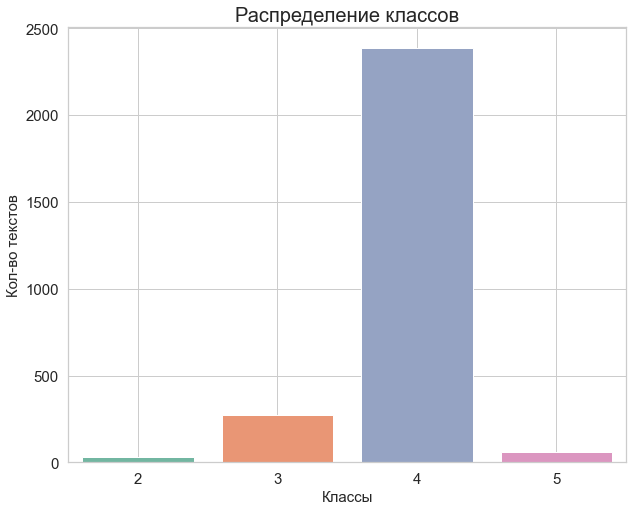

In [64]:
raw_data.show_train_data()

### knn

C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   14.9s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   16.9s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:   17.7s finished


KNeighborsClassifier(n_neighbors=8, weights='distance')

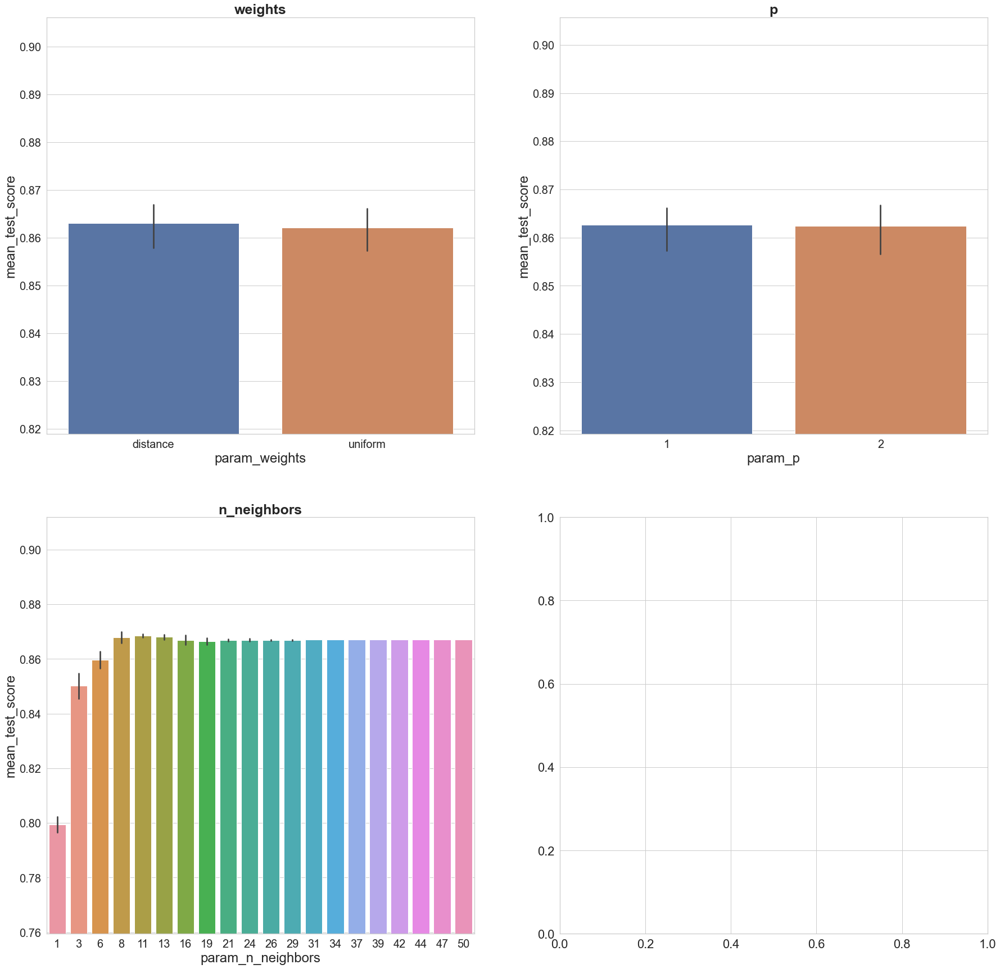

In [65]:
knn_param_grid_1 = {'n_neighbors': [int(x) for x in np.linspace(start = 1, stop = 50, num = 20)],
              'p': [1, 2],
              'weights': ['uniform', 'distance']}

raw_data.add_est('knn', KNeighborsClassifier(metric='minkowski', algorithm='auto'))
raw_data.set_est_param_grid_1('knn', knn_param_grid_1)

raw_data.first_round_search('knn', 100)

In [66]:
knn_param_grid_2 = {'n_neighbors': [7, 8, 9,],
              'p': [1,],
              'weights': ['distance',]}

raw_data.set_est_param_grid_2('knn', knn_param_grid_2)

In [67]:
raw_data.second_round_search('knn')

Fitting 3 folds for each of 3 candidates, totalling 9 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of   9 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   9 out of   9 | elapsed:    0.0s finished


Accuracy:  0.8751814223512336 

Confusion matrix: 
 [[  2   0   5   0]
 [  2   6  56   0]
 [  0   4 595   3]
 [  0   0  16   0]]


In [68]:
raw_data.get_est_info('knn')

est: KNeighborsClassifier()
param_grid_1: {'n_neighbors': [1, 3, 6, 8, 11, 13, 16, 19, 21, 24, 26, 29, 31, 34, 37, 39, 42, 44, 47, 50], 'p': [1, 2], 'weights': ['uniform', 'distance']}
param_grid_2: {'n_neighbors': [7, 8, 9], 'p': [1], 'weights': ['distance']}
train_acc: 0.8695479322630947
best_params: {'n_neighbors': 9, 'p': 1, 'weights': 'distance'}
best_est: KNeighborsClassifier(n_neighbors=9, p=1, weights='distance')
test_acc: 0.8751814223512336
confusion_matrix: [[  2   0   5   0]
 [  2   6  56   0]
 [  0   4 595   3]
 [  0   0  16   0]]
knn_pred_y: [4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 4 4 4 3 4 4 4 4 4 4 4 3 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 5 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 5 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4

### Binary classification

In [120]:
def prp2bin_clf(train_data, test_y, cls):
    train_data_res = train_data.copy()
    test_y_res = test_y.copy()
    
    train_data_res.loc[train_data_res['cls'] != cls, 'cls'] = 0
    train_data_res.loc[train_data_res['cls'] == cls, 'cls'] = 1
    
    test_y_res.loc[test_y_res != cls] = 0
    test_y_res.loc[test_y_res == cls] = 1
    
    return train_data_res, test_y_res

In [213]:
train_data_2, test_y_2 = prp2bin_clf(df_gen, test_y, 2)

In [214]:
bin_clf_2 = Results(train_data_2,
              test_x,
              test_y_2)

In [123]:
train_data_3, test_y_3 = prp2bin_clf(df_gen, test_y, 3)

In [124]:
bin_clf_3 = Results(train_data_3,
              test_x,
              test_y_3)

In [125]:
train_data_4, test_y_4 = prp2bin_clf(df_gen, test_y, 4)

In [126]:
bin_clf_4 = Results(train_data_4,
              test_x,
              test_y_4)

In [127]:
train_data_5, test_y_5 = prp2bin_clf(df_gen, test_y, 5)

In [128]:
bin_clf_5 = Results(train_data_5,
              test_x,
              test_y_5)

# 2

### knn

C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   12.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   33.1s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:   42.8s finished


KNeighborsClassifier(n_neighbors=136, p=1, weights='distance')

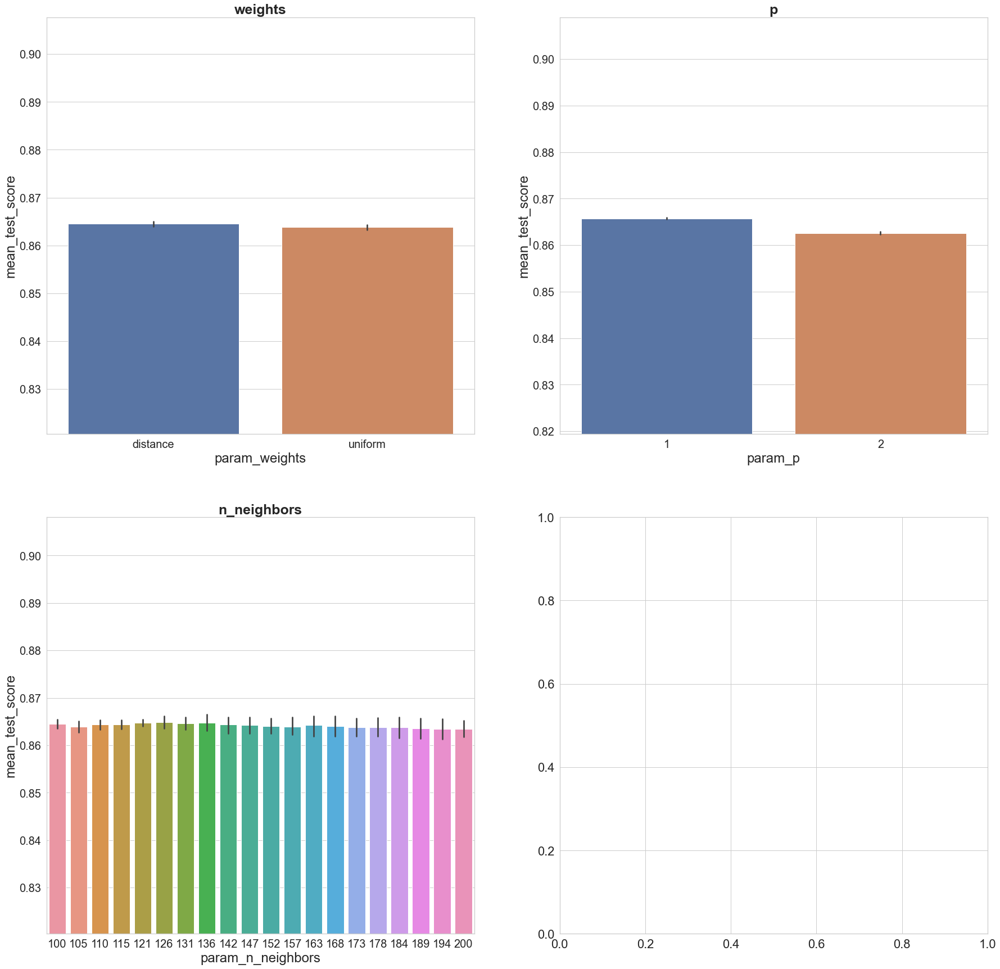

In [215]:
knn_param_grid_1 = {'n_neighbors': [int(x) for x in np.linspace(start = 100, stop = 200, num = 20)],
              'p': [1, 2],
              'weights': ['uniform', 'distance']}

bin_clf_2.add_est('knn', KNeighborsClassifier(metric='minkowski', algorithm='auto'))
bin_clf_2.set_est_param_grid_1('knn', knn_param_grid_1)

bin_clf_2.first_round_search('knn', 100)

In [216]:
knn_param_grid_2 = {'n_neighbors': [int(x) for x in np.linspace(start = 120, stop = 130, num = 10)],
              'p': [1,],
              'weights': ['distance',]}

bin_clf_2.set_est_param_grid_2('knn', knn_param_grid_2)

In [217]:
bin_clf_2.second_round_search('knn')

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    4.9s finished


Accuracy:  0.9854651162790697 

Confusion matrix: 

 [[676   4]
 [  6   2]]


In [218]:
bin_clf_2.get_est_info('knn')

est: KNeighborsClassifier()
param_grid_1: {'n_neighbors': [100, 105, 110, 115, 121, 126, 131, 136, 142, 147, 152, 157, 163, 168, 173, 178, 184, 189, 194, 200], 'p': [1, 2], 'weights': ['uniform', 'distance']}
param_grid_2: {'n_neighbors': [120, 121, 122, 123, 124, 125, 126, 127, 128, 130], 'p': [1], 'weights': ['distance']}
train_acc: 0.8668064460204578
best_params: {'n_neighbors': 126, 'p': 1, 'weights': 'distance'}
best_est: KNeighborsClassifier(n_neighbors=126, p=1, weights='distance')
test_acc: 0.9854651162790697
confusion_matrix: [[676   4]
 [  6   2]]
knn_pred_y: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

### RandomForest

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   22.1s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.9min finished


RandomForestClassifier(bootstrap=False, max_depth=30, max_features='log2',
                       min_samples_leaf=2, min_samples_split=8,
                       n_estimators=1000)

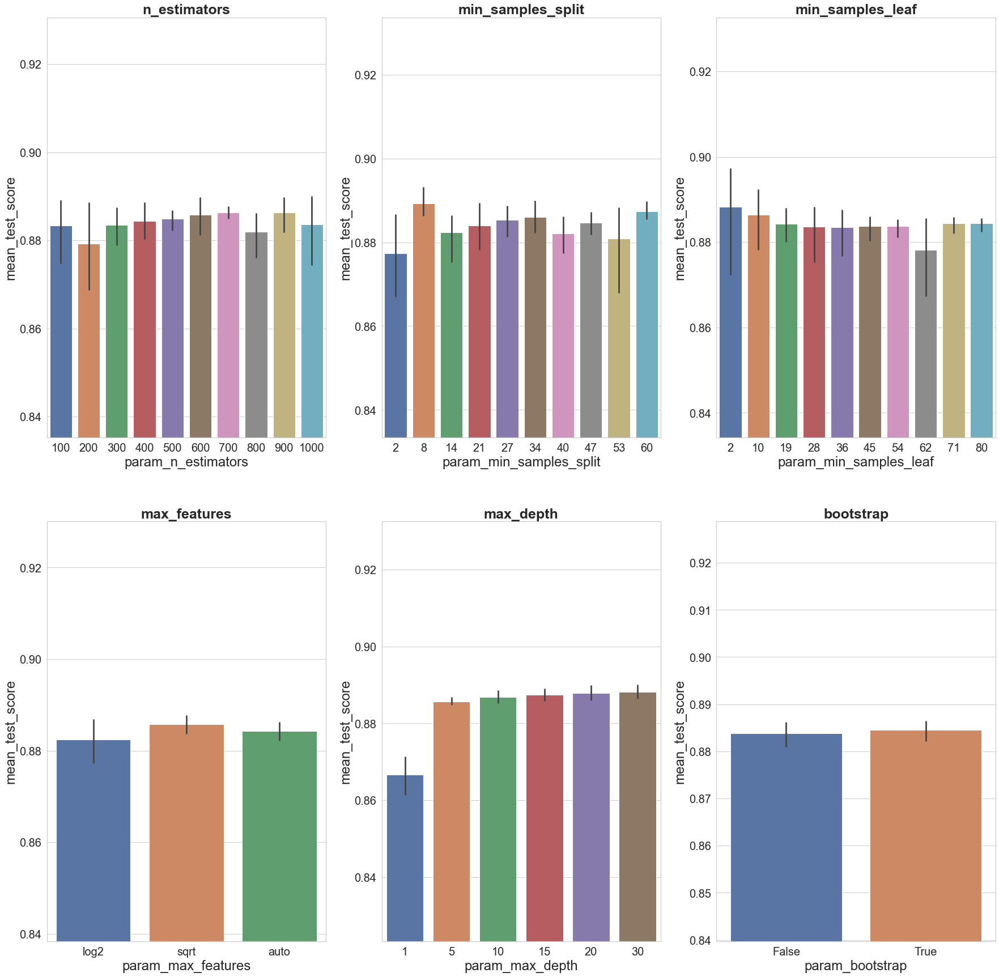

In [219]:
rf_param_grid_1 = {'n_estimators': [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)],
              'max_features': ['auto', 'log2', 'sqrt'],
              'max_depth': [1, 5, 10, 15, 20, 30],
              'min_samples_split': [int(x) for x in np.linspace(start = 2, stop = 60, num = 10)],
              'min_samples_leaf': [int(x) for x in np.linspace(start = 2, stop = 80, num = 10)],
              'bootstrap': [True, False]}

bin_clf_2.add_est('rf', RandomForestClassifier())
bin_clf_2.set_est_param_grid_1('rf', rf_param_grid_1)

bin_clf_2.first_round_search('rf', 100)

In [220]:
rf_param_grid_2 = {'n_estimators': [int(x) for x in np.linspace(start = 680, stop = 780, num = 10)],
              'max_features': ['sqrt',],
              'max_depth': [29, 30, 31, 32, 33],
              'min_samples_split': [6, 10, 8],
              'min_samples_leaf': [2, 6, 4],
              'bootstrap': [True,]}

bin_clf_2.set_est_param_grid_2('rf', rf_param_grid_2)
bin_clf_2.second_round_search('rf')

Fitting 3 folds for each of 450 candidates, totalling 1350 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   31.2s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 1350 out of 1350 | elapsed: 20.0min finished


Accuracy:  0.9883720930232558 

Confusion matrix: 

 [[678   2]
 [  6   2]]


In [221]:
bin_clf_2.get_est_info('rf')

est: RandomForestClassifier()
param_grid_1: {'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], 'max_features': ['auto', 'log2', 'sqrt'], 'max_depth': [1, 5, 10, 15, 20, 30], 'min_samples_split': [2, 8, 14, 21, 27, 34, 40, 47, 53, 60], 'min_samples_leaf': [2, 10, 19, 28, 36, 45, 54, 62, 71, 80], 'bootstrap': [True, False]}
param_grid_2: {'n_estimators': [680, 691, 702, 713, 724, 735, 746, 757, 768, 780], 'max_features': ['sqrt'], 'max_depth': [29, 30, 31, 32, 33], 'min_samples_split': [6, 10, 8], 'min_samples_leaf': [2, 6, 4], 'bootstrap': [True]}
train_acc: 0.8979064828742761
best_params: {'bootstrap': True, 'max_depth': 30, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 6, 'n_estimators': 757}
best_est: RandomForestClassifier(max_depth=30, max_features='sqrt', min_samples_leaf=2,
                       min_samples_split=6, n_estimators=757)
test_acc: 0.9883720930232558
confusion_matrix: [[678   2]
 [  6   2]]
rf_pred_y: [0 0 0 0 0 0 0 0 0 0 0 0 

### XGBoost

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   24.9s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.5min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[18:11:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBRFClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
                colsample_bytree=0.6, gamma=0.3, gpu_id=-1,
                importance_type='gain', interaction_constraints='',
                learning_rate=0.3, max_delta_step=0, max_depth=15,
                min_child_weight=0.5, missing=nan, monotone_constraints='()',
                n_estimators=500, n_jobs=12, num_parallel_tree=500,
                objective='binary:logistic', random_state=0, reg_alpha=0,
                reg_lambda=0, scale_pos_weight=1, subsample=0.7,
                tree_method='exact', validate_parameters=1, verbosity=None)

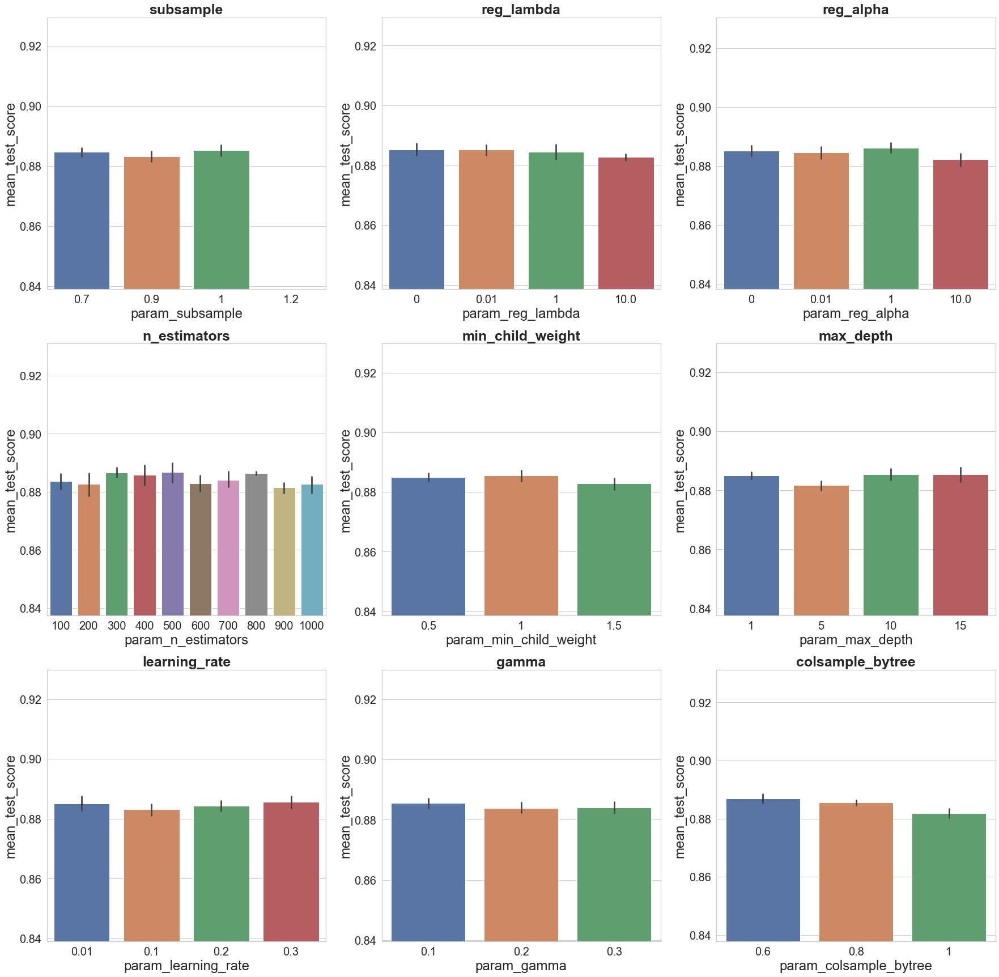

In [222]:
xgb_param_grid_1 = {'n_estimators': [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)],
              'learning_rate': [0.01, 0.1, 0.2, 0.3],
              'max_depth': [1, 5, 10, 15],
              'gamma': [0.1, 0.2, 0.3],
              'min_child_weight': [0.5, 1, 1.5],
              'subsample': [0.7, 0.9, 1, 1.2],
              'colsample_bytree': [0.6, 0.8, 1],
              'reg_alpha': [0, 1e-2, 1, 1e1],
              'reg_lambda': [0, 1e-2, 1, 1e1]}

bin_clf_2.add_est('xgb', xgb.XGBRFClassifier())
bin_clf_2.set_est_param_grid_1('xgb', xgb_param_grid_1)

bin_clf_2.first_round_search('xgb', 100)

In [223]:
xgb_param_grid_2 = {'n_estimators': [int(x) for x in np.linspace(start = 550, stop = 650, num = 10)],
              'learning_rate': [0.3,],
              'max_depth': [10, 11, 12],
              'gamma': [0.1,],
              'min_child_weight': [0.7, 1],
              'subsample': [1,],
              'colsample_bytree': [0.5, 0.6, 0.4],
              'reg_alpha': [1,],
              'reg_lambda': [0.01, 0.05]}

bin_clf_2.set_est_param_grid_2('xgb', xgb_param_grid_2)
bin_clf_2.second_round_search('xgb')

Fitting 3 folds for each of 360 candidates, totalling 1080 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   41.1s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed: 18.6min
[Parallel(n_jobs=-1)]: Done 1080 out of 1080 | elapsed: 24.7min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[18:36:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy:  0.9883720930232558 

Confusion matrix: 

 [[677   3]
 [  5   3]]


In [224]:
bin_clf_2.get_est_info('xgb')

est: XGBRFClassifier(base_score=None, booster=None, colsample_bylevel=None,
                colsample_bytree=None, gamma=None, gpu_id=None,
                importance_type='gain', interaction_constraints=None,
                max_delta_step=None, max_depth=None, min_child_weight=None,
                missing=nan, monotone_constraints=None, n_estimators=100,
                n_jobs=None, num_parallel_tree=None,
                objective='binary:logistic', random_state=None, reg_alpha=None,
                scale_pos_weight=None, tree_method=None,
                validate_parameters=None, verbosity=None)
param_grid_1: {'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], 'learning_rate': [0.01, 0.1, 0.2, 0.3], 'max_depth': [1, 5, 10, 15], 'gamma': [0.1, 0.2, 0.3], 'min_child_weight': [0.5, 1, 1.5], 'subsample': [0.7, 0.9, 1, 1.2], 'colsample_bytree': [0.6, 0.8, 1], 'reg_alpha': [0, 0.01, 1, 10.0], 'reg_lambda': [0, 0.01, 1, 10.0]}
param_grid_2: {'n_estimators': [550, 561, 5

### SVM

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   18.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.6min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'


SVC(C=100, decision_function_shape='ovo', gamma=0.001, max_iter=10000)

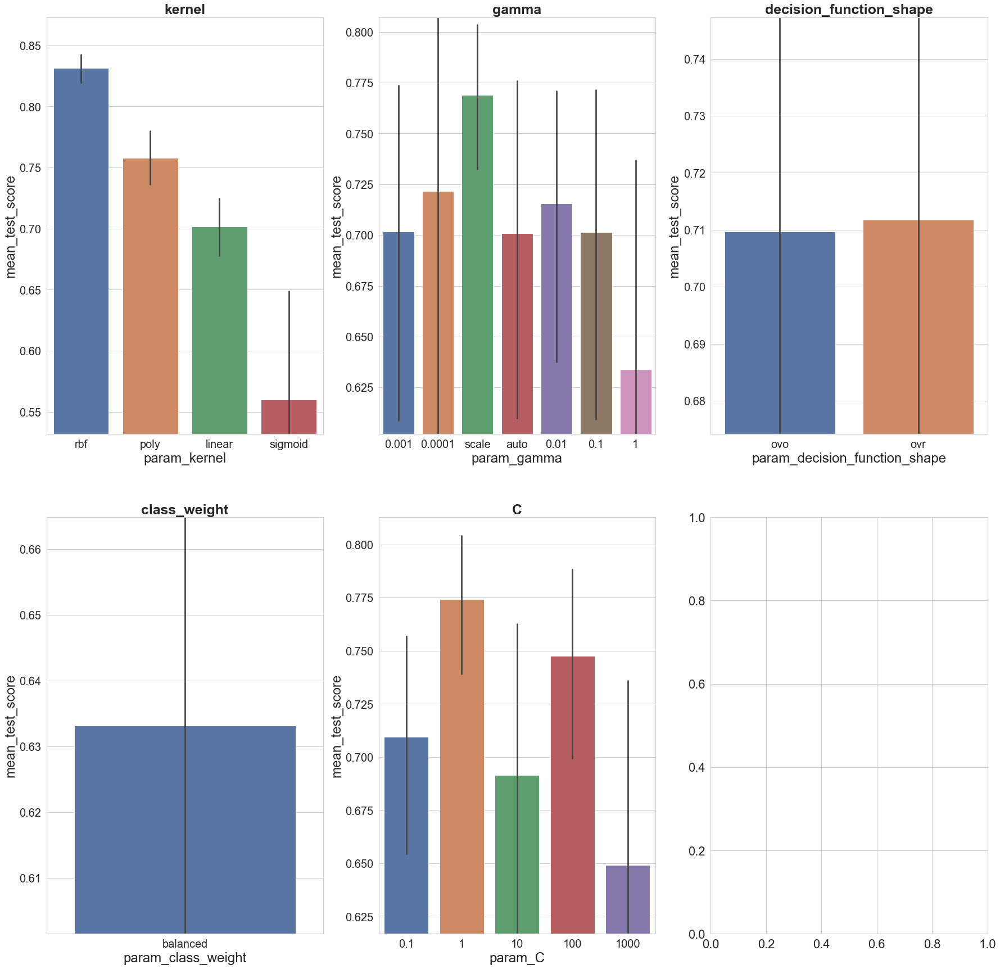

In [225]:
svm_param_grid_1 = {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
              'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001, 'scale', 'auto'],
              'class_weight': [None, 'balanced'],
              'decision_function_shape': ['ovr', 'ovo']}

bin_clf_2.add_est('svm', SVC(max_iter=10000))
bin_clf_2.set_est_param_grid_1('svm', svm_param_grid_1)

bin_clf_2.first_round_search('svm', 100)

In [226]:
svm_param_grid_2 = {'kernel': ['rbf'],
              'C': [0.9, 1, 2, 5],
              'gamma': ['scale', ],
              'class_weight': ['balanced',],
              'decision_function_shape': ['ovr',]}

bin_clf_2.set_est_param_grid_2('svm', svm_param_grid_2)
bin_clf_2.second_round_search('svm')

Fitting 3 folds for each of 4 candidates, totalling 12 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of  12 | elapsed:    2.1s remaining:   10.7s
[Parallel(n_jobs=-1)]: Done  12 out of  12 | elapsed:    4.8s finished


Accuracy:  0.9796511627906976 

Confusion matrix: 

 [[671   9]
 [  5   3]]


In [227]:
bin_clf_2.get_est_info('svm')

est: SVC(max_iter=10000)
param_grid_1: {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'], 'C': [0.1, 1, 10, 100, 1000], 'gamma': [1, 0.1, 0.01, 0.001, 0.0001, 'scale', 'auto'], 'class_weight': [None, 'balanced'], 'decision_function_shape': ['ovr', 'ovo']}
param_grid_2: {'kernel': ['rbf'], 'C': [0.9, 1, 2, 5], 'gamma': ['scale'], 'class_weight': ['balanced'], 'decision_function_shape': ['ovr']}
train_acc: 0.8177868829240328
best_params: {'C': 5, 'class_weight': 'balanced', 'decision_function_shape': 'ovr', 'gamma': 'scale', 'kernel': 'rbf'}
best_est: SVC(C=5, class_weight='balanced', max_iter=10000)
test_acc: 0.9796511627906976
confusion_matrix: [[671   9]
 [  5   3]]
svm_pred_y: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0

# 3

### knn

C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    9.3s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:   13.5s finished


KNeighborsClassifier(n_neighbors=1, p=1)

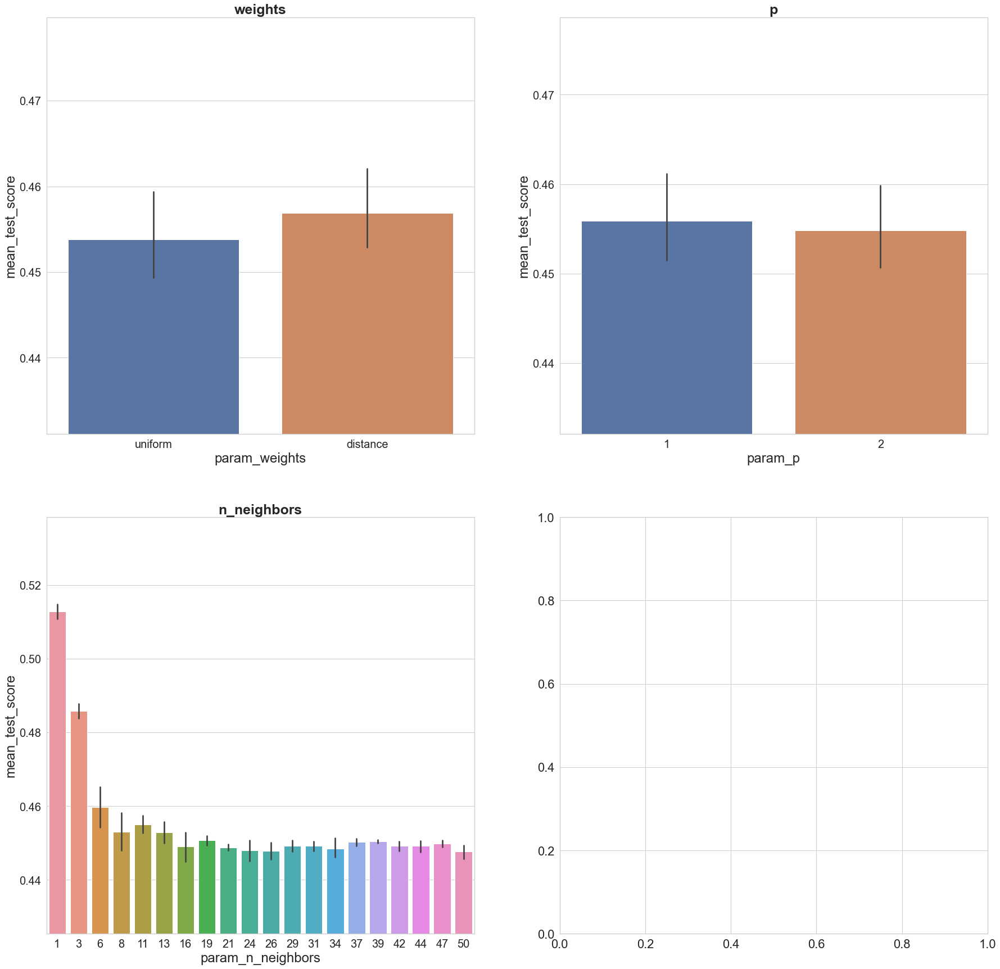

In [172]:
knn_param_grid_1 = {'n_neighbors': [int(x) for x in np.linspace(start = 1, stop = 50, num = 20)],
              'p': [1, 2],
              'weights': ['uniform', 'distance']}

bin_clf_3.add_est('knn', KNeighborsClassifier(metric='minkowski', algorithm='auto'))
bin_clf_3.set_est_param_grid_1('knn', knn_param_grid_1)

bin_clf_3.first_round_search('knn', 100)

In [197]:
knn_param_grid_2 = {'n_neighbors': [1, 2, 100],
              'p': [1,],
              'weights': ['distance',]}

bin_clf_3.set_est_param_grid_2('knn', knn_param_grid_2)

In [198]:
bin_clf_3.second_round_search('knn')

Fitting 3 folds for each of 3 candidates, totalling 9 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of   9 | elapsed:    0.5s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done   9 out of   9 | elapsed:    0.8s finished


Accuracy:  0.9215116279069767 

Confusion matrix: 

 [[588  24]
 [ 30  46]]


In [199]:
bin_clf_3.get_est_info('knn')

est: KNeighborsClassifier()
param_grid_1: {'n_neighbors': [1, 3, 6, 8, 11, 13, 16, 19, 21, 24, 26, 29, 31, 34, 37, 39, 42, 44, 47, 50], 'p': [1, 2], 'weights': ['uniform', 'distance']}
param_grid_2: {'n_neighbors': [1, 2, 100], 'p': [1], 'weights': ['distance']}
train_acc: 0.5147992676761585
best_params: {'n_neighbors': 1, 'p': 1, 'weights': 'distance'}
best_est: KNeighborsClassifier(n_neighbors=1, p=1, weights='distance')
test_acc: 0.9215116279069767
confusion_matrix: [[588  24]
 [ 30  46]]
knn_pred_y: [0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 1 1 0 0 0 

### RandomForest

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   22.6s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.4min finished


RandomForestClassifier(bootstrap=False, max_depth=1, max_features='log2',
                       min_samples_leaf=62, n_estimators=1000)

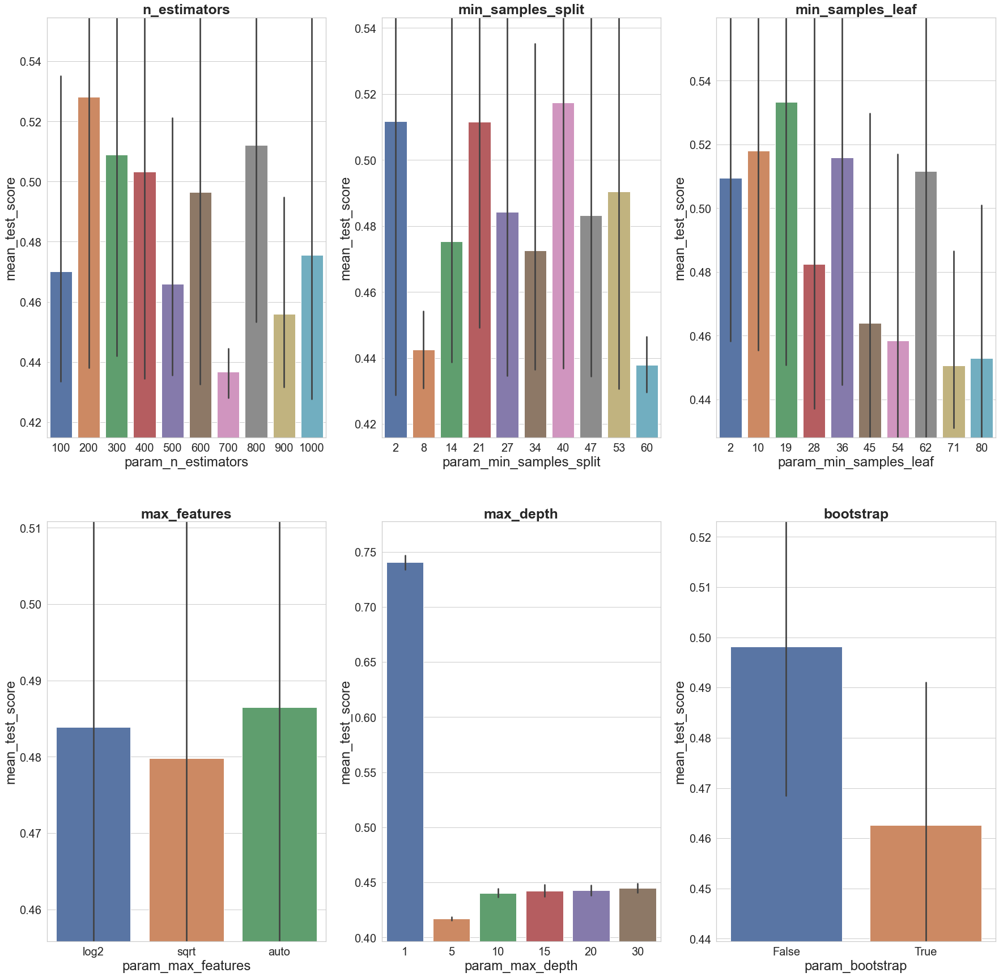

In [149]:
rf_param_grid_1 = {'n_estimators': [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)],
              'max_features': ['auto', 'log2', 'sqrt'],
              'max_depth': [1, 5, 10, 15, 20, 30],
              'min_samples_split': [int(x) for x in np.linspace(start = 2, stop = 60, num = 10)],
              'min_samples_leaf': [int(x) for x in np.linspace(start = 2, stop = 80, num = 10)],
              'bootstrap': [True, False]}

bin_clf_3.add_est('rf', RandomForestClassifier())
bin_clf_3.set_est_param_grid_1('rf', rf_param_grid_1)

bin_clf_3.first_round_search('rf', 100)

In [177]:
rf_param_grid_2 = {'n_estimators': [int(x) for x in np.linspace(start = 180, stop = 280, num = 10)],
              'max_features': ['auto',],
              'max_depth': [1, 2, 3],
              'min_samples_split': [39, 40, 41],
              'min_samples_leaf': [18, 19, 20],
              'bootstrap': [False,]}

bin_clf_3.set_est_param_grid_2('rf', rf_param_grid_2)
bin_clf_3.second_round_search('rf')

Fitting 3 folds for each of 270 candidates, totalling 810 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   17.9s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   46.0s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 810 out of 810 | elapsed:  1.8min finished


Accuracy:  0.8895348837209303 

Confusion matrix: 

 [[612   0]
 [ 76   0]]


In [178]:
bin_clf_3.get_est_info('rf')

est: RandomForestClassifier()
param_grid_1: {'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], 'max_features': ['auto', 'log2', 'sqrt'], 'max_depth': [1, 5, 10, 15, 20, 30], 'min_samples_split': [2, 8, 14, 21, 27, 34, 40, 47, 53, 60], 'min_samples_leaf': [2, 10, 19, 28, 36, 45, 54, 62, 71, 80], 'bootstrap': [True, False]}
param_grid_2: {'n_estimators': [180, 191, 202, 213, 224, 235, 246, 257, 268, 280], 'max_features': ['auto'], 'max_depth': [1, 2, 3], 'min_samples_split': [39, 40, 41], 'min_samples_leaf': [18, 19, 20], 'bootstrap': [False]}
train_acc: 0.7524176488857678
best_params: {'bootstrap': False, 'max_depth': 1, 'max_features': 'auto', 'min_samples_leaf': 19, 'min_samples_split': 39, 'n_estimators': 213}
best_est: RandomForestClassifier(bootstrap=False, max_depth=1, min_samples_leaf=19,
                       min_samples_split=39, n_estimators=213)
test_acc: 0.8895348837209303
confusion_matrix: [[612   0]
 [ 76   0]]
rf_pred_y: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

### XGBoost

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   38.1s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  4.5min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:47:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBRFClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
                colsample_bytree=1, gamma=0.1, gpu_id=-1,
                importance_type='gain', interaction_constraints='',
                learning_rate=0.3, max_delta_step=0, max_depth=15,
                min_child_weight=1, missing=nan, monotone_constraints='()',
                n_estimators=100, n_jobs=12, num_parallel_tree=100,
                objective='binary:logistic', random_state=0, reg_alpha=0,
                reg_lambda=10.0, scale_pos_weight=1, subsample=1,
                tree_method='exact', validate_parameters=1, verbosity=None)

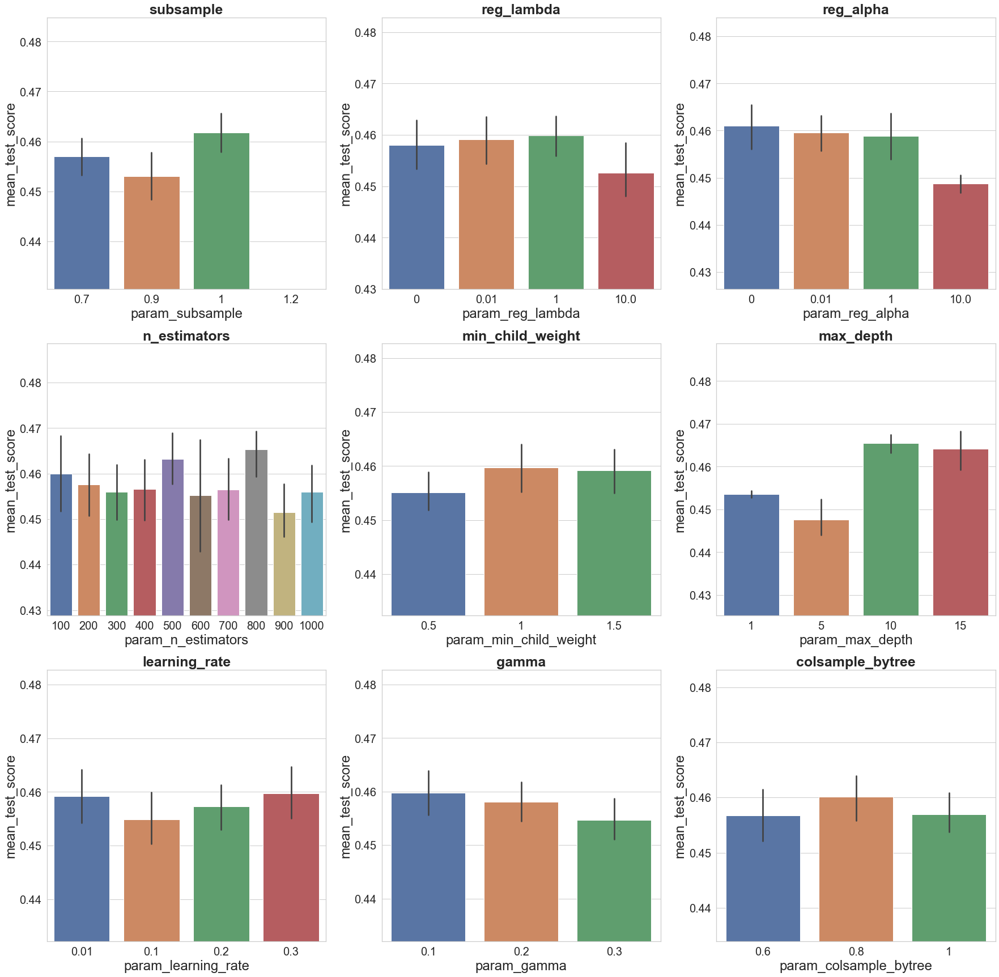

In [150]:
xgb_param_grid_1 = {'n_estimators': [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)],
              'learning_rate': [0.01, 0.1, 0.2, 0.3],
              'max_depth': [1, 5, 10, 15],
              'gamma': [0.1, 0.2, 0.3],
              'min_child_weight': [0.5, 1, 1.5],
              'subsample': [0.7, 0.9, 1, 1.2],
              'colsample_bytree': [0.6, 0.8, 1],
              'reg_alpha': [0, 1e-2, 1, 1e1],
              'reg_lambda': [0, 1e-2, 1, 1e1]}

bin_clf_3.add_est('xgb', xgb.XGBRFClassifier())
bin_clf_3.set_est_param_grid_1('xgb', xgb_param_grid_1)

bin_clf_3.first_round_search('xgb', 100)

In [179]:
xgb_param_grid_2 = {'n_estimators': [int(x) for x in np.linspace(start = 750, stop = 850, num = 10)],
              'learning_rate': [0.3,],
              'max_depth': [9, 10, 11],
              'gamma': [0.1,],
              'min_child_weight': [1.2, 1],
              'subsample': [1,],
              'colsample_bytree': [0.7, 0.8, 0.9],
              'reg_alpha': [0,],
              'reg_lambda': [1, ]}

bin_clf_3.set_est_param_grid_2('xgb', xgb_param_grid_2)
bin_clf_3.second_round_search('xgb')

Fitting 3 folds for each of 180 candidates, totalling 540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed: 23.8min
[Parallel(n_jobs=-1)]: Done 540 out of 540 | elapsed: 31.0min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[15:51:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy:  0.9200581395348837 

Confusion matrix: 

 [[611   1]
 [ 54  22]]


In [180]:
bin_clf_3.get_est_info('xgb')

est: XGBRFClassifier(base_score=None, booster=None, colsample_bylevel=None,
                colsample_bytree=None, gamma=None, gpu_id=None,
                importance_type='gain', interaction_constraints=None,
                max_delta_step=None, max_depth=None, min_child_weight=None,
                missing=nan, monotone_constraints=None, n_estimators=100,
                n_jobs=None, num_parallel_tree=None,
                objective='binary:logistic', random_state=None, reg_alpha=None,
                scale_pos_weight=None, tree_method=None,
                validate_parameters=None, verbosity=None)
param_grid_1: {'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], 'learning_rate': [0.01, 0.1, 0.2, 0.3], 'max_depth': [1, 5, 10, 15], 'gamma': [0.1, 0.2, 0.3], 'min_child_weight': [0.5, 1, 1.5], 'subsample': [0.7, 0.9, 1, 1.2], 'colsample_bytree': [0.6, 0.8, 1], 'reg_alpha': [0, 0.01, 1, 10.0], 'reg_lambda': [0, 0.01, 1, 10.0]}
param_grid_2: {'n_estimators': [750, 761, 7

### SVM

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   24.2s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.9min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'


SVC(C=10, gamma=0.0001, kernel='poly', max_iter=10000)

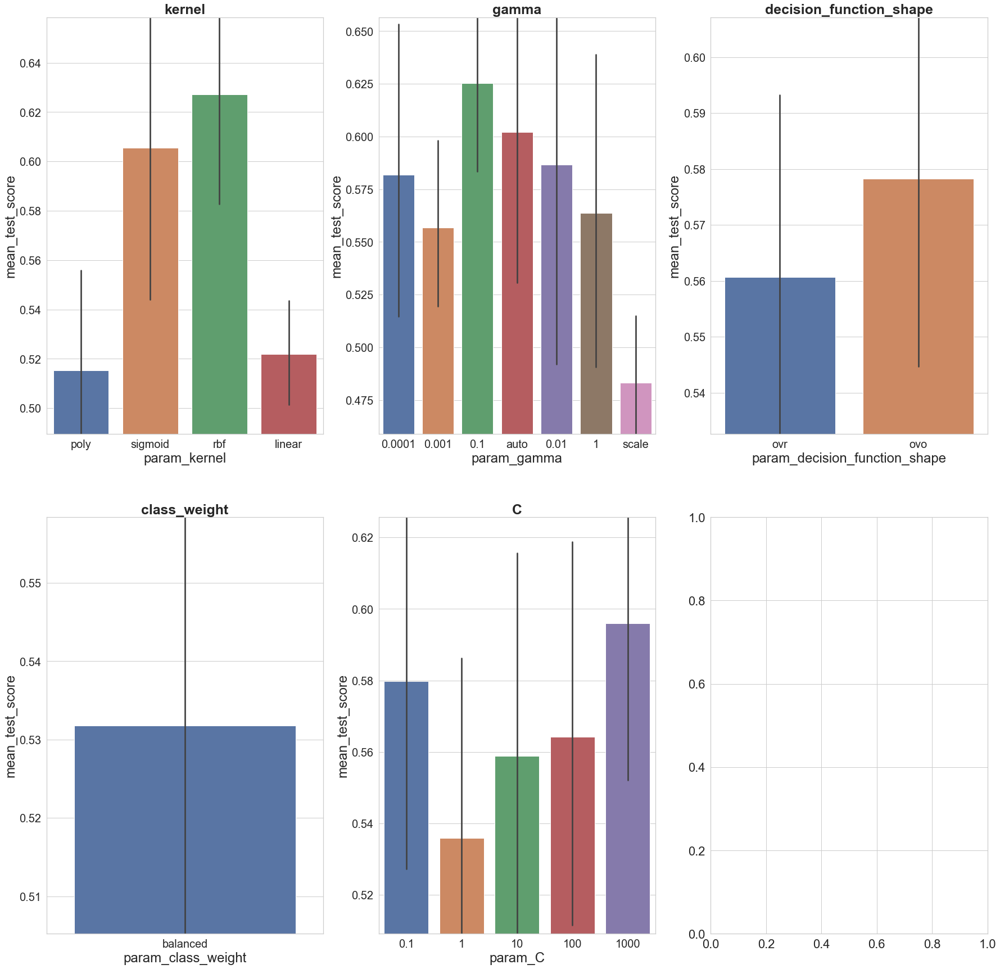

In [151]:
svm_param_grid_1 = {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
              'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001, 'scale', 'auto'],
              'class_weight': [None, 'balanced'],
              'decision_function_shape': ['ovr', 'ovo']}

bin_clf_3.add_est('svm', SVC(max_iter=10000))
bin_clf_3.set_est_param_grid_1('svm', svm_param_grid_1)

bin_clf_3.first_round_search('svm', 100)

In [181]:
svm_param_grid_2 = {'kernel': ['rbf'],
              'C': [990, 1000, 1100],
              'gamma': [0.1, ],
              'class_weight': ['balanced',],
              'decision_function_shape': ['ovo']}

bin_clf_3.set_est_param_grid_2('svm', svm_param_grid_2)
bin_clf_3.second_round_search('svm')

Fitting 3 folds for each of 3 candidates, totalling 9 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of   9 | elapsed:   13.5s remaining:    6.7s
[Parallel(n_jobs=-1)]: Done   9 out of   9 | elapsed:   13.7s finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'


Accuracy:  0.9375 

Confusion matrix: 

 [[612   0]
 [ 43  33]]


In [182]:
bin_clf_3.get_est_info('svm')

est: SVC(max_iter=10000)
param_grid_1: {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'], 'C': [0.1, 1, 10, 100, 1000], 'gamma': [1, 0.1, 0.01, 0.001, 0.0001, 'scale', 'auto'], 'class_weight': [None, 'balanced'], 'decision_function_shape': ['ovr', 'ovo']}
param_grid_2: {'kernel': ['rbf'], 'C': [990, 1000, 1100], 'gamma': [0.1], 'class_weight': ['balanced'], 'decision_function_shape': ['ovo']}
train_acc: 0.7519780401375536
best_params: {'C': 990, 'class_weight': 'balanced', 'decision_function_shape': 'ovo', 'gamma': 0.1, 'kernel': 'rbf'}
best_est: SVC(C=990, class_weight='balanced', decision_function_shape='ovo', gamma=0.1,
    max_iter=10000)
test_acc: 0.9375
confusion_matrix: [[612   0]
 [ 43  33]]
svm_pred_y: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

# 4

### knn

C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 3 folds for each of 80 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   15.5s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:   22.7s finished


KNeighborsClassifier(n_neighbors=20)

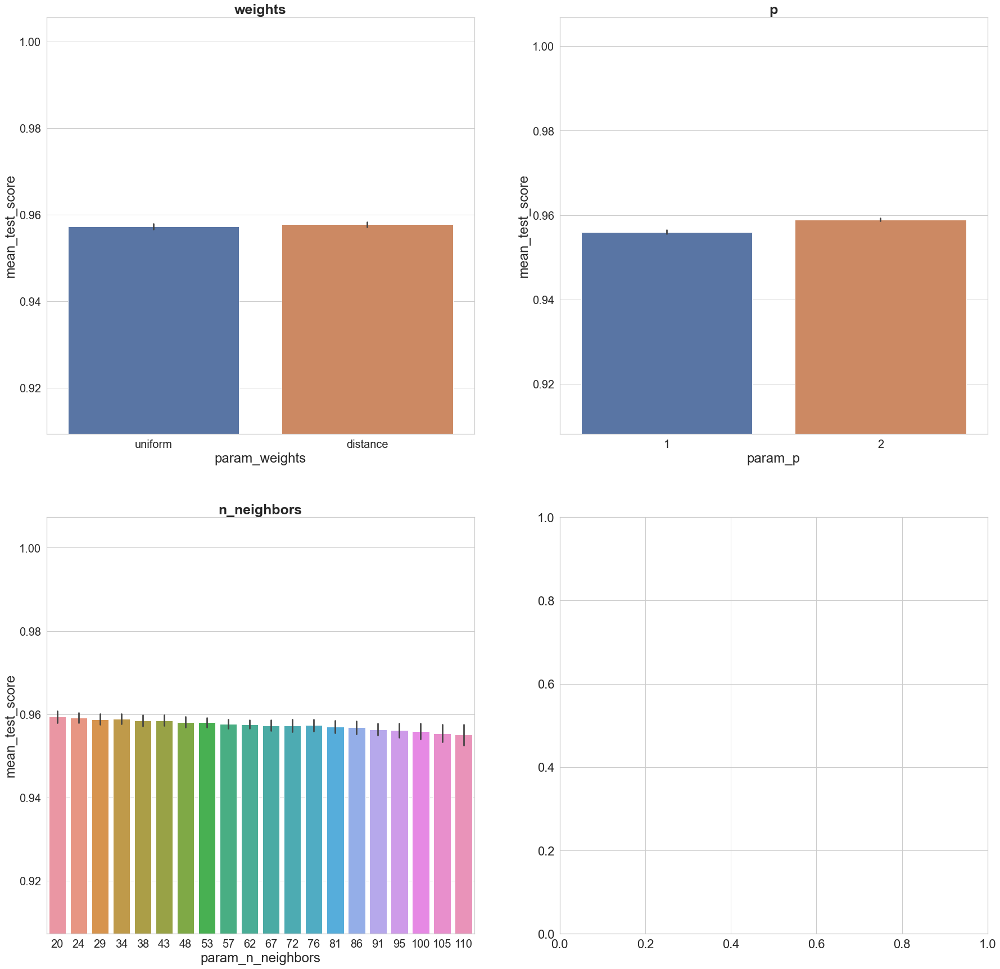

In [183]:
knn_param_grid_1 = {'n_neighbors': [int(x) for x in np.linspace(start = 20, stop = 110, num = 20)],
              'p': [1, 2],
              'weights': ['uniform', 'distance']}

bin_clf_4.add_est('knn', KNeighborsClassifier(metric='minkowski', algorithm='auto'))
bin_clf_4.set_est_param_grid_1('knn', knn_param_grid_1)

bin_clf_4.first_round_search('knn', 100)

In [200]:
knn_param_grid_2 = {'n_neighbors': [int(x) for x in np.linspace(start = 1, stop = 20, num = 10)],
              'p': [2,],
              'weights': ['distance',]}

bin_clf_4.set_est_param_grid_2('knn', knn_param_grid_2)

In [201]:
bin_clf_4.second_round_search('knn')

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    1.3s finished


Accuracy:  0.9229651162790697 

Confusion matrix: 

 [[ 52  49]
 [  4 583]]


In [202]:
bin_clf_4.get_est_info('knn')

est: KNeighborsClassifier()
param_grid_1: {'n_neighbors': [20, 24, 29, 34, 38, 43, 48, 53, 57, 62, 67, 72, 76, 81, 86, 91, 95, 100, 105, 110], 'p': [1, 2], 'weights': ['uniform', 'distance']}
param_grid_2: {'n_neighbors': [1, 3, 5, 7, 9, 11, 13, 15, 17, 20], 'p': [2], 'weights': ['distance']}
train_acc: 0.9607745546806123
best_params: {'n_neighbors': 20, 'p': 2, 'weights': 'distance'}
best_est: KNeighborsClassifier(n_neighbors=20, weights='distance')
test_acc: 0.9229651162790697
confusion_matrix: [[ 52  49]
 [  4 583]]
knn_pred_y: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 0 1
 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 0 1 1 1 1 1
 1 1 1 1 1 1 

### RandomForest

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   17.1s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.6min finished


RandomForestClassifier(bootstrap=False, max_depth=30, min_samples_leaf=2,
                       min_samples_split=60, n_estimators=600)

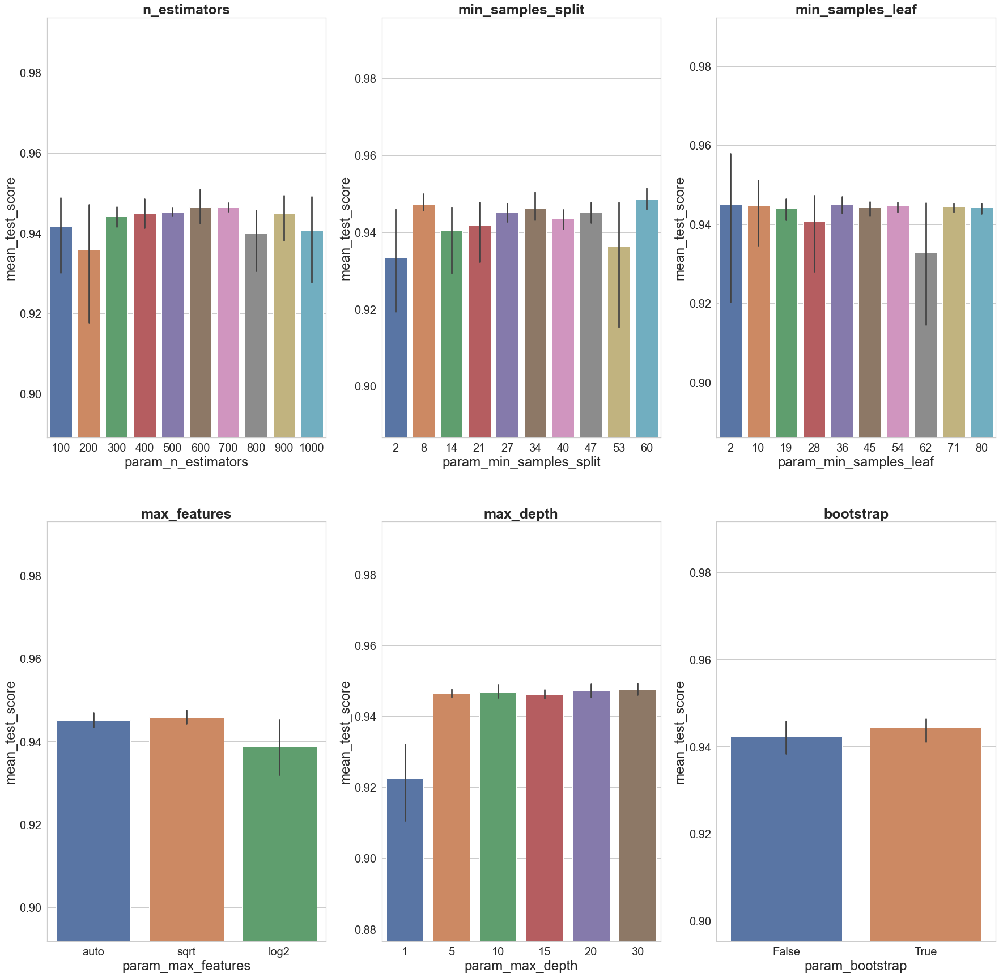

In [153]:
rf_param_grid_1 = {'n_estimators': [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)],
              'max_features': ['auto', 'log2', 'sqrt'],
              'max_depth': [1, 5, 10, 15, 20, 30],
              'min_samples_split': [int(x) for x in np.linspace(start = 2, stop = 60, num = 10)],
              'min_samples_leaf': [int(x) for x in np.linspace(start = 2, stop = 80, num = 10)],
              'bootstrap': [True, False]}

bin_clf_4.add_est('rf', RandomForestClassifier())
bin_clf_4.set_est_param_grid_1('rf', rf_param_grid_1)

bin_clf_4.first_round_search('rf', 100)

In [184]:
rf_param_grid_2 = {'n_estimators': [int(x) for x in np.linspace(start = 680, stop = 780, num = 10)],
              'max_features': ['sqrt',],
              'max_depth': [28, 30, 32],
              'min_samples_split': [6, 8, 10],
              'min_samples_leaf': [2, 4],
              'bootstrap': [True,]}

bin_clf_4.set_est_param_grid_2('rf', rf_param_grid_2)
bin_clf_4.second_round_search('rf')

Fitting 3 folds for each of 180 candidates, totalling 540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   31.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 540 out of 540 | elapsed:  8.4min finished


Accuracy:  0.8895348837209303 

Confusion matrix: 

 [[ 31  70]
 [  6 581]]


In [185]:
bin_clf_4.get_est_info('rf')

est: RandomForestClassifier()
param_grid_1: {'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], 'max_features': ['auto', 'log2', 'sqrt'], 'max_depth': [1, 5, 10, 15, 20, 30], 'min_samples_split': [2, 8, 14, 21, 27, 34, 40, 47, 53, 60], 'min_samples_leaf': [2, 10, 19, 28, 36, 45, 54, 62, 71, 80], 'bootstrap': [True, False]}
param_grid_2: {'n_estimators': [680, 691, 702, 713, 724, 735, 746, 757, 768, 780], 'max_features': ['sqrt'], 'max_depth': [28, 30, 32], 'min_samples_split': [6, 8, 10], 'min_samples_leaf': [2, 4], 'bootstrap': [True]}
train_acc: 0.9585768007277742
best_params: {'bootstrap': True, 'max_depth': 28, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 768}
best_est: RandomForestClassifier(max_depth=28, max_features='sqrt', min_samples_leaf=2,
                       min_samples_split=10, n_estimators=768)
test_acc: 0.8895348837209303
confusion_matrix: [[ 31  70]
 [  6 581]]
rf_pred_y: [1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1

### XGBoost

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   24.2s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.9min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:56:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBRFClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
                colsample_bytree=0.6, gamma=0.2, gpu_id=-1,
                importance_type='gain', interaction_constraints='',
                learning_rate=0.3, max_delta_step=0, max_depth=15,
                min_child_weight=1, missing=nan, monotone_constraints='()',
                n_estimators=400, n_jobs=12, num_parallel_tree=400,
                objective='binary:logistic', random_state=0, reg_alpha=10.0,
                reg_lambda=0, scale_pos_weight=1, subsample=0.7,
                tree_method='exact', validate_parameters=1, verbosity=None)

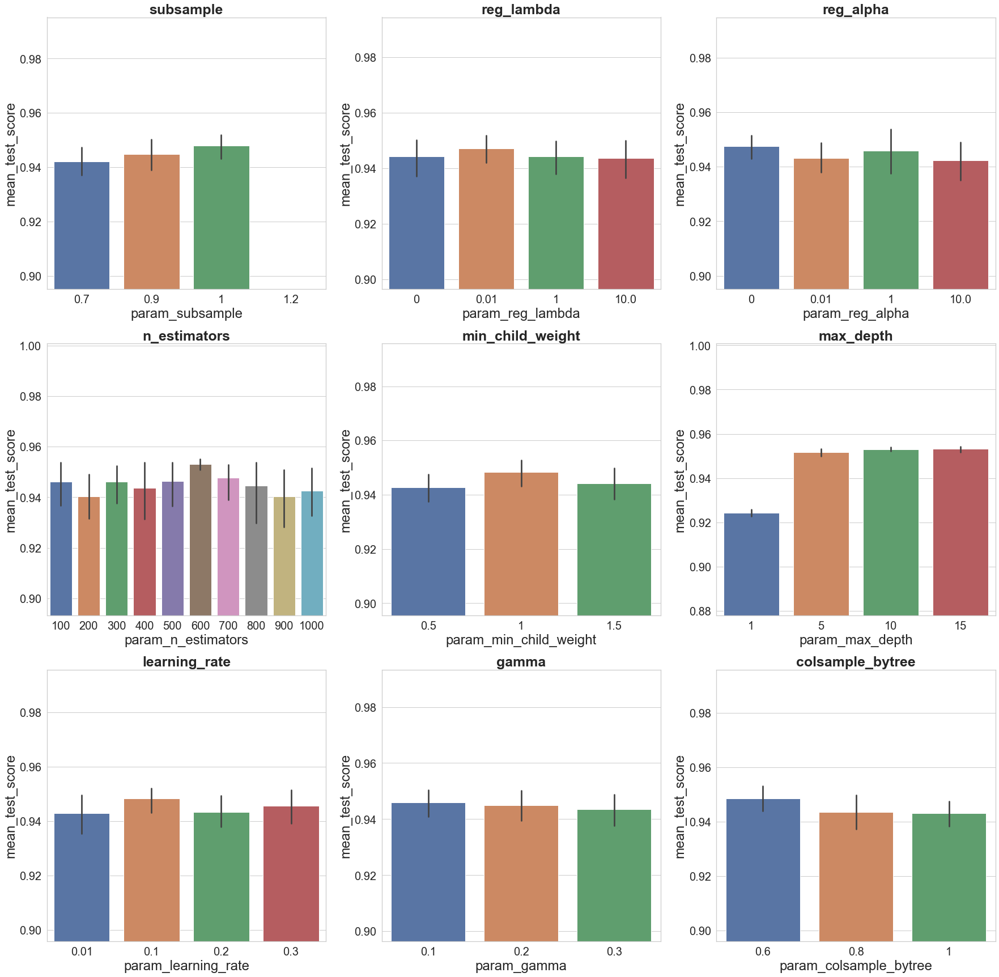

In [154]:
xgb_param_grid_1 = {'n_estimators': [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)],
              'learning_rate': [0.01, 0.1, 0.2, 0.3],
              'max_depth': [1, 5, 10, 15],
              'gamma': [0.1, 0.2, 0.3],
              'min_child_weight': [0.5, 1, 1.5],
              'subsample': [0.7, 0.9, 1, 1.2],
              'colsample_bytree': [0.6, 0.8, 1],
              'reg_alpha': [0, 1e-2, 1, 1e1],
              'reg_lambda': [0, 1e-2, 1, 1e1]}

bin_clf_4.add_est('xgb', xgb.XGBRFClassifier())
bin_clf_4.set_est_param_grid_1('xgb', xgb_param_grid_1)

bin_clf_4.first_round_search('xgb', 100)

In [186]:
xgb_param_grid_2 = {'n_estimators': [int(x) for x in np.linspace(start = 550, stop = 650, num = 10)],
              'learning_rate': [0.1,],
              'max_depth': [15],
              'gamma': [0.1,],
              'min_child_weight': [0.7, 1],
              'subsample': [1,],
              'colsample_bytree': [0.5, 0.6, 0.4],
              'reg_alpha': [0,],
              'reg_lambda': [0.01, 0.05]}

bin_clf_4.set_est_param_grid_2('xgb', xgb_param_grid_2)
bin_clf_4.second_round_search('xgb')

Fitting 3 folds for each of 120 candidates, totalling 360 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   56.5s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 360 out of 360 | elapsed: 11.7min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:12:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy:  0.9069767441860465 

Confusion matrix: 

 [[ 43  58]
 [  6 581]]


In [187]:
bin_clf_4.get_est_info('xgb')

est: XGBRFClassifier(base_score=None, booster=None, colsample_bylevel=None,
                colsample_bytree=None, gamma=None, gpu_id=None,
                importance_type='gain', interaction_constraints=None,
                max_delta_step=None, max_depth=None, min_child_weight=None,
                missing=nan, monotone_constraints=None, n_estimators=100,
                n_jobs=None, num_parallel_tree=None,
                objective='binary:logistic', random_state=None, reg_alpha=None,
                scale_pos_weight=None, tree_method=None,
                validate_parameters=None, verbosity=None)
param_grid_1: {'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], 'learning_rate': [0.01, 0.1, 0.2, 0.3], 'max_depth': [1, 5, 10, 15], 'gamma': [0.1, 0.2, 0.3], 'min_child_weight': [0.5, 1, 1.5], 'subsample': [0.7, 0.9, 1, 1.2], 'colsample_bytree': [0.6, 0.8, 1], 'reg_alpha': [0, 0.01, 1, 10.0], 'reg_lambda': [0, 0.01, 1, 10.0]}
param_grid_2: {'n_estimators': [550, 561, 5

### SVM

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   15.4s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.4min finished


SVC(C=10, decision_function_shape='ovo', max_iter=10000)

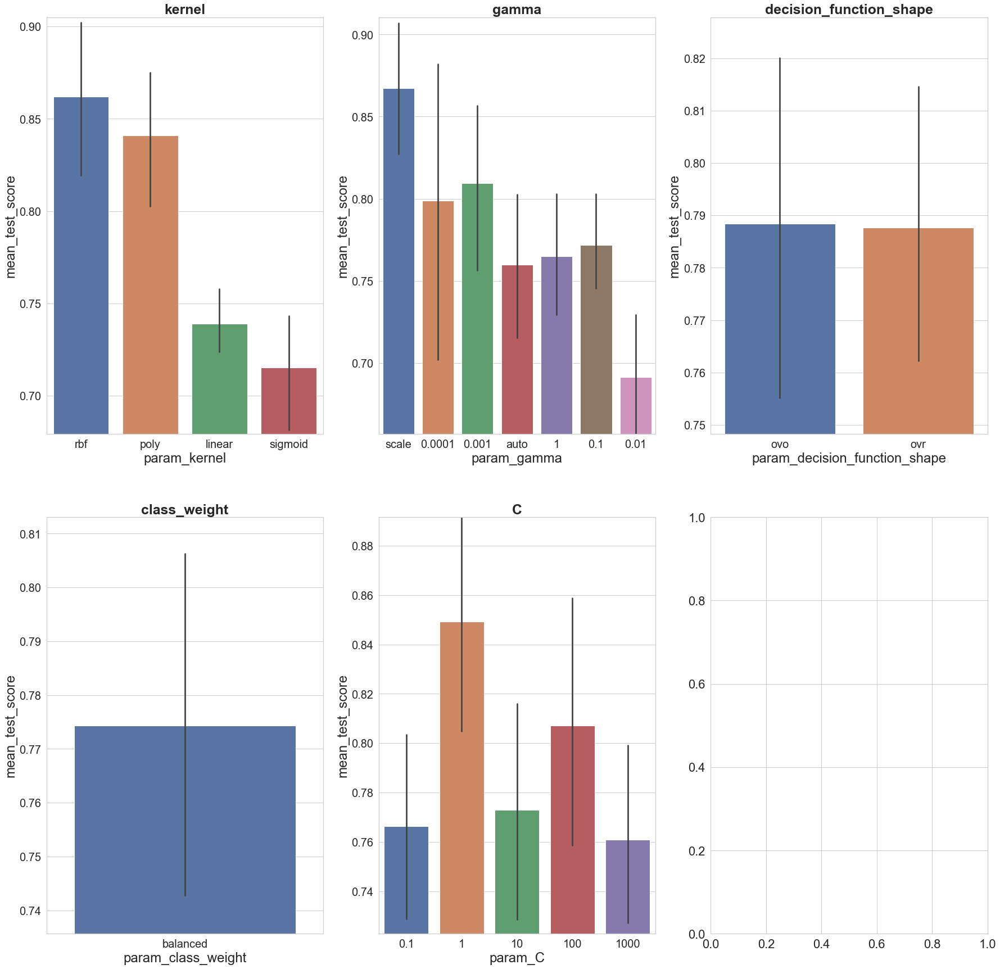

In [155]:
svm_param_grid_1 = {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
              'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001, 'scale', 'auto'],
              'class_weight': [None, 'balanced'],
              'decision_function_shape': ['ovr', 'ovo']}

bin_clf_4.add_est('svm', SVC(max_iter=10000))
bin_clf_4.set_est_param_grid_1('svm', svm_param_grid_1)

bin_clf_4.first_round_search('svm', 100)

In [188]:
svm_param_grid_2 = {'kernel': ['rbf'],
              'C': [0.9, 1, 2, 5],
              'gamma': ['scale', ],
              'class_weight': ['balanced',],
              'decision_function_shape': ['ovr',]}

bin_clf_4.set_est_param_grid_2('svm', svm_param_grid_2)
bin_clf_4.second_round_search('svm')

Fitting 3 folds for each of 4 candidates, totalling 12 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of  12 | elapsed:    0.7s remaining:    4.1s
[Parallel(n_jobs=-1)]: Done  12 out of  12 | elapsed:    1.7s finished


Accuracy:  0.8706395348837209 

Confusion matrix: 

 [[ 14  87]
 [  2 585]]


In [189]:
bin_clf_4.get_est_info('svm')

est: SVC(max_iter=10000)
param_grid_1: {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'], 'C': [0.1, 1, 10, 100, 1000], 'gamma': [1, 0.1, 0.01, 0.001, 0.0001, 'scale', 'auto'], 'class_weight': [None, 'balanced'], 'decision_function_shape': ['ovr', 'ovo']}
param_grid_2: {'kernel': ['rbf'], 'C': [0.9, 1, 2, 5], 'gamma': ['scale'], 'class_weight': ['balanced'], 'decision_function_shape': ['ovr']}
train_acc: 0.9578076303125157
best_params: {'C': 5, 'class_weight': 'balanced', 'decision_function_shape': 'ovr', 'gamma': 'scale', 'kernel': 'rbf'}
best_est: SVC(C=5, class_weight='balanced', max_iter=10000)
test_acc: 0.8706395348837209
confusion_matrix: [[ 14  87]
 [  2 585]]
svm_pred_y: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1

# 5

### knn

Fitting 3 folds for each of 80 candidates, totalling 240 fits


C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 80 is smaller than n_iter=100. Running 80 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   13.0s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:   18.3s finished


KNeighborsClassifier(n_neighbors=20, p=1, weights='distance')

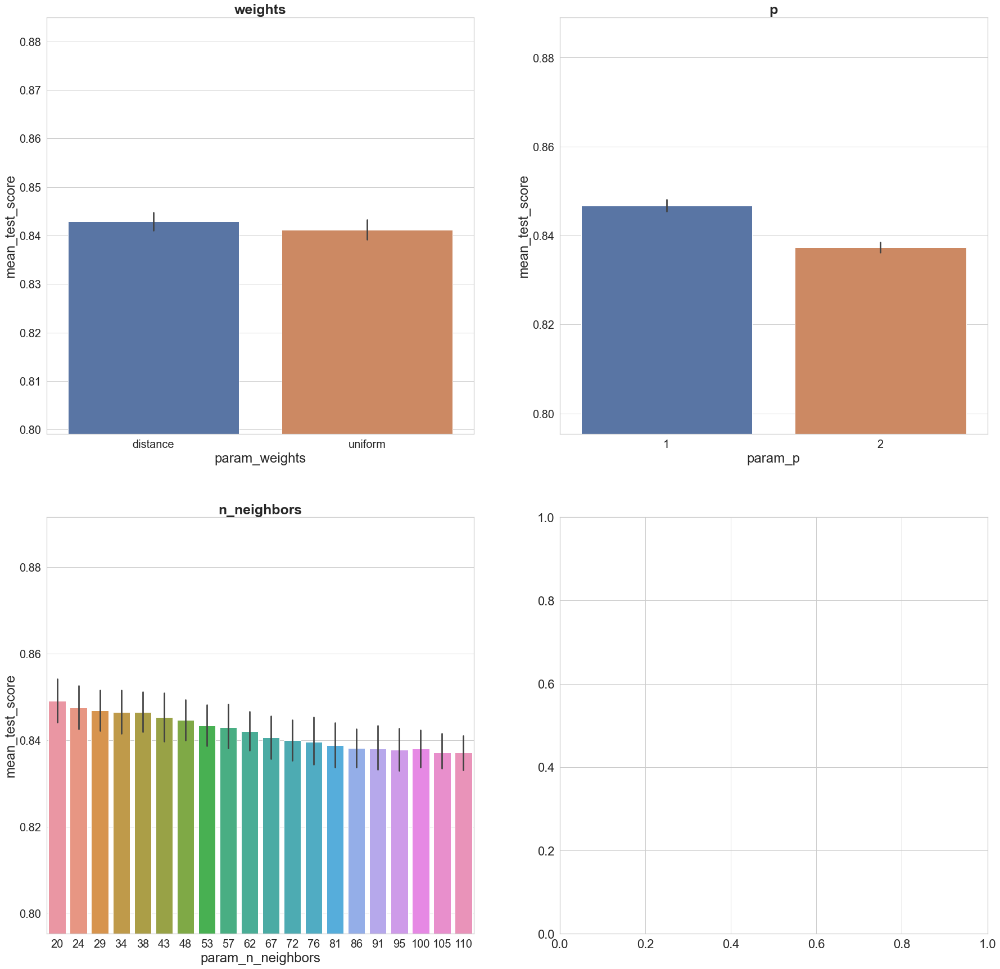

In [190]:
knn_param_grid_1 = {'n_neighbors': [int(x) for x in np.linspace(start = 20, stop = 110, num = 20)],
              'p': [1, 2],
              'weights': ['uniform', 'distance']}

bin_clf_5.add_est('knn', KNeighborsClassifier(metric='minkowski', algorithm='auto'))
bin_clf_5.set_est_param_grid_1('knn', knn_param_grid_1)

bin_clf_5.first_round_search('knn', 100)

In [203]:
knn_param_grid_2 = {'n_neighbors': [int(x) for x in np.linspace(start = 1, stop = 20, num = 10)],
              'p': [1,],
              'weights': ['distance',]}

bin_clf_5.set_est_param_grid_2('knn', knn_param_grid_2)

In [204]:
bin_clf_5.second_round_search('knn')

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    1.8s finished


Accuracy:  0.9811046511627907 

Confusion matrix: 

 [[670   1]
 [ 12   5]]


In [205]:
bin_clf_5.get_est_info('knn')

est: KNeighborsClassifier()
param_grid_1: {'n_neighbors': [20, 24, 29, 34, 38, 43, 48, 53, 57, 62, 67, 72, 76, 81, 86, 91, 95, 100, 105, 110], 'p': [1, 2], 'weights': ['uniform', 'distance']}
param_grid_2: {'n_neighbors': [1, 3, 5, 7, 9, 11, 13, 15, 17, 20], 'p': [1], 'weights': ['distance']}
train_acc: 0.8605418764642908
best_params: {'n_neighbors': 7, 'p': 1, 'weights': 'distance'}
best_est: KNeighborsClassifier(n_neighbors=7, p=1, weights='distance')
test_acc: 0.9811046511627907
confusion_matrix: [[670   1]
 [ 12   5]]
knn_pred_y: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0

### RandomForest

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.1min finished


RandomForestClassifier(bootstrap=False, max_depth=30, max_features='log2',
                       min_samples_leaf=2, min_samples_split=8,
                       n_estimators=1000)

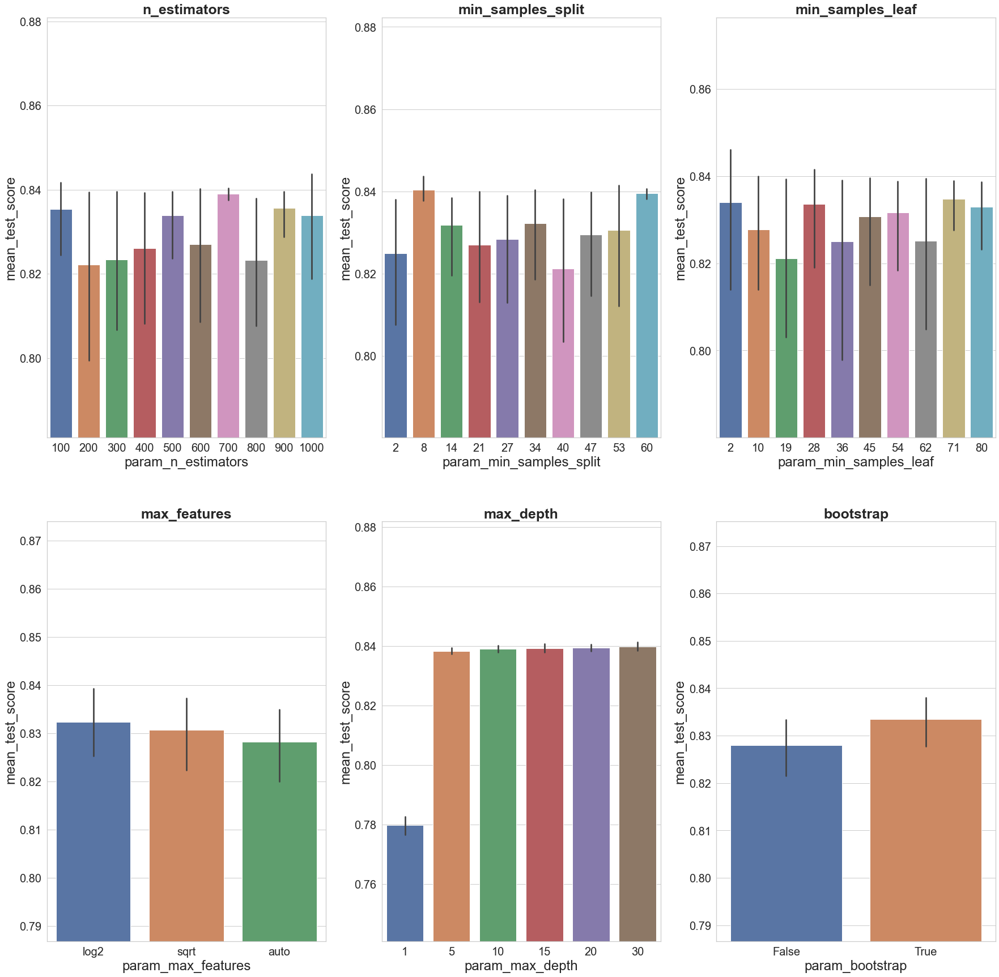

In [157]:
rf_param_grid_1 = {'n_estimators': [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)],
              'max_features': ['auto', 'log2', 'sqrt'],
              'max_depth': [1, 5, 10, 15, 20, 30],
              'min_samples_split': [int(x) for x in np.linspace(start = 2, stop = 60, num = 10)],
              'min_samples_leaf': [int(x) for x in np.linspace(start = 2, stop = 80, num = 10)],
              'bootstrap': [True, False]}

bin_clf_5.add_est('rf', RandomForestClassifier())
bin_clf_5.set_est_param_grid_1('rf', rf_param_grid_1)

bin_clf_5.first_round_search('rf', 100)

In [191]:
rf_param_grid_2 = {'n_estimators': [int(x) for x in np.linspace(start = 680, stop = 780, num = 10)],
              'max_features': ['log2',],
              'max_depth': [28, 30, 32],
              'min_samples_split': [6, 10, 8],
              'min_samples_leaf': [2, 4, 6],
              'bootstrap': [True,]}

bin_clf_5.set_est_param_grid_2('rf', rf_param_grid_2)
bin_clf_5.second_round_search('rf')

Fitting 3 folds for each of 270 candidates, totalling 810 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   31.1s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 810 out of 810 | elapsed: 12.2min finished


Accuracy:  0.9723837209302325 

Confusion matrix: 

 [[669   2]
 [ 17   0]]


In [192]:
bin_clf_5.get_est_info('rf')

est: RandomForestClassifier()
param_grid_1: {'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], 'max_features': ['auto', 'log2', 'sqrt'], 'max_depth': [1, 5, 10, 15, 20, 30], 'min_samples_split': [2, 8, 14, 21, 27, 34, 40, 47, 53, 60], 'min_samples_leaf': [2, 10, 19, 28, 36, 45, 54, 62, 71, 80], 'bootstrap': [True, False]}
param_grid_2: {'n_estimators': [680, 691, 702, 713, 724, 735, 746, 757, 768, 780], 'max_features': ['log2'], 'max_depth': [28, 30, 32], 'min_samples_split': [6, 10, 8], 'min_samples_leaf': [2, 4, 6], 'bootstrap': [True]}
train_acc: 0.850872186509445
best_params: {'bootstrap': True, 'max_depth': 28, 'max_features': 'log2', 'min_samples_leaf': 2, 'min_samples_split': 6, 'n_estimators': 691}
best_est: RandomForestClassifier(max_depth=28, max_features='log2', min_samples_leaf=2,
                       min_samples_split=6, n_estimators=691)
test_acc: 0.9723837209302325
confusion_matrix: [[669   2]
 [ 17   0]]
rf_pred_y: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

### XGBoost

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   28.8s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.7min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:06:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBRFClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
                colsample_bytree=0.8, gamma=0.3, gpu_id=-1,
                importance_type='gain', interaction_constraints='',
                learning_rate=0.01, max_delta_step=0, max_depth=10,
                min_child_weight=0.5, missing=nan, monotone_constraints='()',
                n_estimators=800, n_jobs=12, num_parallel_tree=800,
                objective='binary:logistic', random_state=0, reg_alpha=0.01,
                reg_lambda=0.01, scale_pos_weight=1, subsample=1,
                tree_method='exact', validate_parameters=1, verbosity=None)

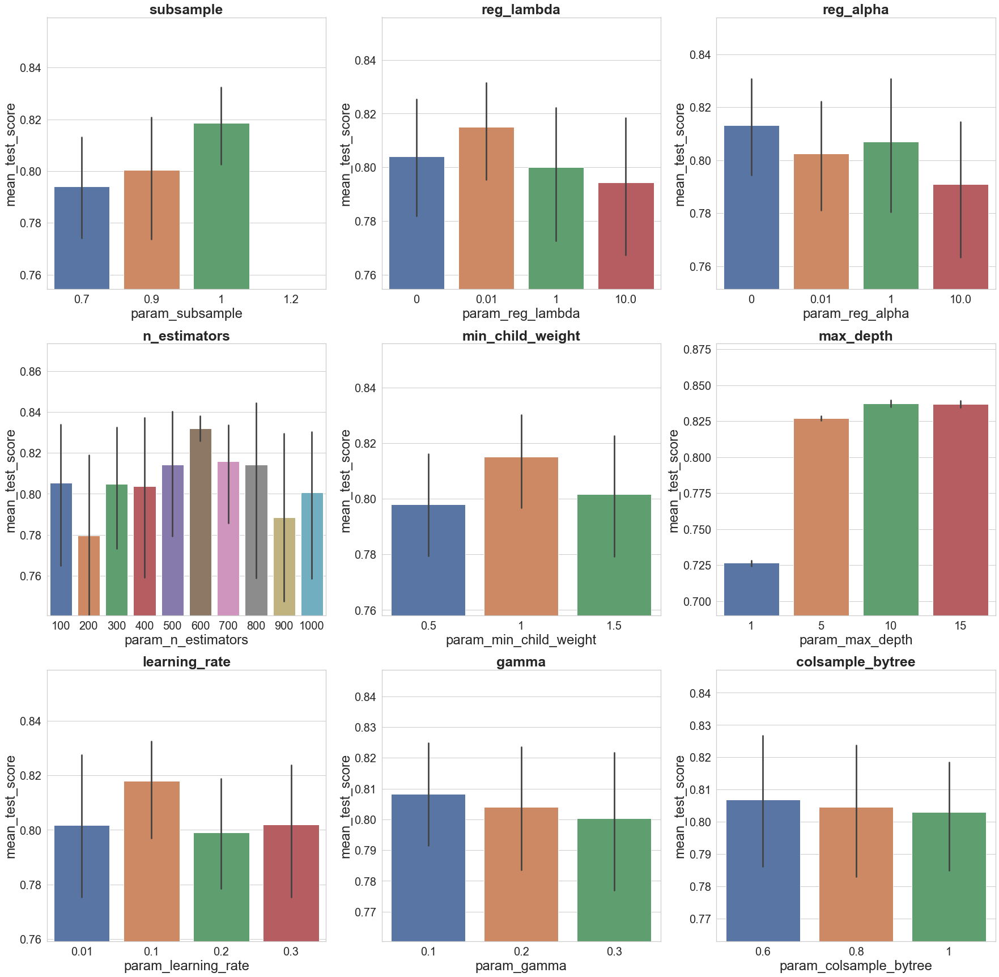

In [158]:
xgb_param_grid_1 = {'n_estimators': [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)],
              'learning_rate': [0.01, 0.1, 0.2, 0.3],
              'max_depth': [1, 5, 10, 15],
              'gamma': [0.1, 0.2, 0.3],
              'min_child_weight': [0.5, 1, 1.5],
              'subsample': [0.7, 0.9, 1, 1.2],
              'colsample_bytree': [0.6, 0.8, 1],
              'reg_alpha': [0, 1e-2, 1, 1e1],
              'reg_lambda': [0, 1e-2, 1, 1e1]}

bin_clf_5.add_est('xgb', xgb.XGBRFClassifier())
bin_clf_5.set_est_param_grid_1('xgb', xgb_param_grid_1)

bin_clf_5.first_round_search('xgb', 100)

In [193]:
xgb_param_grid_2 = {'n_estimators': [int(x) for x in np.linspace(start = 550, stop = 650, num = 10)],
              'learning_rate': [0.1,],
              'max_depth': [10, 12],
              'gamma': [0.1,],
              'min_child_weight': [0.7, 1],
              'subsample': [1,],
              'colsample_bytree': [0.5, 0.6, 0.4],
              'reg_alpha': [0,],
              'reg_lambda': [0.01, 0.05]}

bin_clf_5.set_est_param_grid_2('xgb', xgb_param_grid_2)
bin_clf_5.second_round_search('xgb')

Fitting 3 folds for each of 240 candidates, totalling 720 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed: 25.3min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:50:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy:  0.9723837209302325 

Confusion matrix: 

 [[669   2]
 [ 17   0]]


In [194]:
bin_clf_5.get_est_info('xgb')

est: XGBRFClassifier(base_score=None, booster=None, colsample_bylevel=None,
                colsample_bytree=None, gamma=None, gpu_id=None,
                importance_type='gain', interaction_constraints=None,
                max_delta_step=None, max_depth=None, min_child_weight=None,
                missing=nan, monotone_constraints=None, n_estimators=100,
                n_jobs=None, num_parallel_tree=None,
                objective='binary:logistic', random_state=None, reg_alpha=None,
                scale_pos_weight=None, tree_method=None,
                validate_parameters=None, verbosity=None)
param_grid_1: {'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], 'learning_rate': [0.01, 0.1, 0.2, 0.3], 'max_depth': [1, 5, 10, 15], 'gamma': [0.1, 0.2, 0.3], 'min_child_weight': [0.5, 1, 1.5], 'subsample': [0.7, 0.9, 1, 1.2], 'colsample_bytree': [0.6, 0.8, 1], 'reg_alpha': [0, 0.01, 1, 10.0], 'reg_lambda': [0, 0.01, 1, 10.0]}
param_grid_2: {'n_estimators': [550, 561, 5

### SVM

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   19.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.6min finished
C:\Users\Konstantin\.conda\envs\ml_hse\lib\site-packages\sklearn\svm\_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'


SVC(C=100, decision_function_shape='ovo', max_iter=10000)

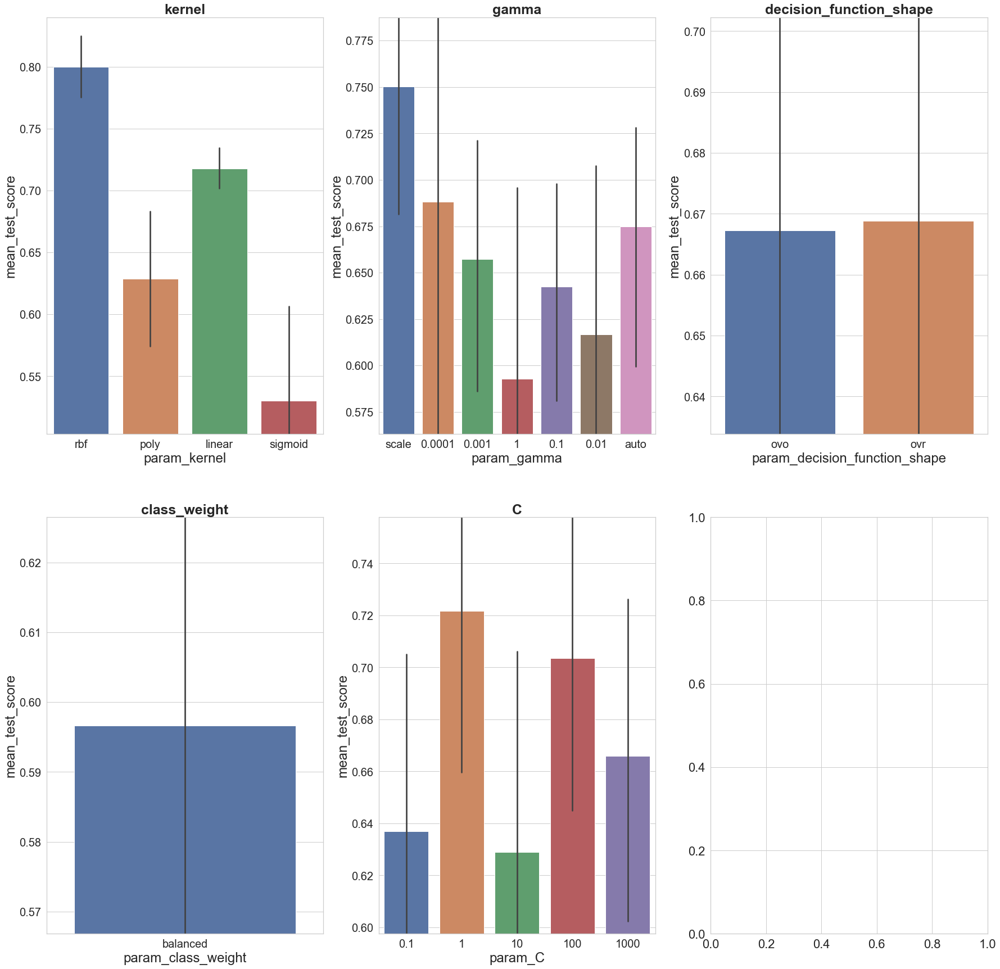

In [159]:
svm_param_grid_1 = {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
              'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001, 'scale', 'auto'],
              'class_weight': [None, 'balanced'],
              'decision_function_shape': ['ovr', 'ovo']}

bin_clf_5.add_est('svm', SVC(max_iter=10000))
bin_clf_5.set_est_param_grid_1('svm', svm_param_grid_1)

bin_clf_5.first_round_search('svm', 100)

In [195]:
svm_param_grid_2 = {'kernel': ['rbf'],
              'C': [0.9, 1, 2, 5],
              'gamma': ['scale', ],
              'class_weight': ['balanced',],
              'decision_function_shape': ['ovr',]}

bin_clf_5.set_est_param_grid_2('svm', svm_param_grid_2)
bin_clf_5.second_round_search('svm')

Fitting 3 folds for each of 4 candidates, totalling 12 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of  12 | elapsed:    2.4s remaining:   12.4s
[Parallel(n_jobs=-1)]: Done  12 out of  12 | elapsed:    4.0s finished


Accuracy:  0.9723837209302325 

Confusion matrix: 

 [[669   2]
 [ 17   0]]


In [196]:
bin_clf_5.get_est_info('svm')

est: SVC(max_iter=10000)
param_grid_1: {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'], 'C': [0.1, 1, 10, 100, 1000], 'gamma': [1, 0.1, 0.01, 0.001, 0.0001, 'scale', 'auto'], 'class_weight': [None, 'balanced'], 'decision_function_shape': ['ovr', 'ovo']}
param_grid_2: {'kernel': ['rbf'], 'C': [0.9, 1, 2, 5], 'gamma': ['scale'], 'class_weight': ['balanced'], 'decision_function_shape': ['ovr']}
train_acc: 0.8394390627147376
best_params: {'C': 5, 'class_weight': 'balanced', 'decision_function_shape': 'ovr', 'gamma': 'scale', 'kernel': 'rbf'}
best_est: SVC(C=5, class_weight='balanced', max_iter=10000)
test_acc: 0.9723837209302325
confusion_matrix: [[669   2]
 [ 17   0]]
svm_pred_y: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0

In [228]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(bin_clf_2.get_result_df())

      real_y  knn_y  rf_y  xgb_y  svm_y
265        0      0     0      0      0
1009       0      0     0      0      0
1130       0      0     0      0      0
579        0      0     0      0      0
1665       0      0     0      0      0
636        0      0     0      0      0
2651       0      0     0      0      0
1001       0      0     0      0      0
2618       0      0     0      0      0
340        0      0     0      0      0
2558       0      0     0      0      0
3284       0      0     0      0      0
328        0      0     0      0      0
591        0      0     0      0      0
395        0      0     0      0      0
182        0      0     0      0      0
1441       0      0     0      0      0
508        0      0     0      0      0
2792       0      0     0      0      0
431        0      0     0      0      0
1725       0      0     0      0      0
1020       0      0     0      0      0
1371       0      0     0      0      0
135        0      0     0      0      0


In [272]:
def create_model_bin(neurons1=None, neurons2=None, neurons3=None, activation="relu", optimizer='Adam', loss=keras.losses.MeanSquaredError()):
    model = keras.Sequential()
    if neurons1:
        model.add(Dense(neurons1, activation=activation, kernel_regularizer=keras.regularizers.l2(0.001)))
    if neurons2:
        model.add(Dense(neurons2, activation=activation, kernel_regularizer=keras.regularizers.l2(0.001)))
    if neurons3:
        model.add(Dense(neurons3, activation=activation, kernel_regularizer=keras.regularizers.l2(0.001)))
    model.add(Dense(2, activation="softmax"))
    model.compile(optimizer=optimizer, 
                  loss=loss,
                  metrics=[keras.metrics.categorical_accuracy]
         )
    return model

In [231]:
neurons1 = [2**i for i in range(4, 9)]
neurons2 = [2**i for i in range(4, 9)]
neurons3 = [2**i for i in range(4, 9)]
activation = ["relu", "tanh"]
optimizer = ['Adam', 'SGD']
loss = ['mse']
epochs = [20, 50, 100]
batch_size= [5, 10, 15, 20]

param_grid = dict(neurons1=neurons1, 
                  neurons2=neurons2, 
                  neurons3=neurons3, 
                  activation=activation, 
                  optimizer=optimizer,
                  loss=loss,
                  epochs=epochs,
                  batch_size=batch_size)
param_grid

{'neurons1': [16, 32, 64, 128, 256],
 'neurons2': [16, 32, 64, 128, 256],
 'neurons3': [16, 32, 64, 128, 256],
 'activation': ['relu', 'tanh'],
 'optimizer': ['Adam', 'SGD'],
 'loss': ['mse'],
 'epochs': [20, 50, 100],
 'batch_size': [5, 10, 15, 20]}

In [292]:
def first_round_search(est, param_grid, train_x, train_y, num_iter=100):
    early_stopping = EarlyStopping(monitor='categorical_accuracy', patience=5)
    grid = RandomizedSearchCV(estimator=est,
                               param_distributions=param_grid,
                               n_iter = num_iter,
                               scoring=scorer,
                               verbose=1,
                               cv=3,
                               n_jobs=-1)
    grid_result = grid.fit(train_x, train_y, callbacks=[early_stopping])
    rs_df = pd.DataFrame(grid_result.cv_results_).sort_values('rank_test_score').reset_index(drop=True)
    rs_df = rs_df.drop([
            'mean_fit_time', 
            'std_fit_time', 
            'mean_score_time',
            'std_score_time', 
            'params',
            'split0_test_score', 
            'split1_test_score', 
            'split2_test_score', 
            'std_test_score'],
            axis=1)
    params_labels = [param for param in rs_df.columns if 'param' in param]
    
    cols = ceil(np.sqrt(len(params_labels)))
    lines = ceil(len(params_labels)/cols)
    fig, axs = plt.subplots(ncols=cols, nrows=lines)
    sns.set(style="whitegrid", color_codes=True, font_scale = 2)
    fig.set_size_inches(30,30)
    
    col = 0
    line = 0
    for param in params_labels:
        sns.barplot(x=param, y='mean_test_score', data=rs_df, ax=axs[line, col])
        axs[line, col].set_ylim([rs_df.groupby(param).mean()['mean_test_score'].min()*0.95,
                                 rs_df.groupby(param).mean()['mean_test_score'].max()*1.05])
        axs[line, col].set_title(label = param.replace('param_', ''), size=25, weight='bold')
        
        if col < cols - 1:
            col += 1
        else:
            line += 1
            col = 0
    

In [275]:
def ohe(y):
    y_nn = []
    for y in y:
        dummy = np.zeros(4)
        y = y - 2
        dummy[y] = 1
        y_nn.append(dummy)
    return np.array(y_nn)
    
def re_ohe(y):
    dummy = np.array([np.argmax(i) for i in y])
    return dummy + 2
    
def custom_scorer(y_true_nn, y_pred):
    y_true = re_ohe(y_true_nn)
    y_pred += 2
    return accuracy_score(y_true, y_pred)

In [291]:
scorer = make_scorer(custom_scorer, greater_is_better=True)

In [321]:
def model_res(est, train_x, train_y, test_x, test_y):
    est.fit(train_x, train_y)
    pred_y = est.predict(test_x)
    cm = confusion_matrix(test_y, pred_y)
    acc = accuracy_score(test_y, pred_y)
    print('Accuracy: ', acc, '\n')
    print('Confusion matrix: \n\n', cm)

In [367]:
bin_clf = pd.DataFrame(df_gen['cls'], index=df_gen.index)

bin_clf = bin_clf.join(pd.DataFrame(bin_clf_2.est_knn['best_est'].predict(bin_clf_2.train_x),
                          index=bin_clf_2.train_y.index,
                          columns=['knn_2',]), )
bin_clf = bin_clf.join(pd.DataFrame(bin_clf_2.est_rf['best_est'].predict(bin_clf_2.train_x),
                          index=bin_clf_2.train_y.index,
                          columns=['rf_2',]))
bin_clf = bin_clf.join(pd.DataFrame(bin_clf_2.est_xgb['best_est'].predict(bin_clf_2.train_x),
                          index=bin_clf_2.train_y.index,
                          columns=['xgb_2',]))
bin_clf = bin_clf.join(pd.DataFrame(bin_clf_2.est_svm['best_est'].predict(bin_clf_2.train_x),
                          index=bin_clf_2.train_y.index,
                          columns=['svm_2',]))

bin_clf = bin_clf.join(pd.DataFrame(bin_clf_3.est_knn['best_est'].predict(bin_clf_3.train_x),
                          index=bin_clf_3.train_y.index,
                          columns=['knn_3',]), )
bin_clf = bin_clf.join(pd.DataFrame(bin_clf_3.est_rf['best_est'].predict(bin_clf_3.train_x),
                          index=bin_clf_3.train_y.index,
                          columns=['rf_3',]))
bin_clf = bin_clf.join(pd.DataFrame(bin_clf_3.est_xgb['best_est'].predict(bin_clf_3.train_x),
                          index=bin_clf_3.train_y.index,
                          columns=['xgb_3',]))
bin_clf = bin_clf.join(pd.DataFrame(bin_clf_3.est_svm['best_est'].predict(bin_clf_3.train_x),
                          index=bin_clf_3.train_y.index,
                          columns=['svm_3',]))

bin_clf = bin_clf.join(pd.DataFrame(bin_clf_4.est_knn['best_est'].predict(bin_clf_4.train_x),
                          index=bin_clf_4.train_y.index,
                          columns=['knn_4',]), )
bin_clf = bin_clf.join(pd.DataFrame(bin_clf_4.est_rf['best_est'].predict(bin_clf_4.train_x),
                          index=bin_clf_4.train_y.index,
                          columns=['rf_4',]))
bin_clf = bin_clf.join(pd.DataFrame(bin_clf_4.est_xgb['best_est'].predict(bin_clf_4.train_x),
                          index=bin_clf_4.train_y.index,
                          columns=['xgb_4',]))
bin_clf = bin_clf.join(pd.DataFrame(bin_clf_4.est_svm['best_est'].predict(bin_clf_4.train_x),
                          index=bin_clf_4.train_y.index,
                          columns=['svm_4',]))

bin_clf = bin_clf.join(pd.DataFrame(bin_clf_5.est_knn['best_est'].predict(bin_clf_5.train_x),
                          index=bin_clf_5.train_y.index,
                          columns=['knn_5',]), )
bin_clf = bin_clf.join(pd.DataFrame(bin_clf_5.est_rf['best_est'].predict(bin_clf_5.train_x),
                          index=bin_clf_5.train_y.index,
                          columns=['rf_5',]))
bin_clf = bin_clf.join(pd.DataFrame(bin_clf_5.est_xgb['best_est'].predict(bin_clf_5.train_x),
                          index=bin_clf_5.train_y.index,
                          columns=['xgb_5',]))
bin_clf = bin_clf.join(pd.DataFrame(bin_clf_5.est_svm['best_est'].predict(bin_clf_5.train_x),
                          index=bin_clf_5.train_y.index,
                          columns=['svm_5',]))

In [ ]:
cols = bin_clf.columns
first_round_search(est=KerasClassifier(build_fn=create_model_bin),
                   param_grid=param_grid,
                   train_x=bin_clf[cols[cols != 'cls']], 
                   train_y=bin_clf['cls'],
                   num_iter=100)

In [363]:
bin_clf_test = pd.DataFrame(test_y, index=test_y.index)
       
bin_clf_test = bin_clf_test.join(pd.DataFrame(bin_clf_2.est_knn['best_est'].predict(bin_clf_2.test_x),
                index=bin_clf_2.test_y.index,
                columns=['knn_2',]), )
bin_clf_test = bin_clf_test.join(pd.DataFrame(bin_clf_2.est_rf['best_est'].predict(bin_clf_2.test_x),
                index=bin_clf_2.test_y.index,
                columns=['rf_2',]))
bin_clf_test = bin_clf_test.join(pd.DataFrame(bin_clf_2.est_xgb['best_est'].predict(bin_clf_2.test_x),
                index=bin_clf_2.test_y.index,
                columns=['xgb_2',]))
bin_clf_test = bin_clf_test.join(pd.DataFrame(bin_clf_2.est_svm['best_est'].predict(bin_clf_2.test_x),
                index=bin_clf_2.test_y.index,
                columns=['svm_2',]))
       
bin_clf_test = bin_clf_test.join(pd.DataFrame(bin_clf_3.est_knn['best_est'].predict(bin_clf_3.test_x),
                index=bin_clf_3.test_y.index,
                columns=['knn_3',]), )
bin_clf_test = bin_clf_test.join(pd.DataFrame(bin_clf_3.est_rf['best_est'].predict(bin_clf_3.test_x),
                index=bin_clf_3.test_y.index,
                columns=['rf_3',]))
bin_clf_test = bin_clf_test.join(pd.DataFrame(bin_clf_3.est_xgb['best_est'].predict(bin_clf_3.test_x),
                index=bin_clf_3.test_y.index,
                columns=['xgb_3',]))
bin_clf_test = bin_clf_test.join(pd.DataFrame(bin_clf_3.est_svm['best_est'].predict(bin_clf_3.test_x),
                index=bin_clf_3.test_y.index,
                columns=['svm_3',]))
       
bin_clf_test = bin_clf_test.join(pd.DataFrame(bin_clf_4.est_knn['best_est'].predict(bin_clf_4.test_x),
                index=bin_clf_4.test_y.index,
                columns=['knn_4',]), )
bin_clf_test = bin_clf_test.join(pd.DataFrame(bin_clf_4.est_rf['best_est'].predict(bin_clf_4.test_x),
                index=bin_clf_4.test_y.index,
                columns=['rf_4',]))
bin_clf_test = bin_clf_test.join(pd.DataFrame(bin_clf_4.est_xgb['best_est'].predict(bin_clf_4.test_x),
                index=bin_clf_4.test_y.index,
                columns=['xgb_4',]))
bin_clf_test = bin_clf_test.join(pd.DataFrame(bin_clf_4.est_svm['best_est'].predict(bin_clf_4.test_x),
                          index=bin_clf_4.test_y.index,
                          columns=['svm_4',]))
                      
bin_clf_test = bin_clf_test.join(pd.DataFrame(bin_clf_5.est_knn['best_est'].predict(bin_clf_5.test_x),
                index=bin_clf_5.test_y.index,
                columns=['knn_5',]), )
bin_clf_test = bin_clf_test.join(pd.DataFrame(bin_clf_5.est_rf['best_est'].predict(bin_clf_5.test_x),
                index=bin_clf_5.test_y.index,
                columns=['rf_5',]))
bin_clf_test = bin_clf_test.join(pd.DataFrame(bin_clf_5.est_xgb['best_est'].predict(bin_clf_5.test_x),
                index=bin_clf_5.test_y.index,
                columns=['xgb_5',]))
bin_clf_test = bin_clf_test.join(pd.DataFrame(bin_clf_5.est_svm['best_est'].predict(bin_clf_5.test_x),
                          index=bin_clf_5.test_y.index,
                          columns=['svm_5',]))

In [364]:
model_res(RandomForestClassifier(),
          bin_clf[cols[cols != 'cls']],
          bin_clf['cls'],
          bin_clf_test[cols[cols != 'cls']],
          bin_clf_test['cls'])

Accuracy:  0.9156976744186046 

Confusion matrix: 

 [[  2   2   4   0]
 [  4  39  33   0]
 [  0   1 584   2]
 [  0   0  12   5]]


In [365]:
columns = df_gen.columns.to_list()
columns.remove('text')
columns.remove('cls')
bin_clf = bin_clf.join(df_gen[columns])
bin_clf_test = bin_clf_test.join(test_x[columns])

In [366]:
model_res(RandomForestClassifier(),
          bin_clf[cols[cols != 'cls']],
          bin_clf['cls'],
          bin_clf_test[cols[cols != 'cls']],
          bin_clf_test['cls'])

Accuracy:  0.9142441860465116 

Confusion matrix: 

 [[  2   2   4   0]
 [  4  39  33   0]
 [  2   1 583   1]
 [  0   0  12   5]]
